# Preamble

## import

In [1]:
import os

import numpy as np

import nengo
from nengo.params import Default, NumberParam
from nengo.utils.matplotlib import rasterplot
from nengo.dists import Uniform
from nengo.solvers import LstsqL2, NoSolver
from nengo.neurons import *
from nengo.builder.neurons import *

from nengolib.signal import s, nrmse, LinearSystem
from nengolib.synapses import Lowpass

from hyperopt import fmin, tpe, hp, STATUS_OK, Trials

import matplotlib.pyplot as plt
import seaborn as sns
sns.set(context='poster', style='whitegrid')
%matplotlib inline

## utilities

In [2]:
def norms(signal, freq, amp, ss, tau, t, dt=0.001, plot=False):
    lpf=nengo.Lowpass(tau)
    with nengo.Network() as model:
        if signal == 'cos':
            stim = nengo.Node(output=lambda t: amp*np.cos(freq*t))
        elif signal == 'white_noise':
            stim = nengo.Node(nengo.processes.WhiteSignal(period=t/2, high=freq, rms=amp, seed=ss))
        p_stim = nengo.Probe(stim, synapse=None)
        p_integral = nengo.Probe(stim, synapse=1/s)
    with nengo.Simulator(model, progress_bar=False, dt=dt) as sim:
        sim.run(t, progress_bar=False)
    stimulus = sim.data[p_stim]
    target = sim.data[p_integral]
    target_f = lpf.filt(sim.data[p_integral], dt=dt)
    norm_s = np.max(np.abs(stimulus))
    norm = np.max(np.abs(target))
    norm_f = np.max(np.abs(target_f))
    if plot:
        plt.plot(sim.trange(), stimulus, label='stim', alpha=0.5)
        plt.plot(sim.trange(), target, label='integral', alpha=0.5)
        plt.plot(sim.trange(), lpf.filt(sim.data[p_integral]/norm_f, dt=dt), label='target', alpha=0.5)
        plt.legend()
        plt.show()
    return norm, norm_s, norm_f

In [3]:
def get_ens_attr(n_neurons, seeds, max_rates_target, dim=1, neuron_type=nengo.LIF()):
    syn_enc = np.zeros((n_neurons, n_neurons))
    with nengo.Network(seed=seeds['ns']) as pre_model:
        lif = nengo.Ensemble(n_neurons, dim,
            max_rates=max_rates_target, neuron_type=neuron_type, seed=seeds['es'])
    sim = nengo.Simulator(pre_model, seed=seeds['ss'])
    e_target = sim.data[lif].encoders
    gains = sim.data[lif].gain
    biases = sim.data[lif].bias
    max_rates = sim.data[lif].max_rates
    intercepts = sim.data[lif].intercepts
    for n in range(n_neurons):
        # each synaptic encoder on neuron "n" is initialized identically
        syn_enc[n] = e_target[n] * np.ones((n_neurons, ))
    return syn_enc, gains, biases, max_rates, intercepts

In [4]:
def bin_activities_values_1d(
    xhat_pre,
    act_bio,
    x_min=-1,
    x_max=1,
    n_neurons=10,
    n_eval_points=20):

    def find_nearest(array,value):
        idx = (np.abs(array-value)).argmin()
        return idx

    x_bins = np.linspace(x_min, x_max, num=n_eval_points)
    hz_means = np.empty((n_neurons, n_eval_points))
    hz_stds = np.empty((n_neurons, n_eval_points))
    for i in range(n_neurons):
        bin_act = [[] for _ in range(x_bins.shape[0])]
        for t in range(act_bio.shape[0]):
            idx = find_nearest(x_bins, xhat_pre[t])
            bin_act[idx].append(act_bio[t, i])
        for x in range(len(bin_act)):
            hz_means[i, x] = np.average(bin_act[x])
            hz_stds[i, x] = np.std(bin_act[x])

    return x_bins, hz_means, hz_stds

In [5]:
def synaptic_weights(d, e):
    w = np.zeros((d.shape[0], d.shape[0]))
    for pre in range(d.shape[0]):
        w[:, pre] = d[pre] * e[:, pre]
    return w

In [6]:
def hyperopt_objective(hyps):
    num = 1  # constant term?
    den = 1  # constant term?
    for n in range(hyps['n_num']): # terms in transfer function's numerator
        num += s**(n+1) * hyps['%s_num'%n]
    for d in range(hyps['n_den']): # terms in transfer function's denominator
        den += s**(d+1) * hyps['%s_den'%d]  
    h = num / den
    h /= h.dcgain

    lpf = nengo.Lowpass(hyps['tau'])
    spk = np.load(hyps['savefile'])['spikes']
    tar = np.load(hyps['savefile'])['target']
    A = h.filt(spk, dt=hyps['dt'])[::int(hyps['dt_sample']/hyps['dt'])]
    target = lpf.filt(tar, dt=hyps['dt'])[::int(hyps['dt_sample']/hyps['dt'])]
    d = np.load(hyps['savefile'])['decoders']
    xhat = np.dot(A, d)
    if np.sum(target) != 0:
        loss = nrmse(xhat, target=target)
    else:
        loss = 0.0

    return {'loss': loss, 'h': h, 'status': STATUS_OK }

# Wilson Neuron

In [7]:
import os

import numpy as np

import nengo
from nengo.params import Default, NumberParam
from nengo.dists import Uniform
from nengo.neurons import *
from nengo.builder.neurons import *

__all__ = ['WilsonNeuron']


class WilsonNeuron(NeuronType):
    """
    Wilson Neuron Model.
    
    Description
    -----------
    
    TODO
    
    Paramters
    ---------

    TODO
    
    References
    ----------
    [1] Wilson, Hugh R. "Simplified dynamics of human and mammalian neocortical neurons."
        Journal of theoretical biology 200.4 (1999): 375-388.

    
    """
    
    probeable = ('spikes', 'voltage', 'recovery', 'conductance', 'AP')
    threshold = NumberParam('threshold')
    tau_V = NumberParam('tau_V')
    tau_R = NumberParam('tau_R')
    tau_H = NumberParam('tau_H')
    
    def __init__(self, threshold=-0.20, tau_V=0.00097, tau_R=0.0056, tau_H=0.0990):
        super(WilsonNeuron, self).__init__()
        self.threshold = threshold
        self.tau_V = tau_V
        self.tau_R = tau_R
        self.tau_H = tau_H
        
    @property
    def _argreprs(self):
        args = []
        def add(attr, default):
            if getattr(self, attr) != default:
                args.append("%s=%s" %(attr, getattr(self, attr)))
        add("threshold", -0.20)
        add("tau_V", 0.00097)
        add("tau_R", 0.0056)
        add("tau_H", 0.0990)
        return args
        
    def rates(self, x, gain, bias):
        return x  # todo

    def max_rates_intercepts(self, gain, bias):
        max_rates = self.rates(np.ones_like(gain), gain, bias)
        x_range = np.linspace(-1, 1, 101)
        rates = np.asarray([self.rates(np.ones_like(gain) * x, gain, bias)
                            for x in x_range])
        last_zeros = np.maximum(np.argmax(rates > 0, axis=0) - 1, 0)
        intercepts = x_range[last_zeros]
        return max_rates, intercepts
    
    def step_math(self, dt, J, spiked, voltage, recovery, conductance, AP):

        dV = -(17.81 + 47.58*voltage + 33.80*np.square(voltage))*(voltage - 0.48) - 26*recovery*(voltage + 0.95) - 13*conductance*(voltage + 0.95) + J
        dR = -recovery + 1.29*voltage + 0.79 + 3.30*np.square(voltage + 0.38)
        dH = -conductance + 11*(voltage + 0.754)*(voltage + 0.69)
        
        voltage[:] = (voltage + dV * dt/self.tau_V).clip(-0.9, 0.3)
        recovery[:] = (recovery + dR * dt/self.tau_R)  # .clip(0.18, 0.42)
        conductance[:] = (conductance + dH * dt/self.tau_H)  # .clip(0, 0.23)
        spiked[:] = (voltage > self.threshold) & (~AP)
        spiked /= dt
        AP[:] = voltage > self.threshold


@Builder.register(WilsonNeuron)
def build_wilsonneuron(model, neuron_type, neurons):
    model.sig[neurons]['voltage'] = Signal(
        -0.754*np.ones(neurons.size_in), name="%s.voltage" % neurons)
    model.sig[neurons]['recovery'] = Signal(
        0.279*np.ones(neurons.size_in), name="%s.recovery" % neurons)
    model.sig[neurons]['conductance'] = Signal(
        0.0*np.ones(neurons.size_in), name="%s.conductance" % neurons)
    model.sig[neurons]['AP'] = Signal(
        np.zeros(neurons.size_in, dtype=bool), name="%s.AP" % neurons)
    model.add_op(SimNeurons(
        neurons=neuron_type,
        J=model.sig[neurons]['in'],
        output=model.sig[neurons]['out'],
        states=[model.sig[neurons]['voltage'],
            model.sig[neurons]['recovery'],
            model.sig[neurons]['conductance'],
            model.sig[neurons]['AP']]))

# Network

In [43]:
class SynNode(nengo.Node):
    def __init__(self, n_neurons, d, e, eta_d, eta_e, seed, dt, dt_e, dt_d, update_e, update_d):
        self.n_neurons = n_neurons
        self.d = np.array(d) 
        self.e = np.array(e)
        self.eta_d = eta_d
        self.eta_e = eta_e 
        self.w = synaptic_weights(self.d, self.e)
        self.dt = dt  # nengo timestep
        self.dt_e = dt_e  # downsample timestep for encoder update
        self.dt_d = dt_d  # downsample timestep for decoder update
        self.update_e = update_e  # bool
        self.update_d = update_d  # bool
        self.rng = np.random.RandomState(seed=seed)  # for encoder update
        self.out = np.zeros((self.n_neurons))
        super().__init__(
            self.update, 
            size_in=3*self.n_neurons+1,  # x = [A_pre, A_ens, A_tar, x_tar]
            size_out=self.n_neurons)  # x = [A_ens]

    def update(self, t, x):
        A_pre = x[0: self.n_neurons]
        A_ens = x[self.n_neurons: 2*self.n_neurons]
        A_tar = x[2*self.n_neurons: 3*self.n_neurons]
        A_error = A_ens - A_tar
        x_ens = np.dot(A_ens, self.d)
        x_tar = x[-1]
        x_err = x_ens - x_tar
        
        # update encoders (feedforward or feedback)
        if self.update_e and np.remainder(t, self.dt_e) < self.dt:
            for nrn in range(self.n_neurons):
                a_err = A_error[nrn]
#                 delta = self.eta_e * np.abs(a_err)  # fixed update
                for pre in range(self.n_neurons):
                    delta = self.eta_e * self.rng.uniform(0, np.abs(a_err))  # random update
                    if a_err > 0 and self.d[pre] >= 0:  # overactive, positive dec => reduce enc reduce weight
                        self.e[nrn, pre] -= delta
                    elif a_err > 0 and self.d[pre] < 0:  # overactive, negative dec => increase enc reduce weight
                        self.e[nrn, pre] += delta
                    elif a_err < 0 and self.d[pre] >= 0:  # underactive, positive dec => increase enc increase weight
                        self.e[nrn, pre] += delta
                    elif a_err < 0 and self.d[pre] < 0:  # underactive, negative dec => reduce enc increase weight
                        self.e[nrn, pre] -= delta
            self.w = synaptic_weights(self.d, self.e)
#             print('encoders at t=%s' %t)
#             print(self.e)
        
        # update decoders (feedback only)
        if self.update_d and np.remainder(t, self.dt_d) < self.dt:
            delta = self.eta_d * x_err  # fixed update
            self.d += -delta * np.sign(self.d)  # for x_err > 0, positive decoders down, negative encoders up; visa versa
            self.w = synaptic_weights(self.d, self.e)

        # multiply weights by input activities to compute output
        self.out[:] = np.dot(self.w, A_pre.ravel())
        
        return self.out

In [31]:
def simulate(  
    d_pre,
    d_supv,
    d_fb,
    e_supv,
    e_fb,
    gains,
    biases,
    h,
    t=1,
    dt=0.001,
    dt_sample=0.001,
    dt_e=0.001,
    dt_d=0.001,
    n_neurons=100,
    signal='cos',
    freq=1,
    amp=1,
    eta_e=1e-6,
    eta_d=1e-6,
    learn_pre_supv_e=False,
    learn_supv_fb_e=False,  # assume e_supv will work for this conn
    learn_fb_fb_e=False,
    learn_fb_fb_d=False,
    taus={'network': 0.1, 'readout': 0.1, 'learn': 0.01},
    seeds={'ns': 1, 'ss':2, 'es': 3, 'cs': 4, 'ls': 5},
    neuron_type=nengo.LIF(),
    max_rates=Default,
    **kwargs):
    
    # transform input signal u so that the integral x is normalized to np.max(x)==1
    norm, norm_s, norm_f = norms(signal, freq, amp, seeds['ss'], taus['network'], t, dt=dt, plot=False)
    
    # Simulate the full network, skipping simulation of supv or bio when possible.
    with nengo.Network(seed=seeds['ns']) as model:

        # Nodes
        model.T = t
        def flip(t, x):
            if t<model.T/2: return x
            elif t>=model.T/2: return -1.0*x
        if signal == 'cos':
            u_raw = nengo.Node(output=lambda t: amp*np.cos(freq*t))
        elif signal == 'white_noise':
            u_raw = nengo.Node(nengo.processes.WhiteSignal(period=model.T/2, high=freq, rms=amp, seed=seeds['ss']))
        u = nengo.Node(output=flip, size_in=1)
        node_pre_supv = SynNode(
            n_neurons, d_pre, e_supv, eta_d, eta_e, seeds['ls'], dt, dt_e, dt_d, learn_pre_supv_e, False)
        # no learn_supv_fb_e, assume e_supv will work for this conn
#         node_supv_fb = SynNode(
#             n_neurons, d_supv, e_supv, eta_d, eta_e, seeds['ls'], dt, dt_e, dt_d, False, False)
        node_fb_fb = SynNode(
            n_neurons, d_fb, e_fb, eta_d, eta_e, seeds['ls'], dt, dt_e, dt_d, learn_fb_fb_e, learn_fb_fb_d)
                                              
        # Ensembles
        pre_u = nengo.Ensemble(n_neurons, 1, max_rates=max_rates, seed=seeds['es'], radius=norm_s)
        pre_x = nengo.Ensemble(n_neurons, 1, max_rates=max_rates, seed=seeds['es'], radius=norm)
        supv = nengo.Ensemble(n_neurons, 1,
            gain=gains, bias=biases,
            neuron_type=neuron_type, seed=seeds['es'], label='supv')
        fb = nengo.Ensemble(n_neurons, 1,
            gain=gains, bias=biases,
            neuron_type=neuron_type, seed=seeds['es'], label='fb')
        lif = nengo.Ensemble(n_neurons, 1, max_rates=max_rates, neuron_type=nengo.LIF(), seed=seeds['es'])
        lif_ideal = nengo.Ensemble(n_neurons, 1, max_rates=max_rates, neuron_type=nengo.LIF(), seed=seeds['es'])
        tar = nengo.Ensemble(1, 1, neuron_type=nengo.Direct())

        # normal connections
        nengo.Connection(u_raw, u, synapse=None, seed=seeds['cs'])
        nengo.Connection(u, pre_u, synapse=None, seed=seeds['cs'])
        nengo.Connection(u, pre_x, synapse=1/s, seed=seeds['cs'])  # transform=1.0/norm_f, 
        nengo.Connection(u, tar, synapse=1/s, transform=1.0/norm_f)
        nengo.Connection(pre_u, lif, synapse=taus['network'], transform=taus['network']/norm_f)
        nengo.Connection(lif, lif, synapse=taus['network'])
        
        # supervised connections
        nengo.Connection(pre_u, supv, synapse=taus['network'],
            transform=taus['network']/norm_f, seed=seeds['cs'])
        nengo.Connection(pre_x.neurons, node_pre_supv[0:n_neurons], synapse=taus['network'])  # signal
        nengo.Connection(supv.neurons, node_pre_supv[n_neurons: 2*n_neurons], synapse=taus['learn'])  # a_ens
        nengo.Connection(lif.neurons, node_pre_supv[2*n_neurons: 3*n_neurons], synapse=taus['learn'])  # a_target (lif, not pre_x)
        nengo.Connection(node_pre_supv, supv.neurons, synapse=None)
#         nengo.Connection(supv.neurons, node_supv_fb[:n_neurons], synapse=h)
#         nengo.Connection(pre_x.neurons, node_supv_fb[n_neurons: 2*n_neurons], synapse=taus['network'])  # a_target
#         nengo.Connection(node_supv_fb, fb.neurons, synapse=None)
        
        # feedback connections
        nengo.Connection(pre_u, fb, synapse=taus['network'],
            transform=taus['network']/norm_f, seed=seeds['cs'])
        nengo.Connection(fb.neurons, node_fb_fb[0:n_neurons], synapse=h)  # signal
        nengo.Connection(fb.neurons, node_fb_fb[n_neurons: 2*n_neurons], synapse=taus['learn'])  # a_ens, h
        nengo.Connection(supv.neurons, node_fb_fb[2*n_neurons: 3*n_neurons], synapse=taus['learn'])  # a_target
        nengo.Connection(tar, node_fb_fb[-1], synapse=taus['network'])  # x_target
        nengo.Connection(node_fb_fb, fb.neurons, synapse=None)

        # probes (down sample to dt_sample in post-processing for spiking ensembles)
        p_target = nengo.Probe(tar, synapse=None, sample_every=dt)
        p_spk_pre = nengo.Probe(pre_x.neurons, synapse=None, sample_every=dt)
        p_spk_supv = nengo.Probe(supv.neurons, synapse=None, sample_every=dt)
        p_spk_fb = nengo.Probe(fb.neurons, synapse=None, sample_every=dt)
        p_spk_lif = nengo.Probe(lif.neurons, synapse=None, sample_every=dt)
        p_lif = nengo.Probe(lif, synapse=taus['readout'], sample_every=dt)
        

    # Run the simulation
    with nengo.Simulator(model, seed=seeds['ss'], dt=dt, progress_bar=False) as sim:
        sim.run(t, progress_bar=True)
        
    e_supv = node_pre_supv.e
    e_fb = node_fb_fb.e
    d_fb = node_fb_fb.d
        
    return dict(
        tar=sim.data[p_target],  # .ravel()
        spk_pre=sim.data[p_spk_pre],
        spk_supv=sim.data[p_spk_supv],
        spk_fb=sim.data[p_spk_fb],
        spk_lif=sim.data[p_spk_lif],
        x_lif=sim.data[p_lif],
        e_supv=e_supv,
        e_fb=e_fb,
        d_fb=d_fb)

## Decoder, Encoder, and Filter Learning

In [32]:
def update_d(
    target_data,
    spk_data,
    h,
    reg=1e-2,
    taus={'network': 0.1, 'readout': 0.1},
    dt=0.001,
    dt_sample=0.001,
    **kwargs):
    
    lpf = nengo.Lowpass(taus['readout'])
    target = lpf.filt(target_data, dt=dt)[::int(dt_sample/dt)]
    A = h.filt(spk_data, dt=dt)[::int(dt_sample/dt)]
    d_new = LstsqL2(reg=reg)(A, target)[0]
    
    return d_new

In [33]:
def update_h(
    d,
    target_data,
    spk_data,
    n_neurons=100,
    reg=1e-2,
    taus={'network': 0.1, 'readout': 0.1},
    dt=0.001,
    dt_sample=0.001,
    n_num=1,
    n_den=3,
    num_min=0,
    num_max=1,
    den_min=0,
    den_max=1,
    max_evals=100,
    **kwargs):
    
    savefile = "/home/pduggins/nengo_bioneurons/nengo_bioneurons/tests/data/quad/spikes_targets.npz"    
    np.savez(savefile, spikes=spk_data, target=target_data, decoders=d)
    hyps = dict(savefile=savefile, n_num=n_num, n_den=n_den,
        tau=taus['readout'], n_neurons=n_neurons, dt=dt, dt_sample=dt_sample)
    for num in range(n_num):  
        hyps['%s_num'%num] = hp.uniform('%s_num'%num, num_min, num_max)
    for den in range(n_den):
        hyps['%s_den'%den] = hp.uniform('%s_den'%den, den_min, den_max)
    trials = Trials()
    best = fmin(hyperopt_objective,
        rstate=np.random.RandomState(seed=kwargs['seeds']['ls']),
        space=hyps,
        algo=tpe.suggest,
        max_evals=max_evals,
        trials=trials)
    best_idx = np.array(trials.losses()).argmin()
    h_new = trials.trials[best_idx]['result']['h']
    
    return h_new

## Plotting

In [40]:
def make_plots(datadict, d_supv, d_fb, h, **kwargs):

    dt = kwargs['dt']
    dt_sample = kwargs['dt_sample']
    n_neurons = kwargs['n_neurons']
    taus = kwargs['taus']
    lpf = nengo.Lowpass(taus['readout'])
    A_pre = lpf.filt(datadict['spk_pre'], dt=dt)[::int(dt_sample/dt)]
    A_lif = lpf.filt(datadict['spk_lif'], dt=dt)[::int(dt_sample/dt)]
    A_supv = h.filt(datadict['spk_supv'], dt=dt)[::int(dt_sample/dt)]
    A_fb = h.filt(datadict['spk_fb'], dt=dt)[::int(dt_sample/dt)]
    target = lpf.filt(datadict['tar'], dt=dt)[::int(dt_sample/dt)]
    times = dt_sample * np.arange(0, len(target), 1)

    xhat_lif = datadict['x_lif'][::int(dt_sample/dt)]
    nrmse_lif = nrmse(xhat_lif, target=target)
    xhat_supv = np.dot(A_supv, d_supv)
    nrmse_supv = nrmse(xhat_supv, target=target)
    xhat_fb = np.dot(A_fb, d_fb)
    nrmse_fb = nrmse(xhat_fb, target=target)
    
    x_bins_pre, hz_means_pre, hz_stds_pre = bin_activities_values_1d(
        target, A_pre, n_neurons=n_neurons)
    x_bins_lif, hz_means_lif, hz_stds_lif = bin_activities_values_1d(
        target, A_lif, n_neurons=n_neurons)
    x_bins_supv, hz_means_supv, hz_stds_supv = bin_activities_values_1d(
        target, A_supv, n_neurons=n_neurons)
    x_bins_fb, hz_means_fb, hz_stds_fb = bin_activities_values_1d(
        target, A_fb, n_neurons=n_neurons)

    impulse_time = np.arange(0, 1, 0.001)
    fig, ax = plt.subplots(1, 1, figsize=(8, 4))
    ax.plot(impulse_time, Lowpass(taus['readout']).impulse(len(impulse_time)), label='lowpass')
    ax.plot(impulse_time, h.impulse(len(impulse_time)), label='optimized')
    ax.set(xlabel='time (s)', ylabel='amplitude')
    ax.legend()
    plt.tight_layout()
    plt.show()

#     fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 16), sharex=True)
#     times_spk = dt_sample * np.arange(0, len(datadict['spk_supv']), 1)
#     rasterplot(times_spk, datadict['spk_supv'], ax=ax1)
#     rasterplot(times_spk, datadict['spk_fb'], ax=ax2)
#     ax1.set(xlabel='time', ylabel='neuron', title='supv')
#     ax2.set(xlabel='time', title='fb')
#     plt.tight_layout()

    cmap = sns.color_palette('hls', 10)
    a_error_supv = np.average(np.abs(A_supv - A_lif))
    a_error_fb = np.average(np.abs(A_fb - A_supv))
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(8, 8), sharey=True)
    for n in range(10):  # n_neurons
        ax1.plot(x_bins_pre, hz_means_pre[n], c=cmap[n])
        ax1.fill_between(x_bins_pre,
            hz_means_pre[n]+hz_stds_pre[n],
            hz_means_pre[n]-hz_stds_pre[n],
            alpha=0.5, facecolor=cmap[n])
        ax2.plot(x_bins_lif, hz_means_lif[n], c=cmap[n])
        ax2.fill_between(x_bins_lif,
            hz_means_lif[n]+hz_stds_lif[n],
            hz_means_lif[n]-hz_stds_lif[n],
            alpha=0.5, facecolor=cmap[n])
        ax3.plot(x_bins_supv, hz_means_supv[n], c=cmap[n])
        ax3.fill_between(x_bins_supv,
            hz_means_supv[n]+hz_stds_supv[n],
            hz_means_supv[n]-hz_stds_supv[n],
            alpha=0.5, facecolor=cmap[n])
        ax4.plot(x_bins_fb, hz_means_fb[n], c=cmap[n])
        ax4.fill_between(x_bins_fb,
            hz_means_fb[n]+hz_stds_fb[n],
            hz_means_fb[n]-hz_stds_fb[n],
            alpha=0.5, facecolor=cmap[n])
    ax1.set(xlim=((-1,1)), xlabel='$\mathbf{x}$', ylabel='activity (Hz)', title='pre_x')
    ax2.set(xlim=((-1,1)), xlabel='$\mathbf{x}$', title='lif')
    ax3.set(xlim=((-1,1)), xlabel='$\mathbf{x}$', title='supv \n rmse=%.3f' %a_error_supv)
    ax4.set(xlim=((-1,1)), xlabel='$\mathbf{x}$', title='fb \n rmse=%.3f' %a_error_fb)
    plt.tight_layout()

    fig, ax = plt.subplots(1, 1, figsize=(8, 4))
    ax.plot(times, target, label='target', linestyle='--')
    ax.plot(times, xhat_lif, alpha=0.5, label='lif, nrmse=%.3f' %nrmse_lif)
    ax.plot(times, xhat_supv, alpha=0.5, label='supv, nrmse=%.3f' %nrmse_supv)
    ax.plot(times, xhat_fb, alpha=0.5, label='fb, nrmse=%.3f' %nrmse_fb)
    ax.set(xlabel='time', ylabel='$\mathbf{x}$')
    ax.legend(loc='lower left')
    plt.tight_layout()
    plt.show()

## Control Structure

In [48]:
def run(recurrent_learning=True, **kwargs):
    
    rng = np.random.RandomState(seed=kwargs['seeds']['ls'])
    d_pre = np.zeros((kwargs['n_neurons'], 1))
    d_supv = np.zeros((kwargs['n_neurons'], 1))
    d_fb = np.zeros((kwargs['n_neurons'], 1))
    h = Lowpass(kwargs['taus']['readout'])
    dt_set = kwargs['dt']

    e_supv, gains, biases, max_rates, intercepts = get_ens_attr(
        kwargs['n_neurons'], kwargs['seeds'], kwargs['max_rates'])
    gains *= kwargs['alpha']
    biases *= kwargs['beta']
    e_fb = np.array(e_supv)
#     e_fb = np.zeros_like(e_supv)
       
    print("oracle method to compute decoders for weight matrix pre_x => supv")
    kwargs['dt'] = 0.001
    datadict1 = simulate(
        d_pre, d_supv, d_fb, e_supv, e_fb, gains, biases, h, **kwargs)
    d_pre = update_d(datadict1['tar'], datadict1['spk_pre'], h, **kwargs)
    make_plots(datadict1, d_supv, d_fb, h, **kwargs)
    
    print("encoder learning for supv")
    kwargs['dt'] = dt_set
    datadict2 = simulate(
        d_pre, d_supv, d_fb, e_supv, e_fb, gains, biases, h, learn_pre_supv_e=True, **kwargs)
    e_supv = datadict2['e_supv']
    e_fb = e_supv
    make_plots(datadict2, d_supv, d_fb, h, **kwargs)

    print("oracle method to compute readout decoders for supv (also d_fb)")
    datadict3 = simulate(
        d_pre, d_supv, d_fb, e_supv, e_fb, gains, biases, h, **kwargs)
    d_supv = update_d(datadict3['tar'], datadict3['spk_supv'], h, **kwargs)
    d_fb = d_supv
    print("filter optimization for computing x_supv from spk_supv and d_supv")
    h = update_h(d_supv, datadict3['tar'], datadict3['spk_supv'], **kwargs)
    make_plots(datadict3, d_supv, d_fb, h, **kwargs)

    if recurrent_learning:
        print("simultaneous encoder and decoder learning for weight matrix fb => fb")
        datadict_4 = simulate(
            d_pre, d_supv, d_fb, e_supv, e_fb, gains, biases, h,
            learn_fb_fb_e=True, learn_fb_fb_d=False, **kwargs)  # FALSE
        e_fb = np.array(datadict_4['e_fb'])
        d_fb = np.array(datadict_4['d_fb'])
        make_plots(datadict_4, d_supv, d_fb, h, **kwargs)

    print("testing (no supervision)")
    kwargs['seeds']['ss'] = kwargs['seeds']['ss'] + 1
    kwargs['signal'] = 'white_noise'
    datadict5 = simulate(
        d_pre, d_supv, d_fb, e_supv, e_fb, gains, biases, h, **kwargs)
    make_plots(datadict5, d_supv, d_fb, h, **kwargs)
   
    # todo: plot

# Simulations

## LIF

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

oracle method to compute decoders for weight matrix pre_x => supv


/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:197: UserWarning: y0 (None!=0) does not properly initialize the system; see Nengo issue #1124.
  "Nengo issue #1124." % y0, UserWarning)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

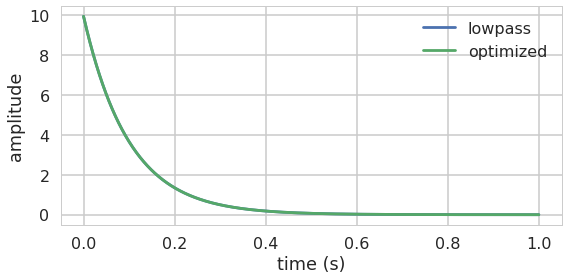

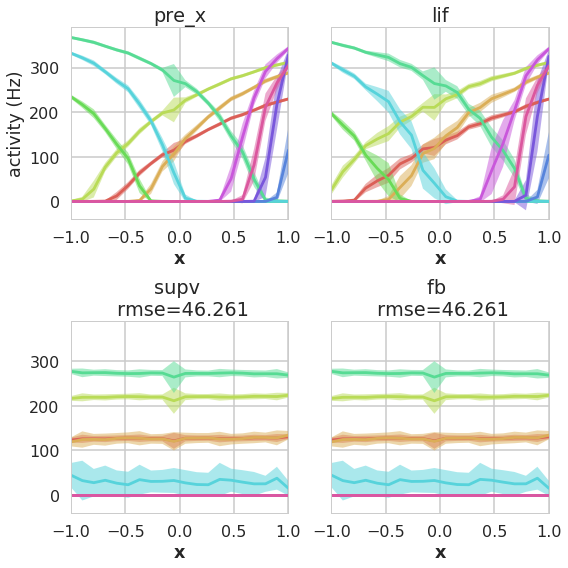

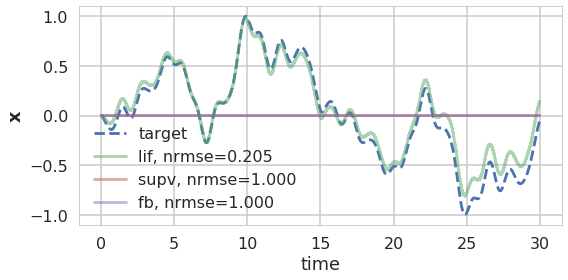

encoder learning for supv


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

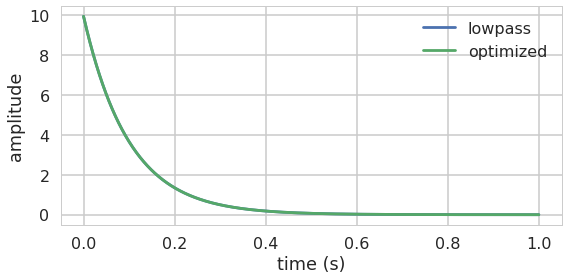

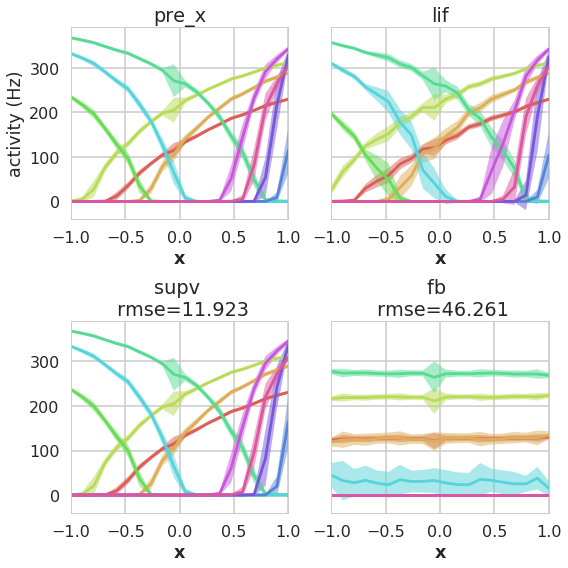

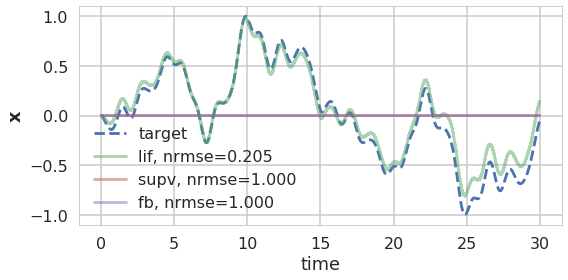

oracle method to compute readout decoders for supv (also d_fb)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

filter optimization for computing x_supv from spk_supv and d_supv


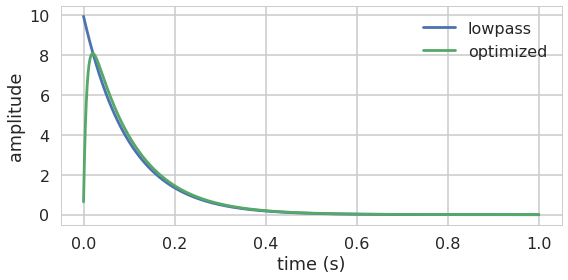

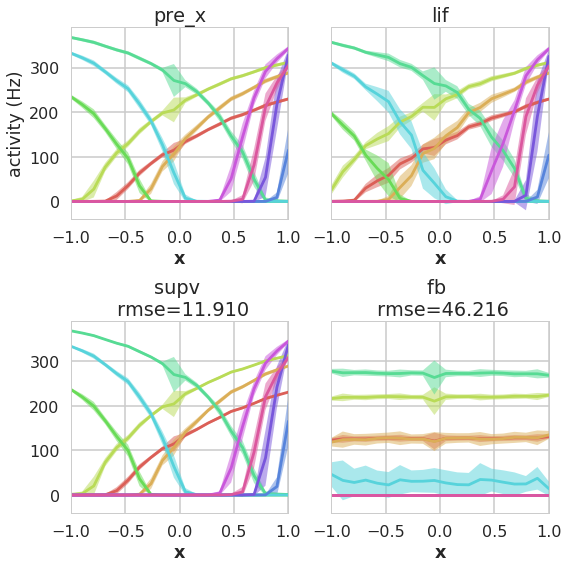

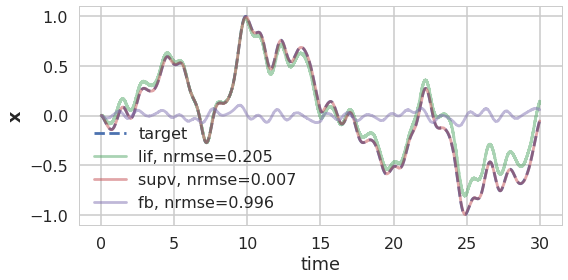

simultaneous encoder and decoder learning for weight matrix fb => fb


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

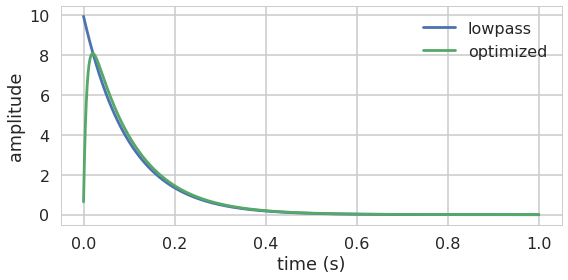

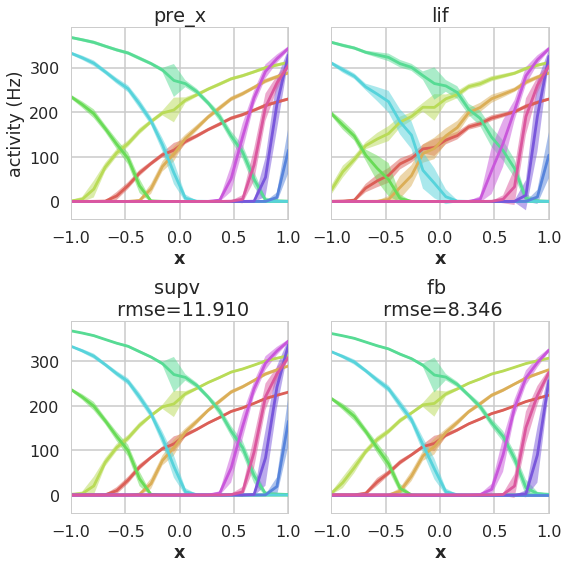

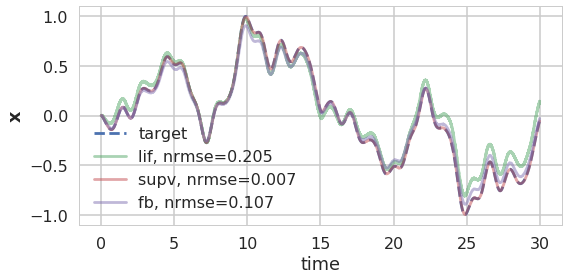

testing (no supervision)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

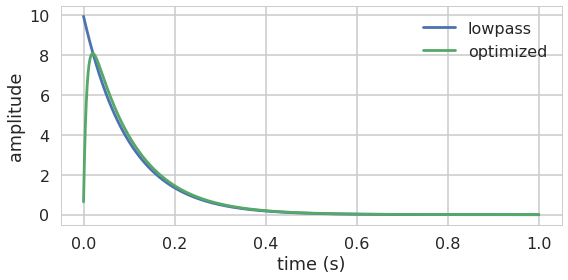

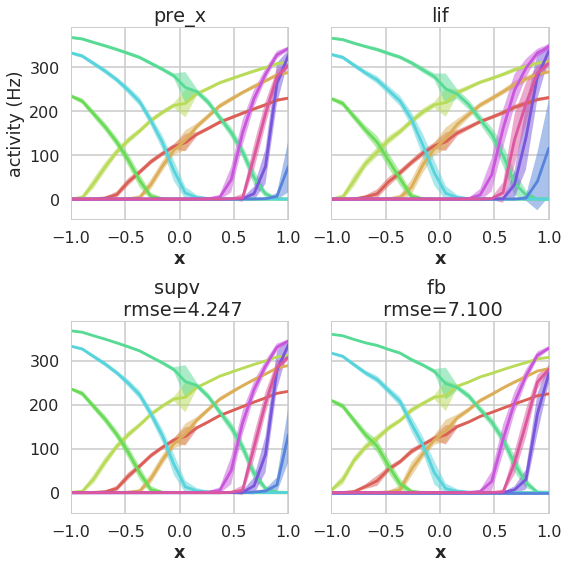

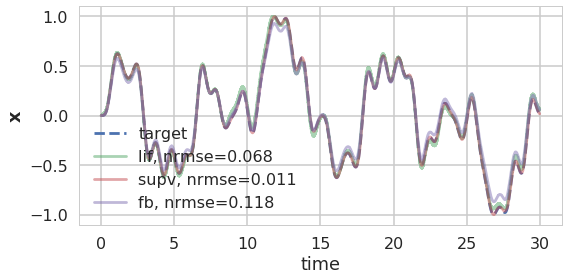

In [19]:
kwargs = dict(
    t=30,
    dt=0.001,
    dt_sample=0.001,
    dt_e=0.01,
    dt_d=0.01,
    n_neurons=100,
    freq=1,
    amp=1,
    alpha=1,
    beta=1,
    max_rates=Default,
    neuron_type=nengo.LIF(),
    taus={'network': 0.1, 'readout': 0.1},
    seeds={'ns': 1, 'ss':2, 'es': 3, 'cs': 4, 'ls': 5},
    reg=1e-2,
    eta_e=0e-6,
    eta_d=0e-6,
    n_num=1, 
    n_den=3,
    num_min=0,
    num_max=1,
    den_min=0,
    den_max=1,
    max_evals=1000,
    signal='white_noise')

run(**kwargs)

## ALIF

### default

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

oracle method to compute decoders for weight matrix pre_x => supv


/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:197: UserWarning: y0 (None!=0) does not properly initialize the system; see Nengo issue #1124.
  "Nengo issue #1124." % y0, UserWarning)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

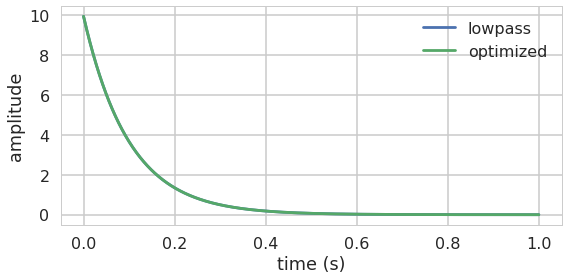

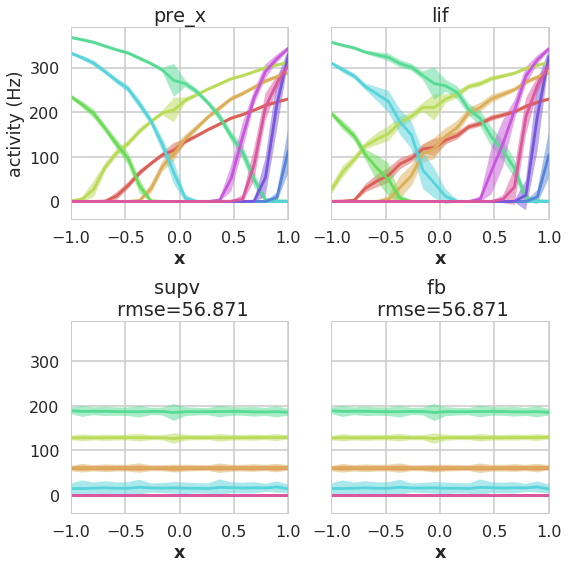

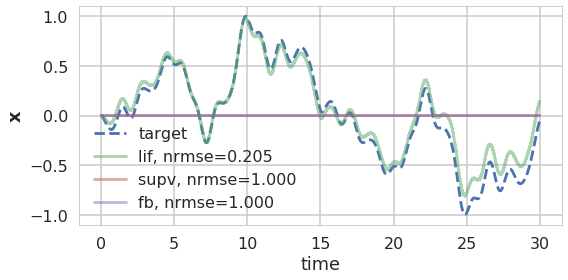

encoder learning for supv


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

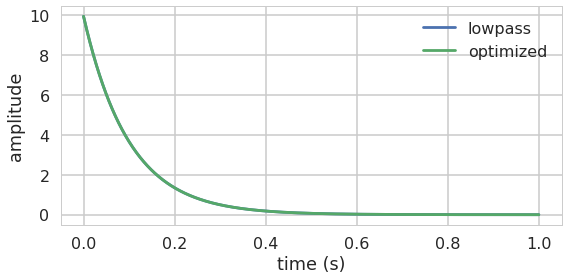

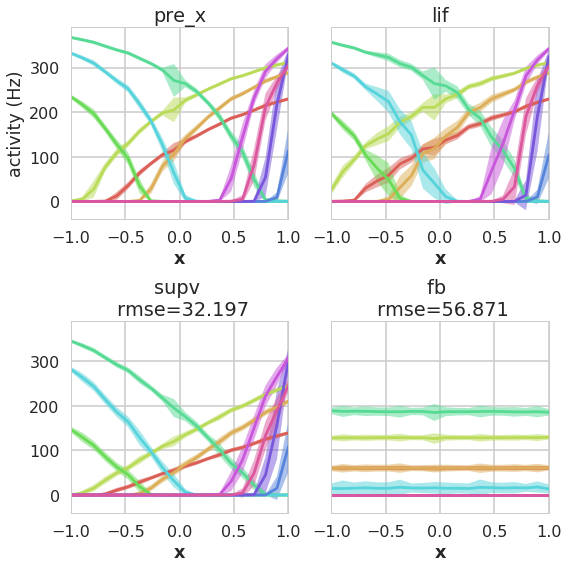

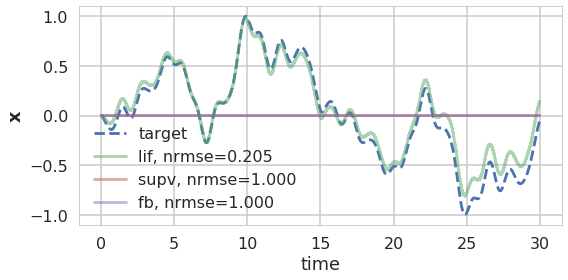

oracle method to compute readout decoders for supv (also d_fb)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

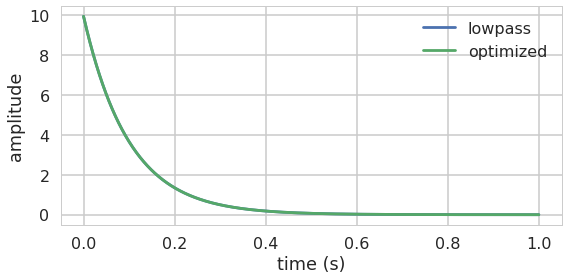

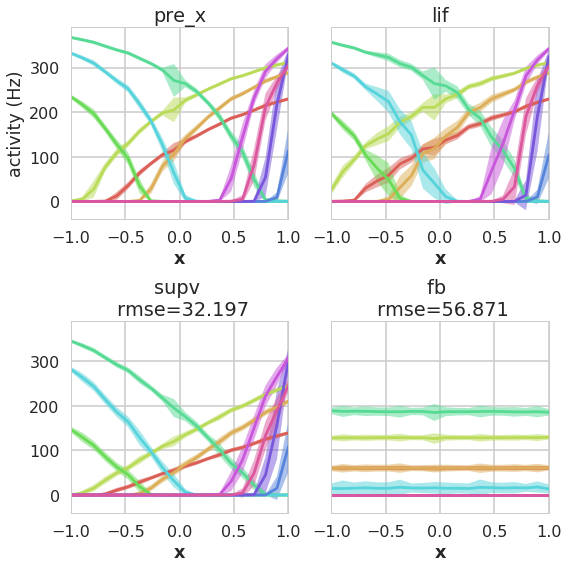

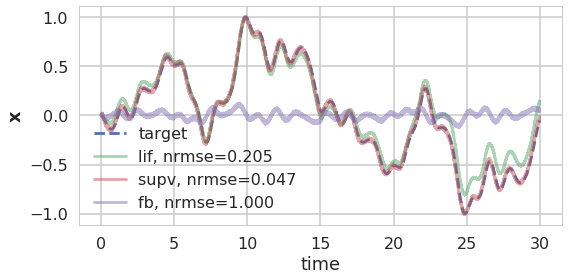

simultaneous encoder and decoder learning for weight matrix fb => fb


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

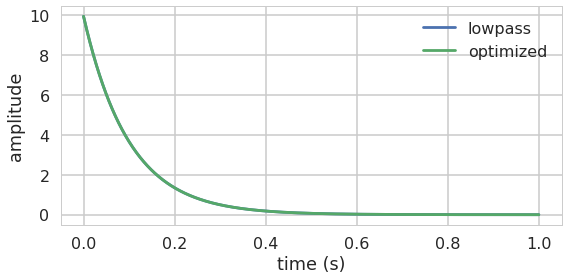

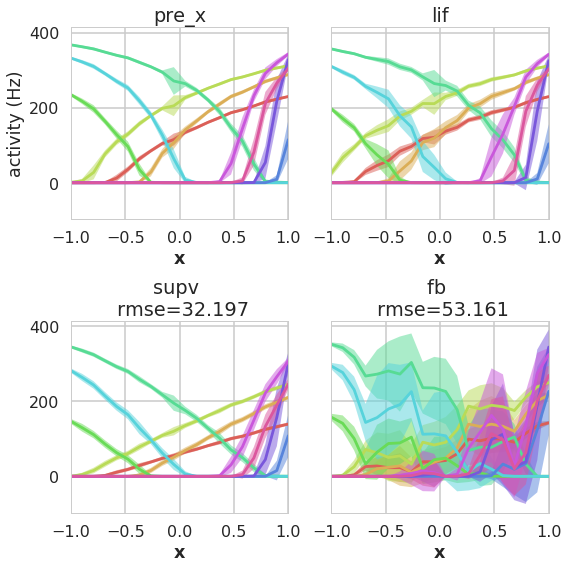

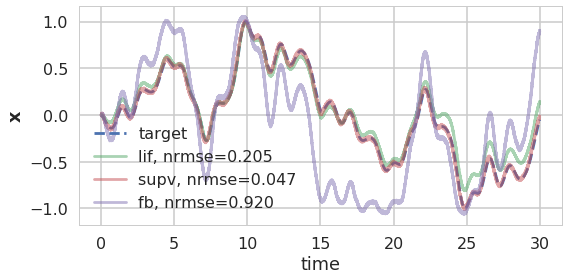

testing (no supervision)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

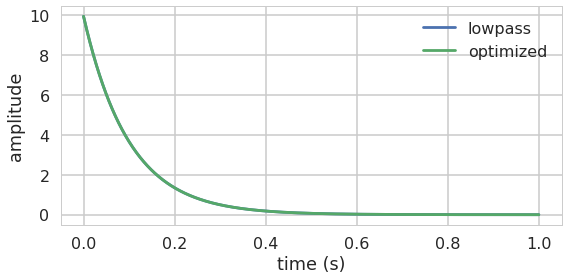

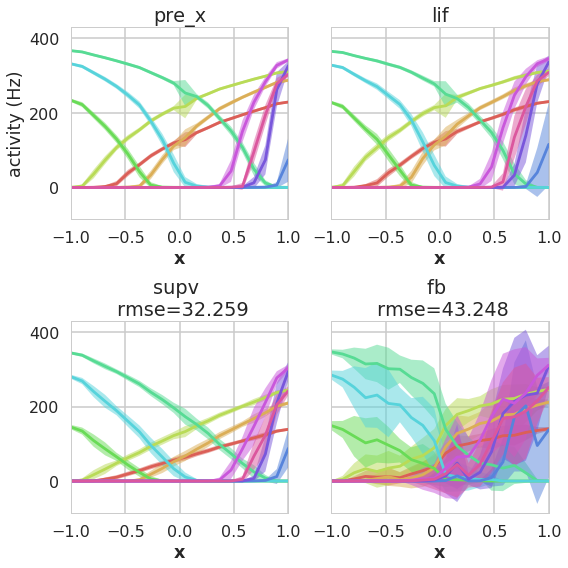

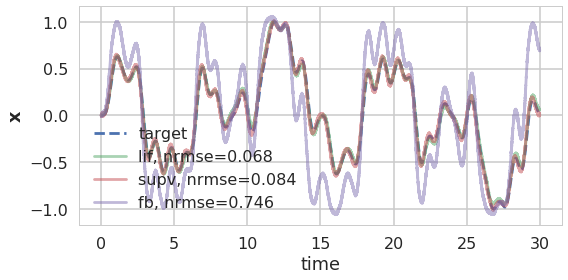

In [26]:
kwargs = dict(
    t=30,
    dt=0.001,
    dt_sample=0.001,
    dt_e=0.01,
    dt_d=0.01,
    n_neurons=100,
    freq=1,
    amp=1,
    alpha=2,
    beta=2,
    max_rates=Default,
    neuron_type=nengo.AdaptiveLIF(tau_n=0.1, inc_n=0.1),
    taus={'network': 0.1, 'readout': 0.1},
    seeds={'ns': 1, 'ss':2, 'es': 3, 'cs': 4, 'ls': 5},
    reg=1e-2,
    eta_e=0e-6,
    eta_d=0e-6,
    n_num=1, 
    n_den=3,
    num_min=0,
    num_max=1,
    den_min=0,
    den_max=1,
    max_evals=1000,
    signal='white_noise')

run(**kwargs)

### filter

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

oracle method to compute decoders for weight matrix pre_x => supv


/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:197: UserWarning: y0 (None!=0) does not properly initialize the system; see Nengo issue #1124.
  "Nengo issue #1124." % y0, UserWarning)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

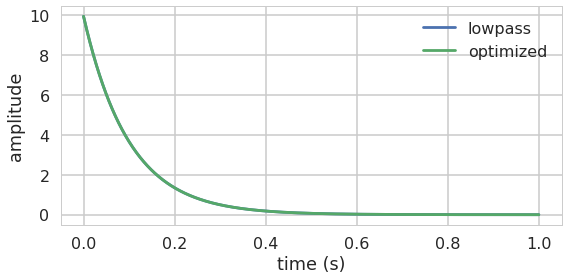

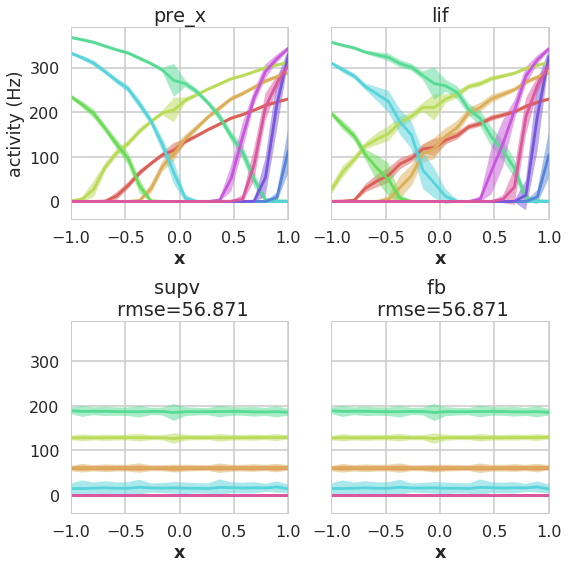

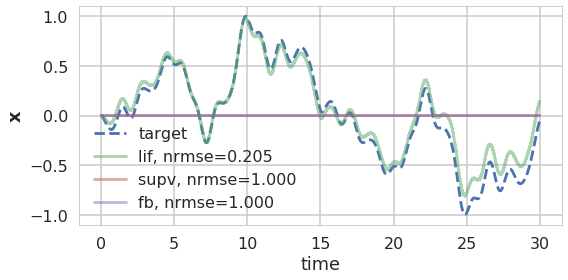

encoder learning for supv


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

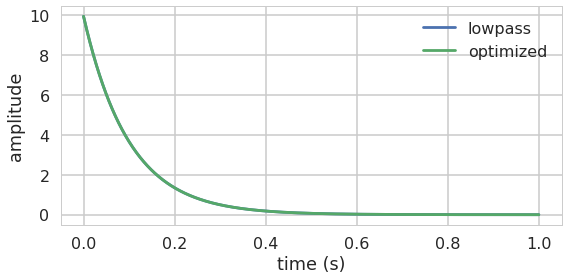

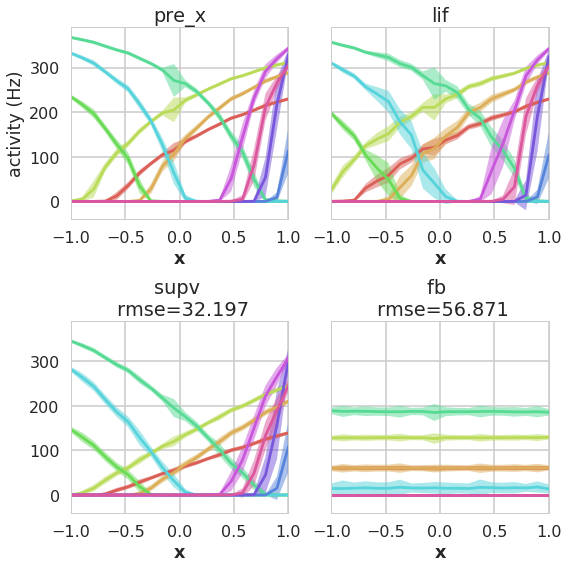

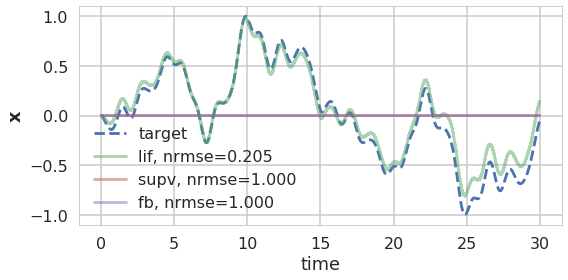

oracle method to compute readout decoders for supv (also d_fb)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

filter optimization for computing x_supv from spk_supv and d_supv


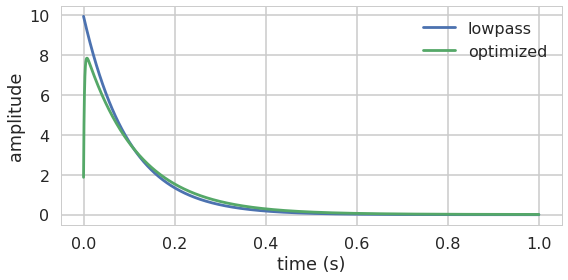

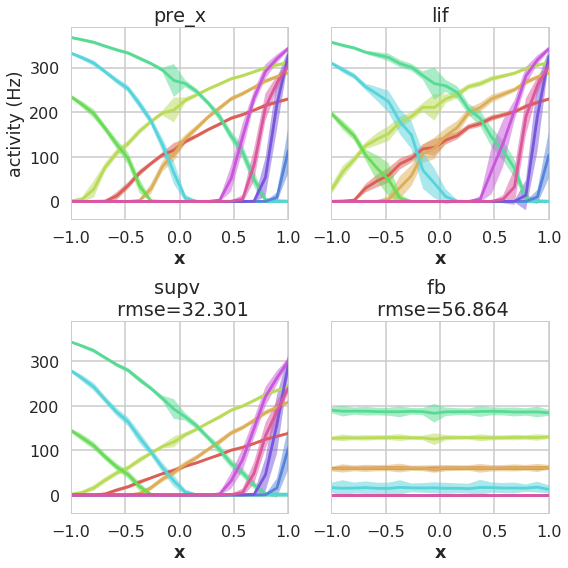

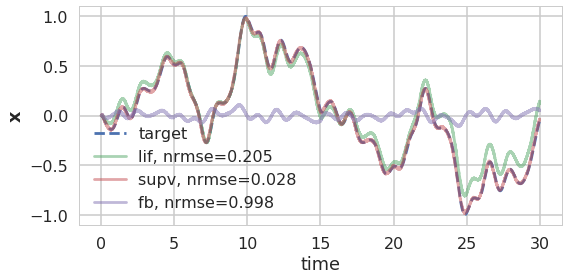

simultaneous encoder and decoder learning for weight matrix fb => fb


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

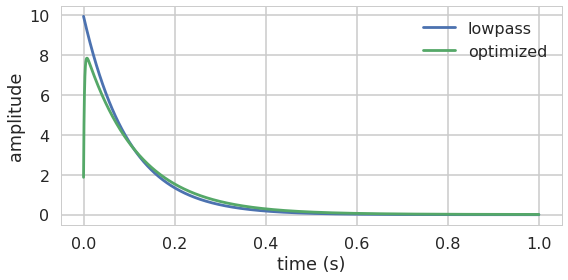

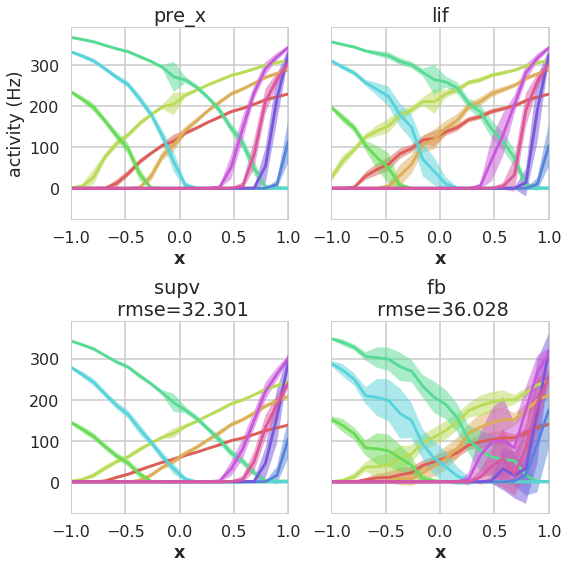

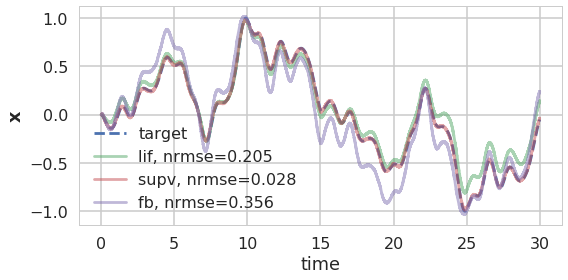

testing (no supervision)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

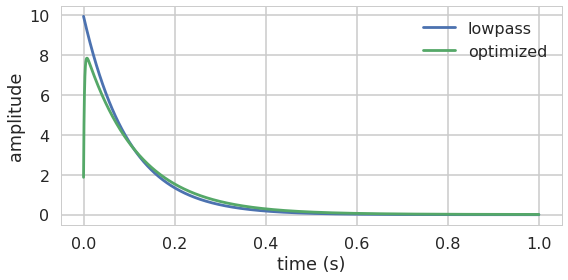

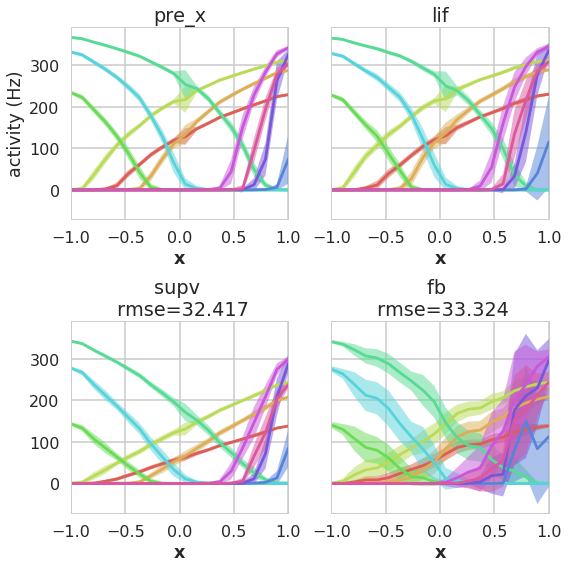

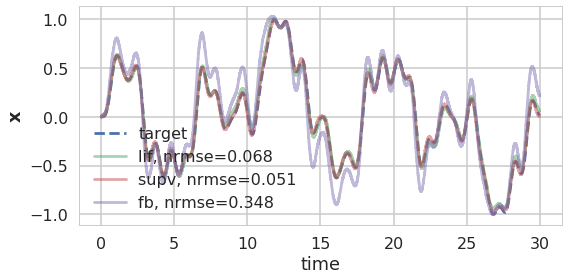

In [28]:
kwargs = dict(
    t=30,
    dt=0.001,
    dt_sample=0.001,
    dt_e=0.01,
    dt_d=0.01,
    n_neurons=100,
    freq=1,
    amp=1,
    alpha=2,
    beta=2,
    max_rates=Default,
    neuron_type=nengo.AdaptiveLIF(tau_n=0.1, inc_n=0.1),
    taus={'network': 0.1, 'readout': 0.1},
    seeds={'ns': 1, 'ss':2, 'es': 3, 'cs': 4, 'ls': 5},
    reg=1e-2,
    eta_e=0e-6,
    eta_d=0e-6,
    n_num=1, 
    n_den=3,
    num_min=0,
    num_max=1,
    den_min=0,
    den_max=1,
    max_evals=1000,
    signal='white_noise')

run(**kwargs)

### encoder learning

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

oracle method to compute decoders for weight matrix pre_x => supv


/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:197: UserWarning: y0 (None!=0) does not properly initialize the system; see Nengo issue #1124.
  "Nengo issue #1124." % y0, UserWarning)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

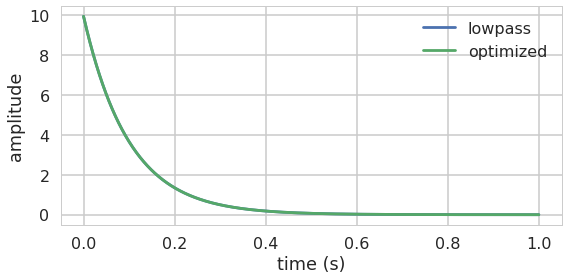

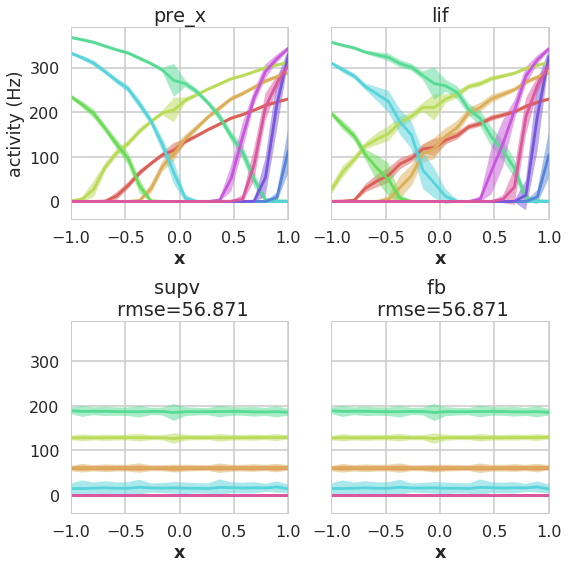

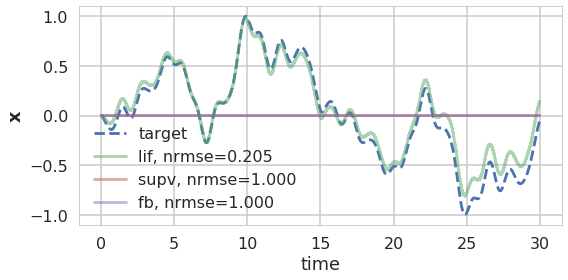

encoder learning for supv


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

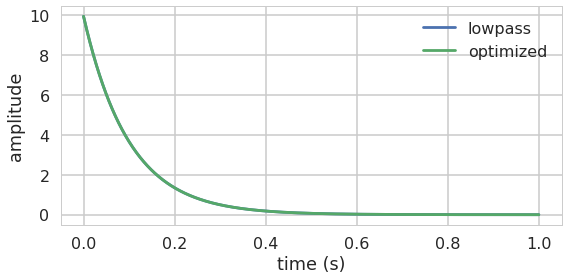

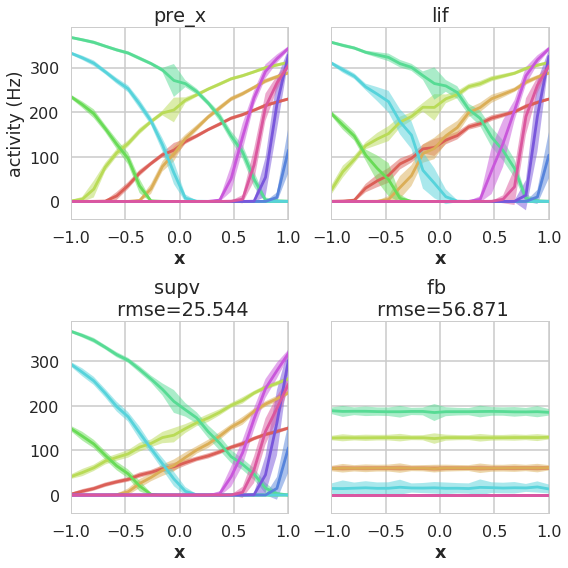

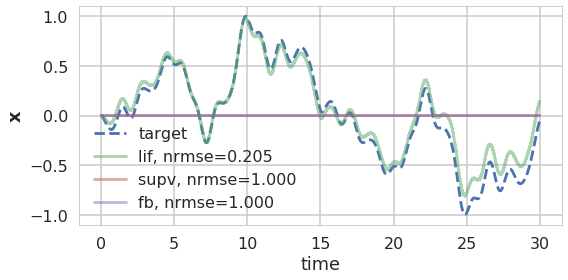

oracle method to compute readout decoders for supv (also d_fb)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

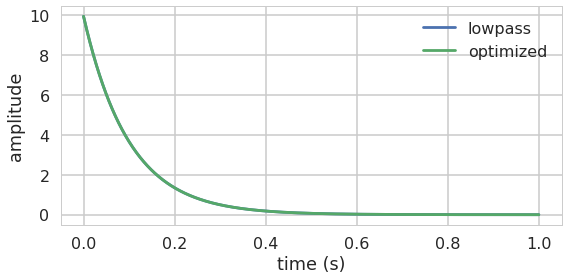

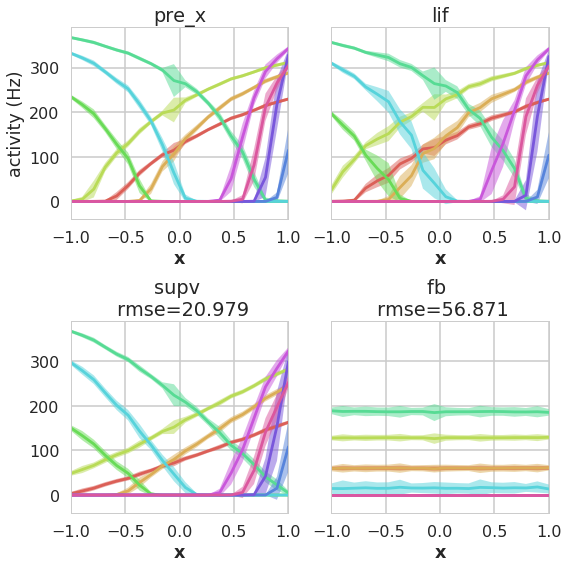

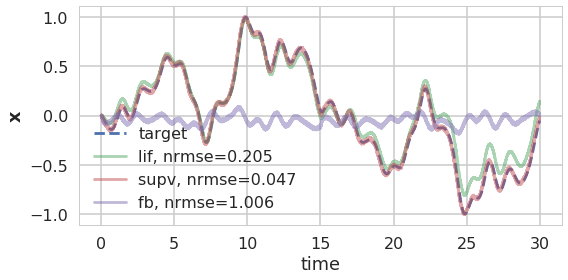

simultaneous encoder and decoder learning for weight matrix fb => fb


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

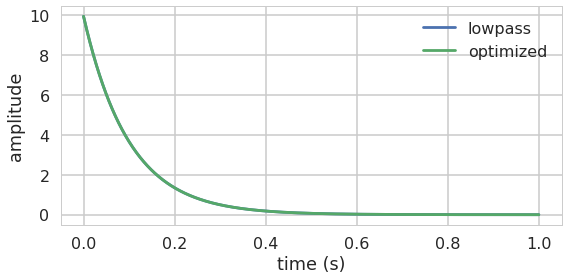

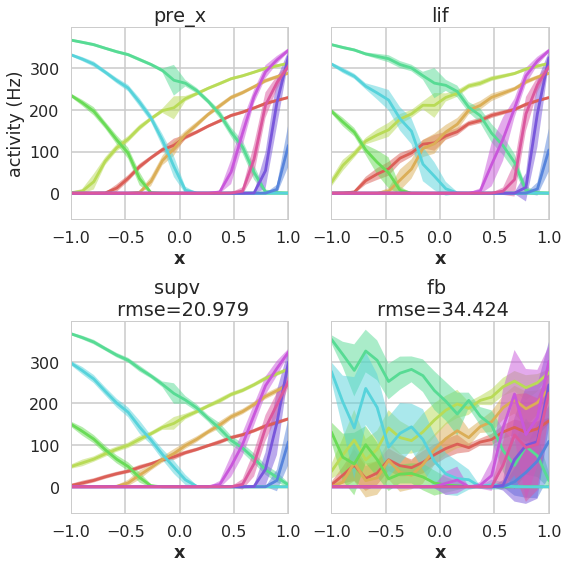

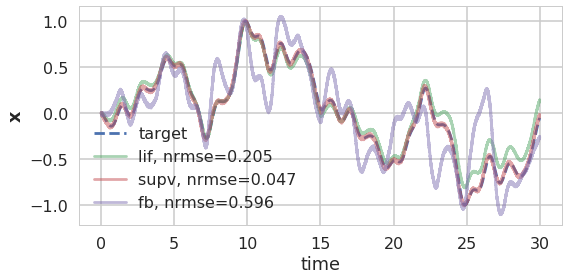

testing (no supervision)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

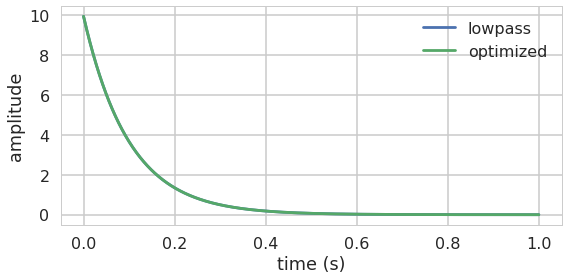

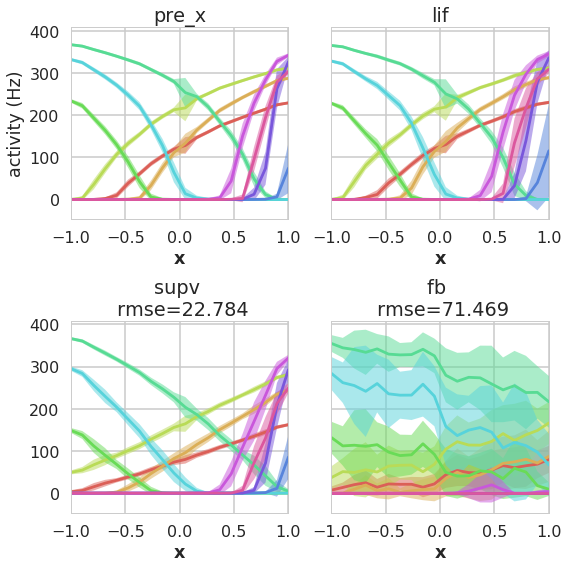

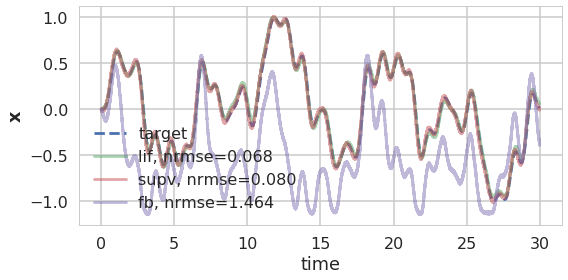

In [26]:
kwargs = dict(
    t=30,
    dt=0.001,
    dt_sample=0.001,
    dt_e=0.01,
    dt_d=0.01,
    n_neurons=100,
    freq=1,
    amp=1,
    alpha=2,
    beta=2,
    max_rates=Default,
    neuron_type=nengo.AdaptiveLIF(tau_n=0.1, inc_n=0.1),
    taus={'network': 0.1, 'readout': 0.1, 'learn': 0.01},
    seeds={'ns': 1, 'ss':2, 'es': 3, 'cs': 4, 'ls': 5},
    reg=1e-2,
    eta_e=2e-6,
    eta_d=0e-6,
    n_num=1, 
    n_den=3,
    num_min=0,
    num_max=1,
    den_min=0,
    den_max=1,
    max_evals=1000,
    signal='white_noise')

run(**kwargs)

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

oracle method to compute decoders for weight matrix pre_x => supv


/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:197: UserWarning: y0 (None!=0) does not properly initialize the system; see Nengo issue #1124.
  "Nengo issue #1124." % y0, UserWarning)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

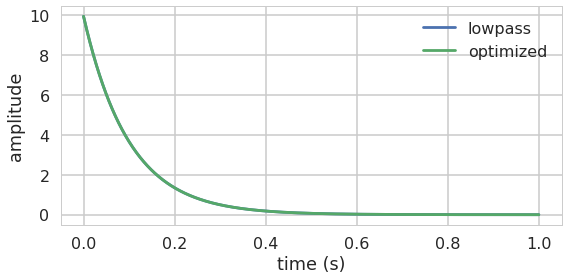

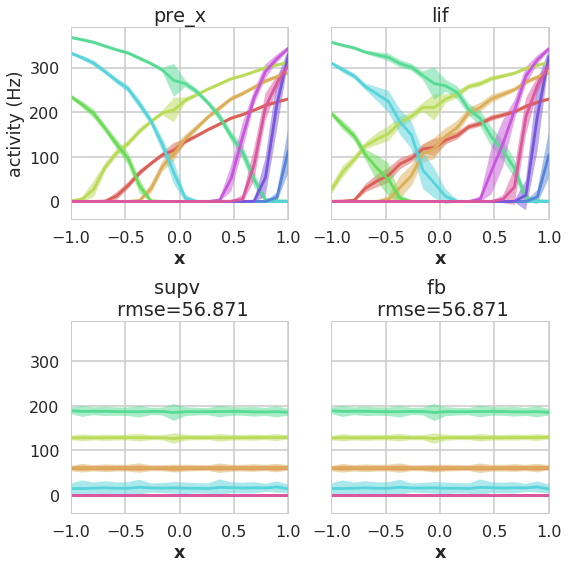

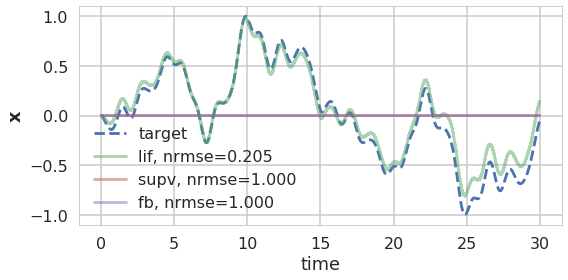

encoder learning for supv


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

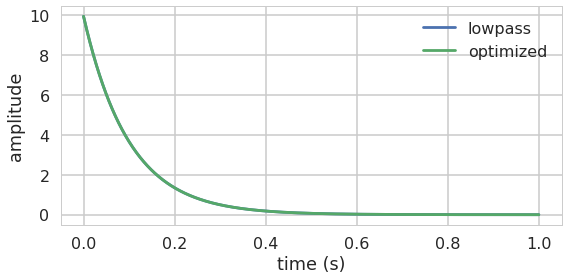

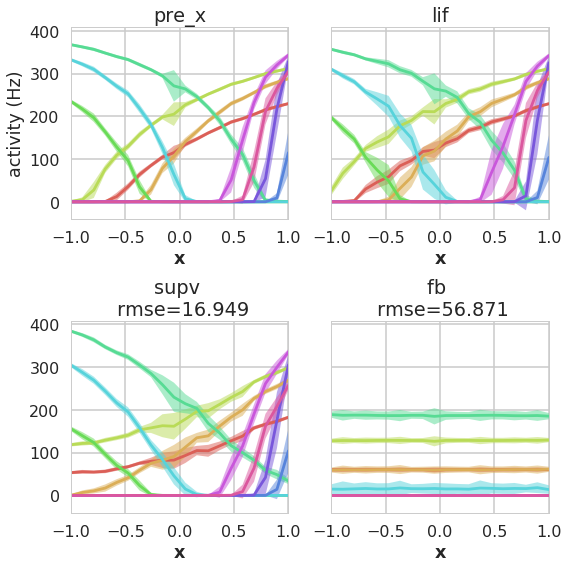

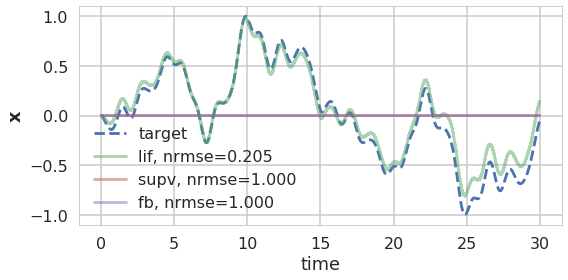

oracle method to compute readout decoders for supv (also d_fb)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

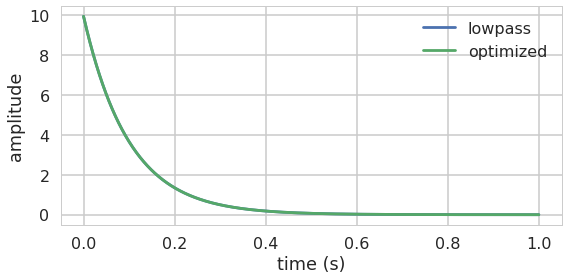

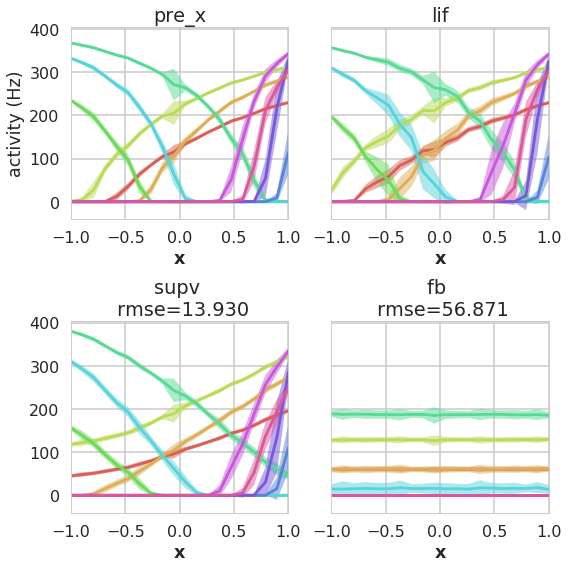

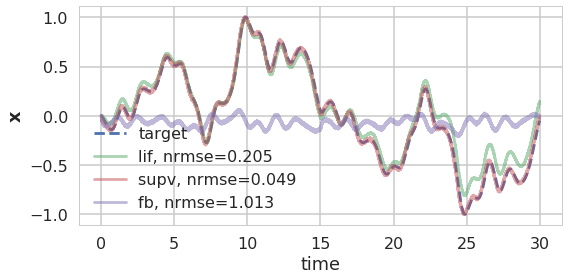

simultaneous encoder and decoder learning for weight matrix fb => fb


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

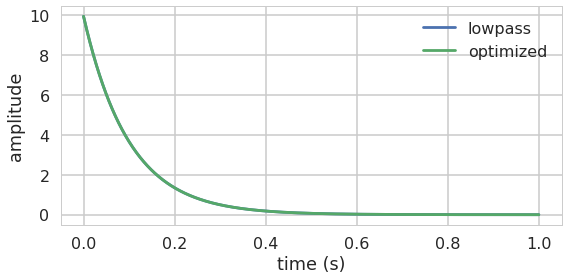

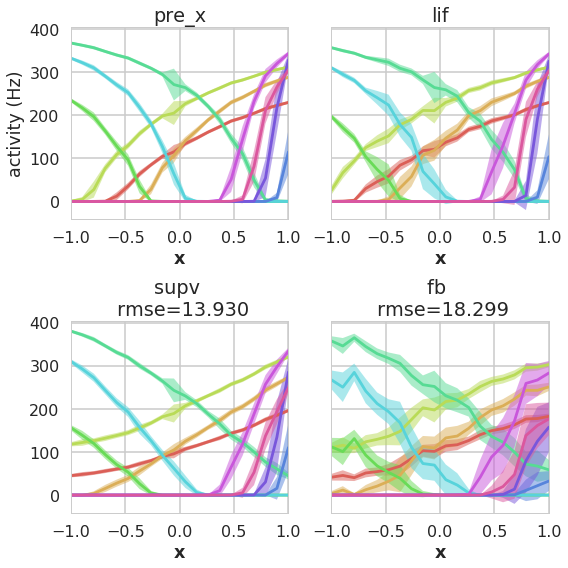

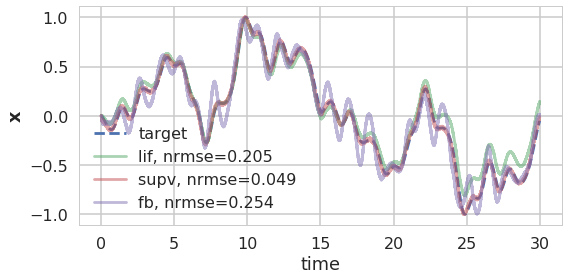

testing (no supervision)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

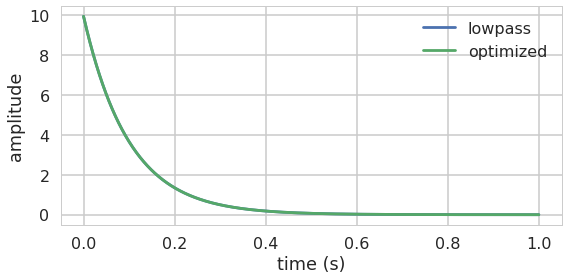

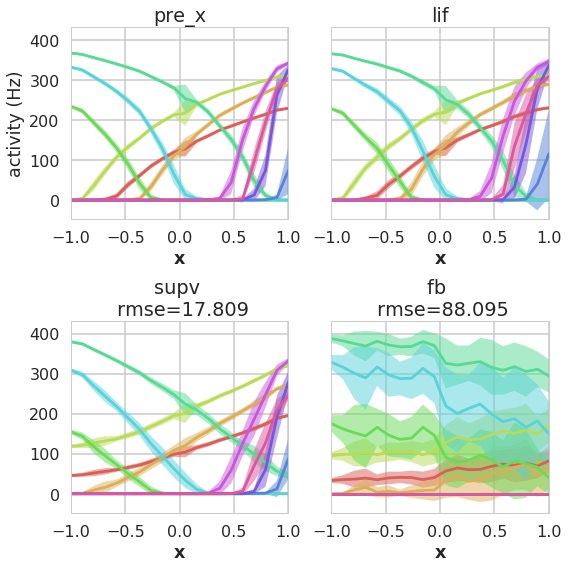

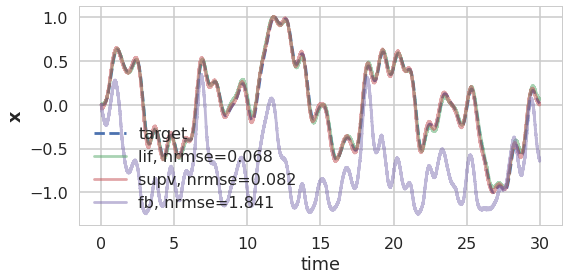

In [31]:
kwargs = dict(
    t=30,
    dt=0.001,
    dt_sample=0.001,
    dt_e=0.01,
    dt_d=0.01,
    n_neurons=100,
    freq=1,
    amp=1,
    alpha=2,
    beta=2,
    max_rates=Default,
    neuron_type=nengo.AdaptiveLIF(tau_n=0.1, inc_n=0.1),
    taus={'network': 0.1, 'readout': 0.1, 'learn': 0.01},
    seeds={'ns': 1, 'ss':2, 'es': 3, 'cs': 4, 'ls': 5},
    reg=1e-2,
    eta_e=1e-5,
    eta_d=0e-6,
    n_num=1, 
    n_den=3,
    num_min=0,
    num_max=1,
    den_min=0,
    den_max=1,
    max_evals=1000,
    signal='white_noise')

run(**kwargs)

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

oracle method to compute decoders for weight matrix pre_x => supv


/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:197: UserWarning: y0 (None!=0) does not properly initialize the system; see Nengo issue #1124.
  "Nengo issue #1124." % y0, UserWarning)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

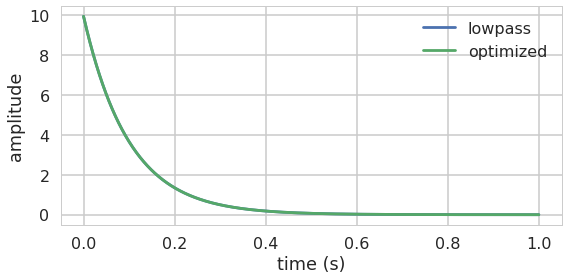

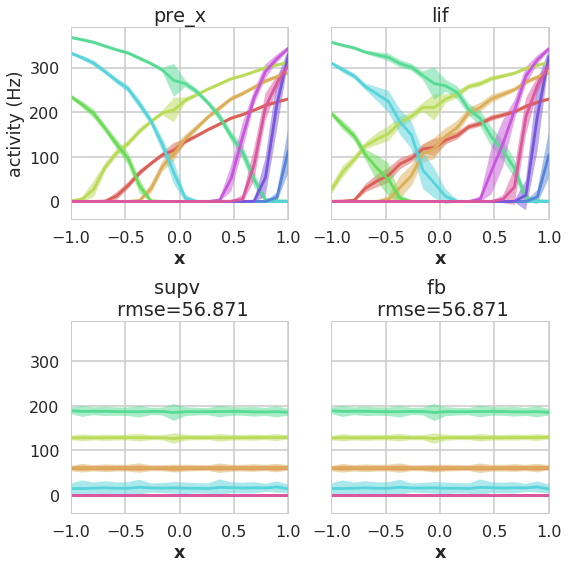

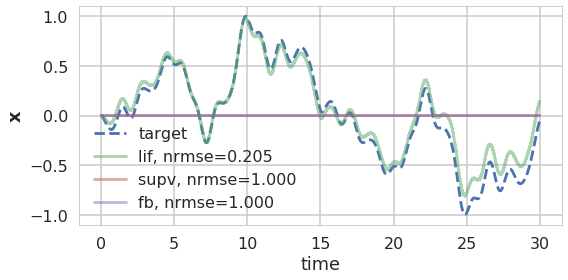

encoder learning for supv


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

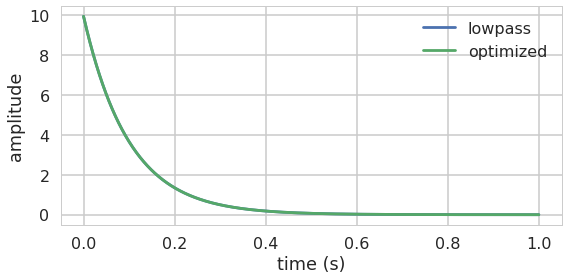

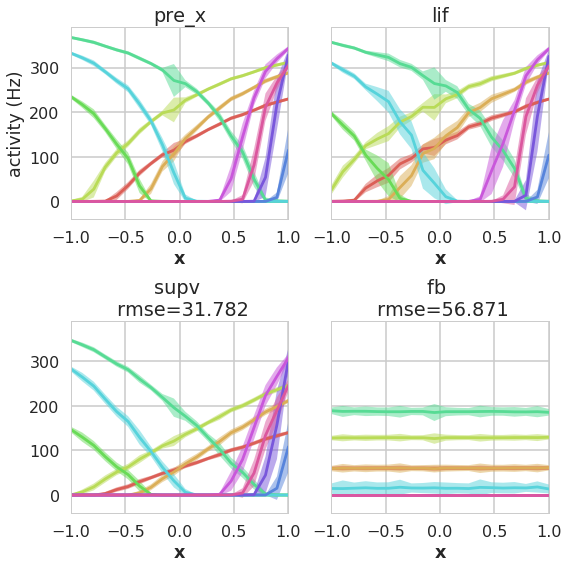

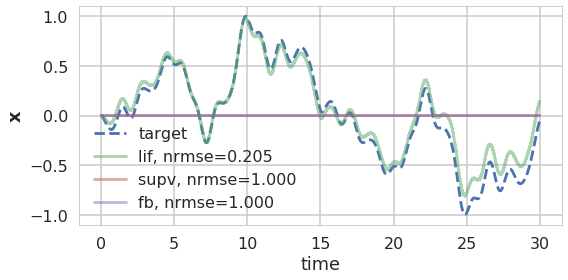

oracle method to compute readout decoders for supv (also d_fb)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

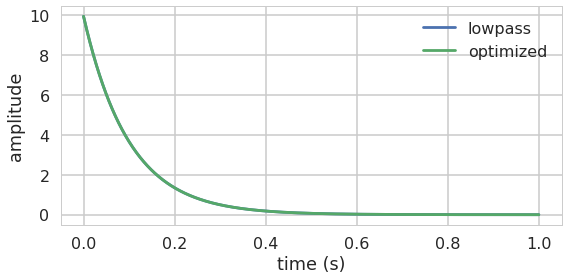

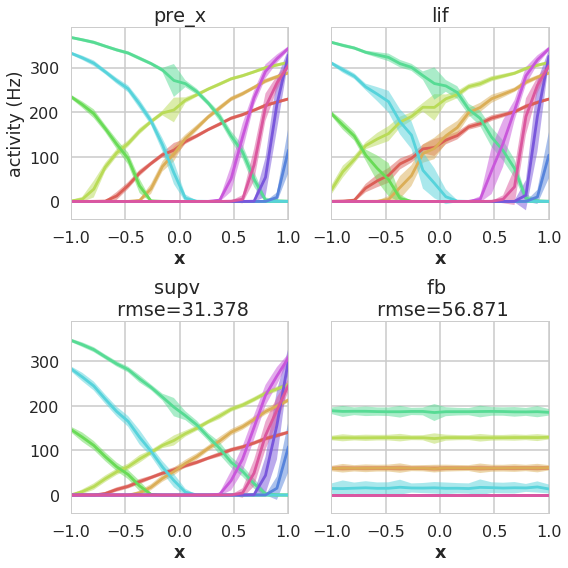

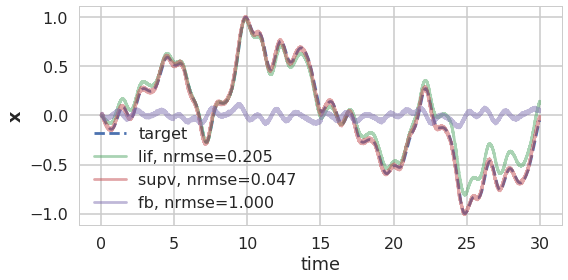

simultaneous encoder and decoder learning for weight matrix fb => fb


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

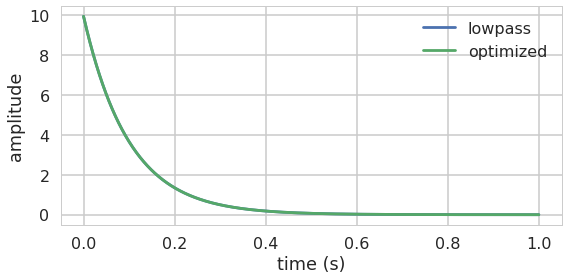

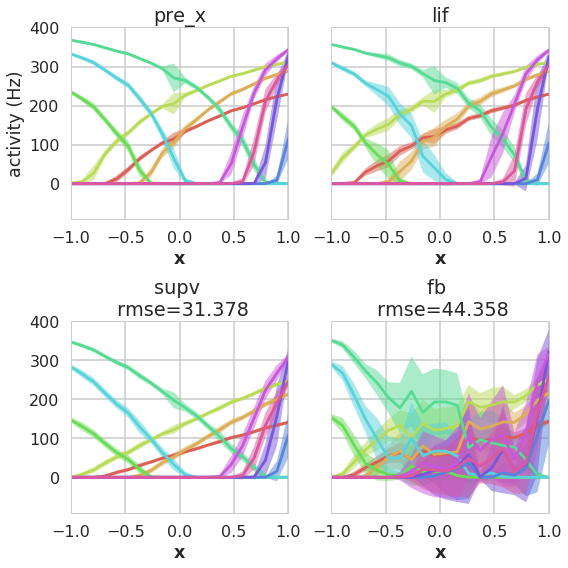

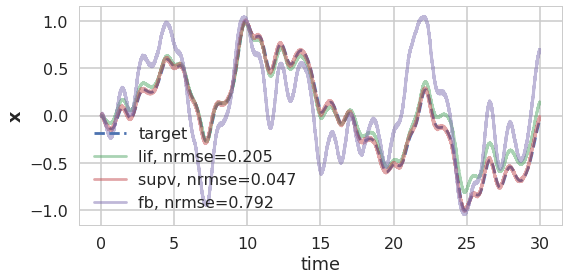

testing (no supervision)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

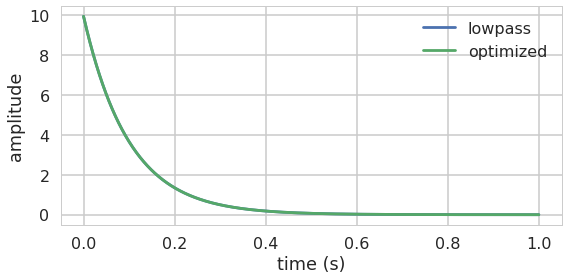

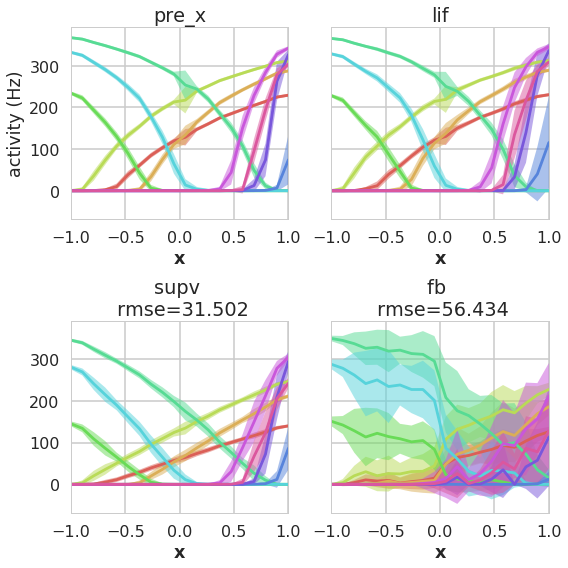

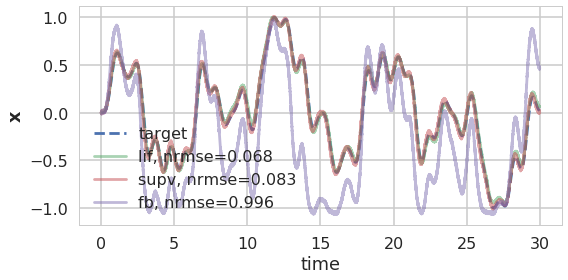

In [21]:
kwargs = dict(
    t=30,
    dt=0.001,
    dt_sample=0.001,
    dt_e=0.01,
    dt_d=0.01,
    n_neurons=100,
    freq=1,
    amp=1,
    alpha=2,
    beta=2,
    max_rates=Default,
    neuron_type=nengo.AdaptiveLIF(tau_n=0.1, inc_n=0.1),
    taus={'network': 0.1, 'readout': 0.1},
    seeds={'ns': 1, 'ss':2, 'es': 3, 'cs': 4, 'ls': 5},
    reg=1e-2,
    eta_e=1e-7,
    eta_d=0e-6,
    n_num=1, 
    n_den=3,
    num_min=0,
    num_max=1,
    den_min=0,
    den_max=1,
    max_evals=1000,
    signal='white_noise')

run(**kwargs)

random encoder update

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

oracle method to compute decoders for weight matrix pre_x => supv


/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:197: UserWarning: y0 (None!=0) does not properly initialize the system; see Nengo issue #1124.
  "Nengo issue #1124." % y0, UserWarning)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

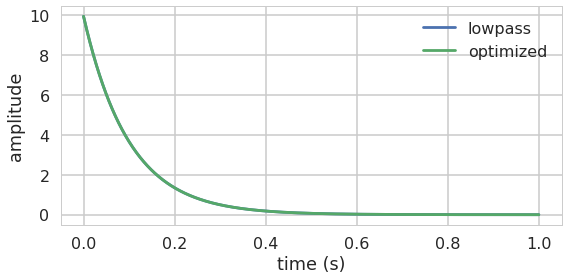

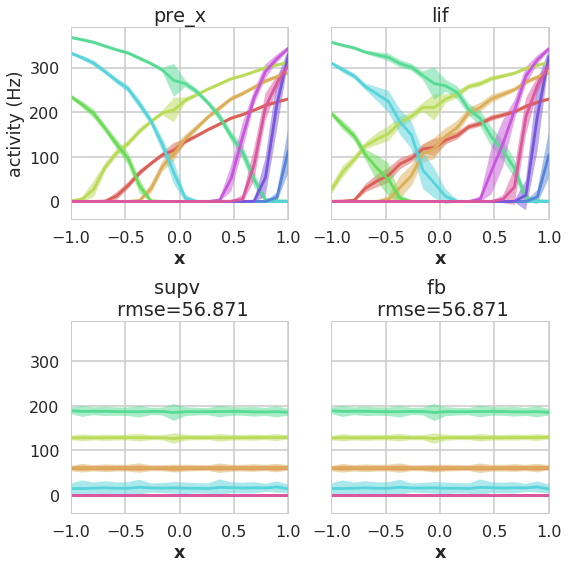

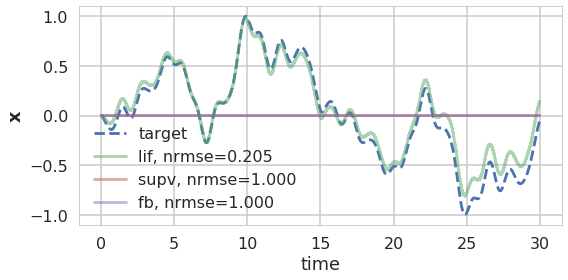

encoder learning for supv


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

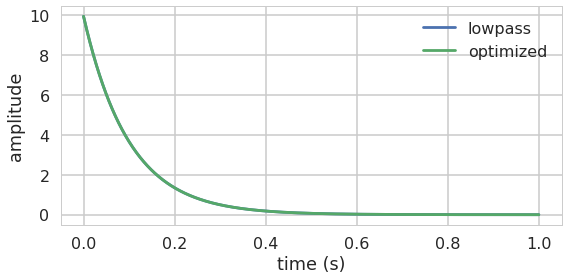

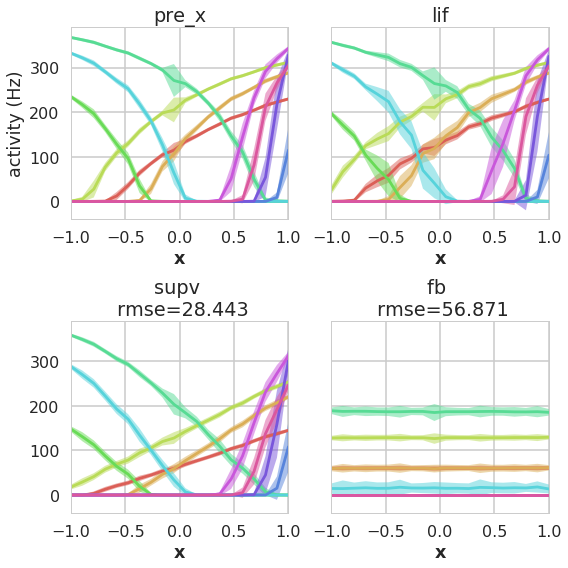

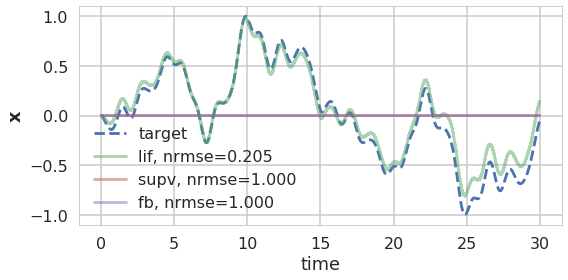

oracle method to compute readout decoders for supv (also d_fb)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

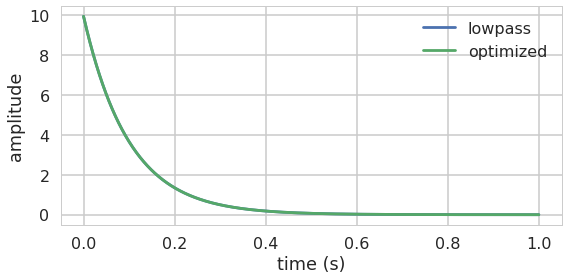

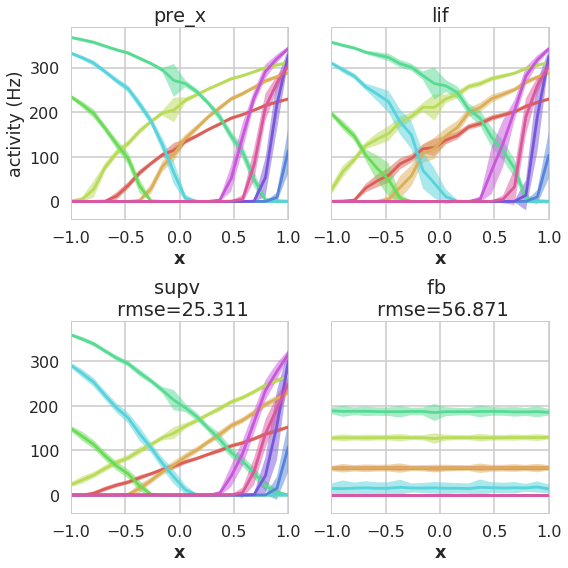

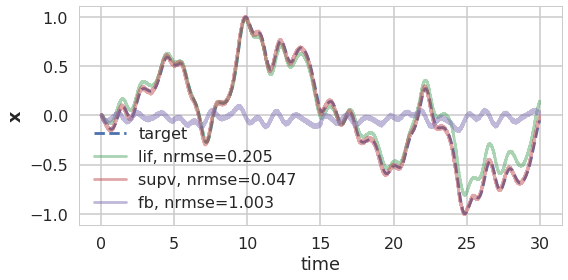

simultaneous encoder and decoder learning for weight matrix fb => fb


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

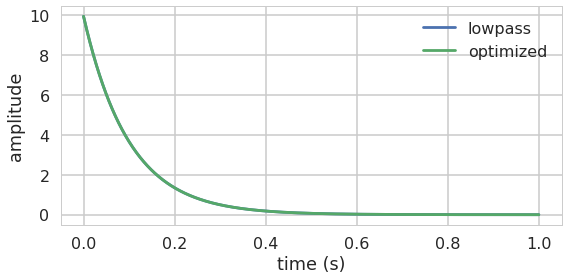

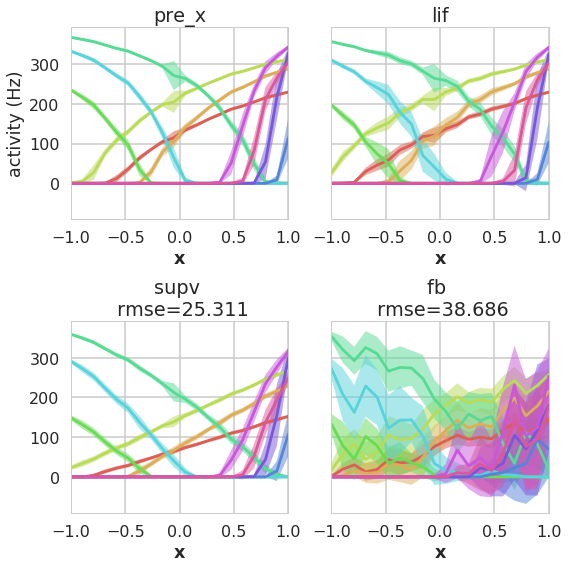

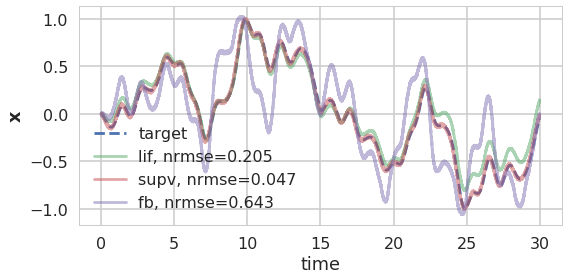

testing (no supervision)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

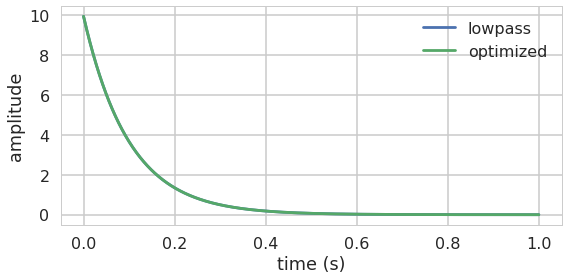

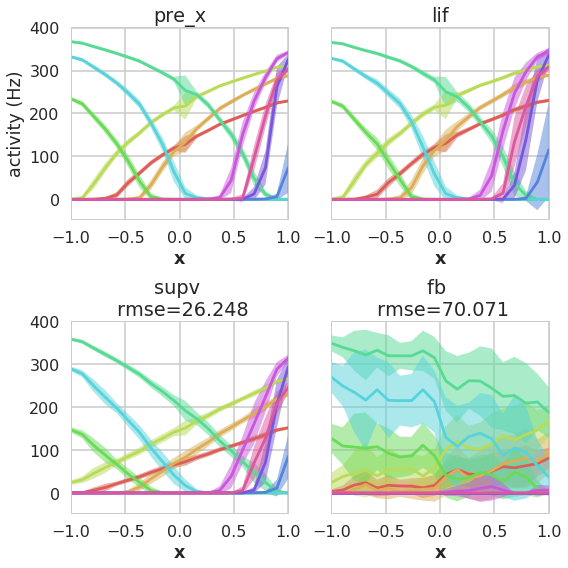

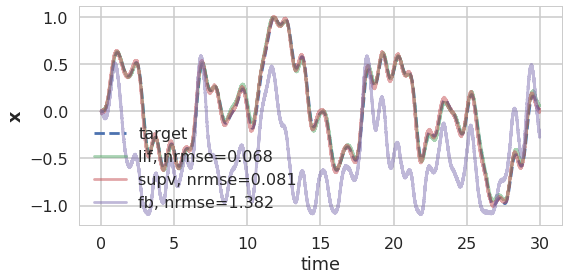

In [18]:
kwargs = dict(
    t=30,
    dt=0.001,
    dt_sample=0.001,
    dt_e=0.01,
    dt_d=0.01,
    n_neurons=100,
    freq=1,
    amp=1,
    alpha=2,
    beta=2,
    max_rates=Default,
    neuron_type=nengo.AdaptiveLIF(tau_n=0.1, inc_n=0.1),
    taus={'network': 0.1, 'readout': 0.1},
    seeds={'ns': 1, 'ss':2, 'es': 3, 'cs': 4, 'ls': 5},
    reg=1e-2,
    eta_e=1e-6,
    eta_d=0e-6,
    n_num=1, 
    n_den=3,
    num_min=0,
    num_max=1,
    den_min=0,
    den_max=1,
    max_evals=1000,
    signal='white_noise')

run(**kwargs)

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

oracle method to compute decoders for weight matrix pre_x => supv


/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:197: UserWarning: y0 (None!=0) does not properly initialize the system; see Nengo issue #1124.
  "Nengo issue #1124." % y0, UserWarning)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

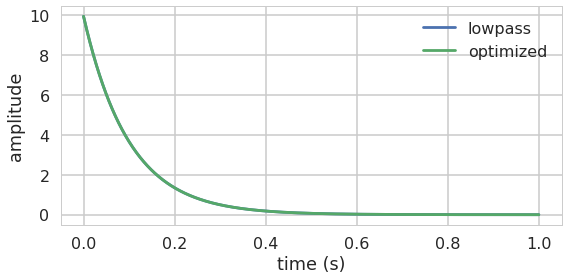

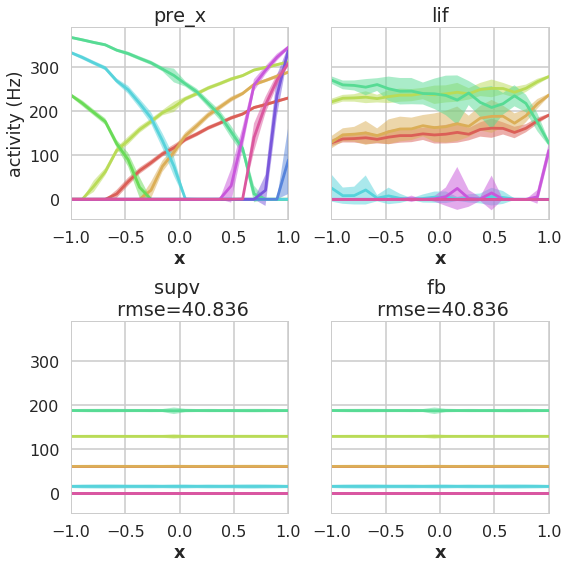

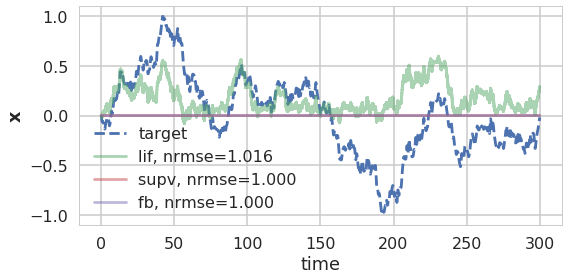

encoder learning for supv


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

KeyboardInterrupt: 

In [19]:
kwargs = dict(
    t=300,
    dt=0.001,
    dt_sample=0.001,
    dt_e=0.01,
    dt_d=0.01,
    n_neurons=100,
    freq=1,
    amp=1,
    alpha=2,
    beta=2,
    max_rates=Default,
    neuron_type=nengo.AdaptiveLIF(tau_n=0.1, inc_n=0.1),
    taus={'network': 0.1, 'readout': 0.1},
    seeds={'ns': 1, 'ss':2, 'es': 3, 'cs': 4, 'ls': 5},
    reg=1e-2,
    eta_e=1e-6,
    eta_d=0e-6,
    n_num=1, 
    n_den=3,
    num_min=0,
    num_max=1,
    den_min=0,
    den_max=1,
    max_evals=1000,
    signal='white_noise')

run(**kwargs)

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

oracle method to compute decoders for weight matrix pre_x => supv


/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:197: UserWarning: y0 (None!=0) does not properly initialize the system; see Nengo issue #1124.
  "Nengo issue #1124." % y0, UserWarning)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

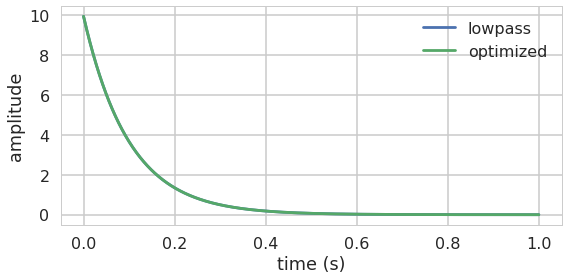

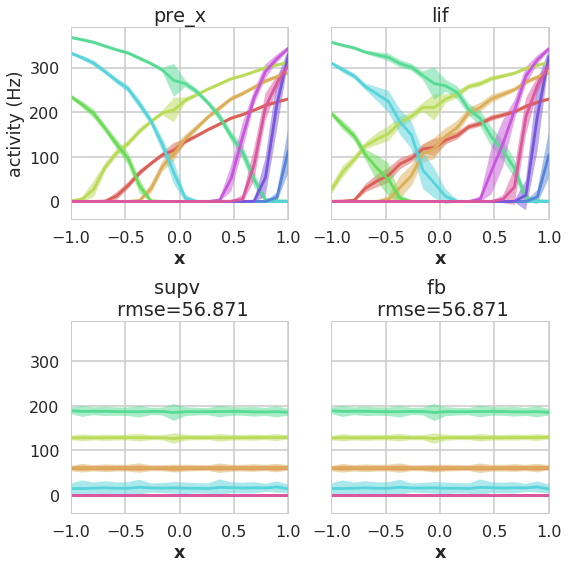

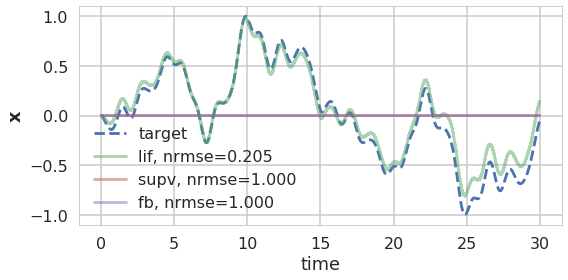

encoder learning for supv


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

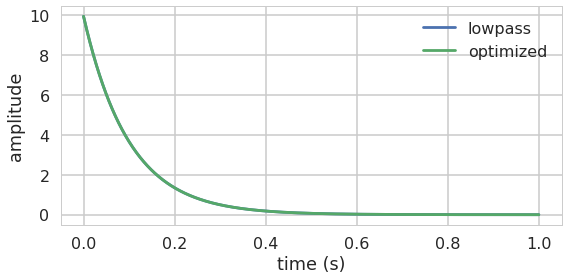

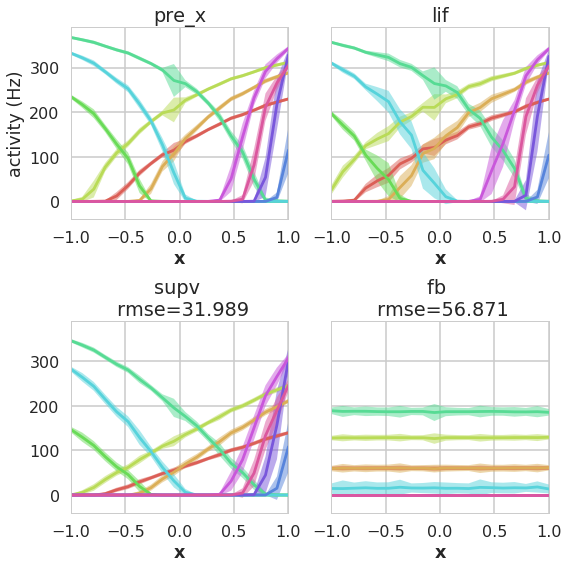

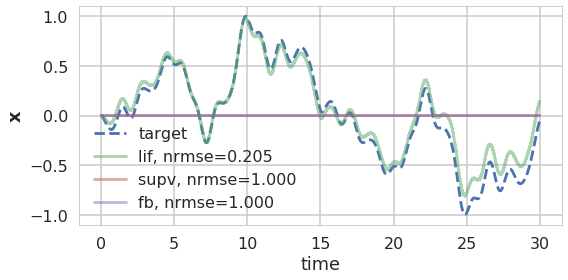

oracle method to compute readout decoders for supv (also d_fb)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

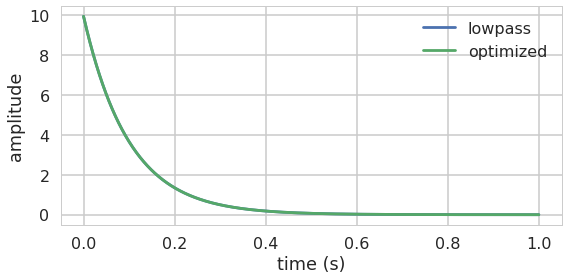

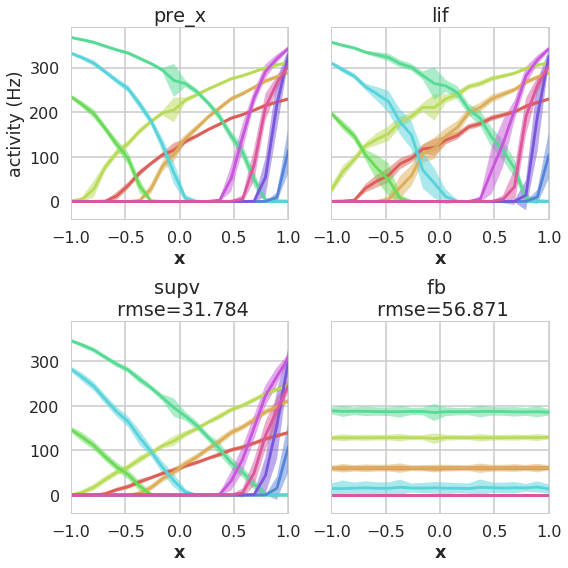

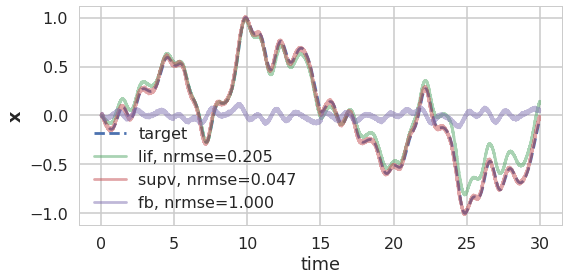

simultaneous encoder and decoder learning for weight matrix fb => fb


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

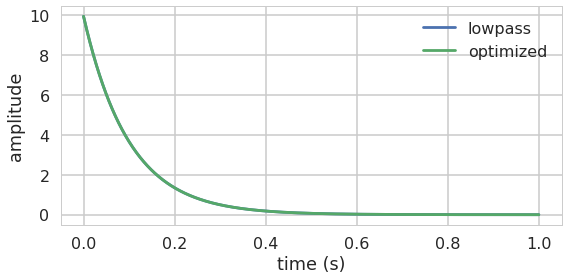

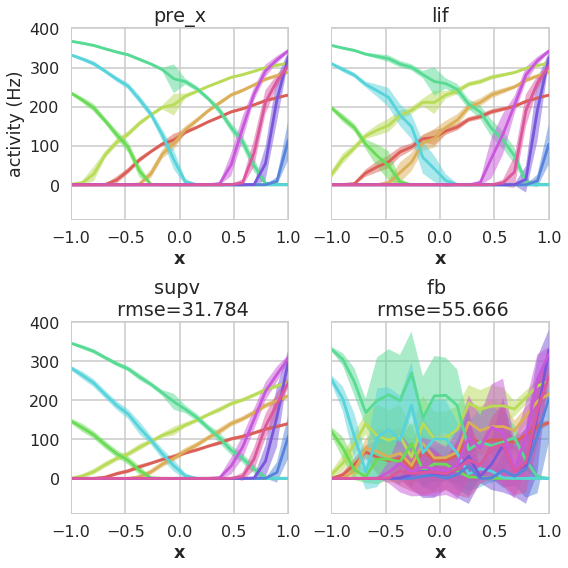

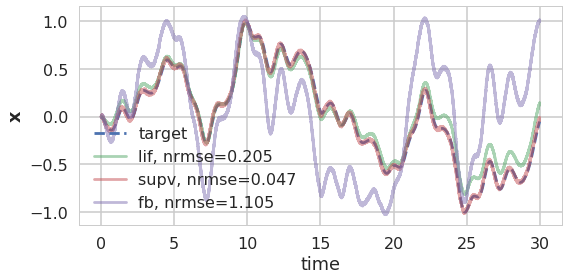

testing (no supervision)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

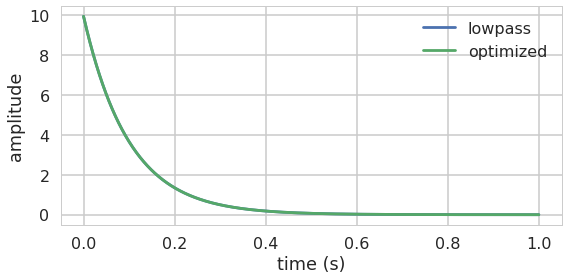

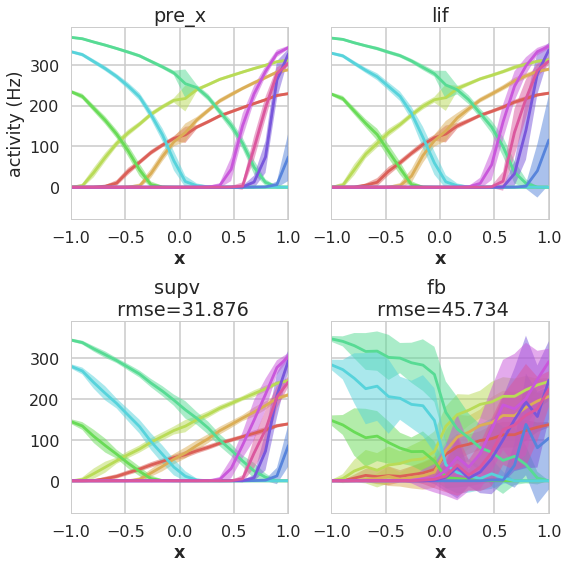

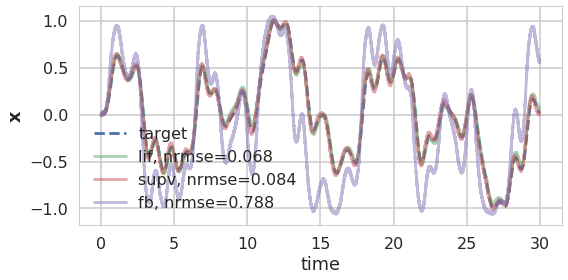

In [23]:
kwargs = dict(
    t=30,
    dt=0.001,
    dt_sample=0.001,
    dt_e=0.01,
    dt_d=0.01,
    n_neurons=100,
    freq=1,
    amp=1,
    alpha=2,
    beta=2,
    max_rates=Default,
    neuron_type=nengo.AdaptiveLIF(tau_n=0.1, inc_n=0.1),
    taus={'network': 0.1, 'readout': 0.1},
    seeds={'ns': 1, 'ss':2, 'es': 3, 'cs': 4, 'ls': 5},
    reg=1e-2,
    eta_e=1e-7,
    eta_d=0e-6,
    n_num=1, 
    n_den=3,
    num_min=0,
    num_max=1,
    den_min=0,
    den_max=1,
    max_evals=1000,
    signal='white_noise')

run(**kwargs)

### decoder learning

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

oracle method to compute decoders for weight matrix pre_x => supv


/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:197: UserWarning: y0 (None!=0) does not properly initialize the system; see Nengo issue #1124.
  "Nengo issue #1124." % y0, UserWarning)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

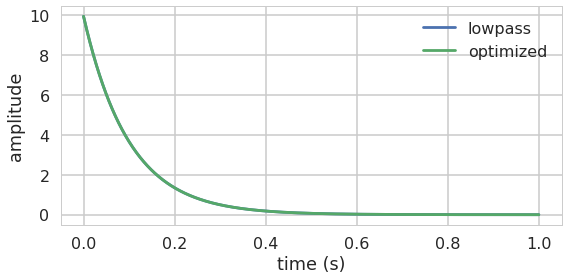

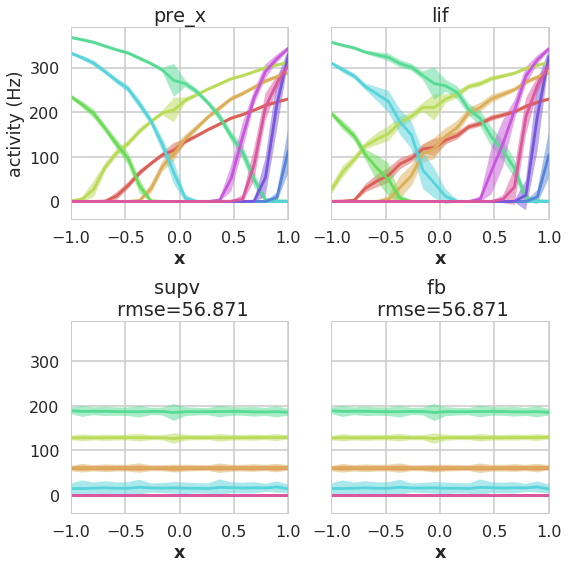

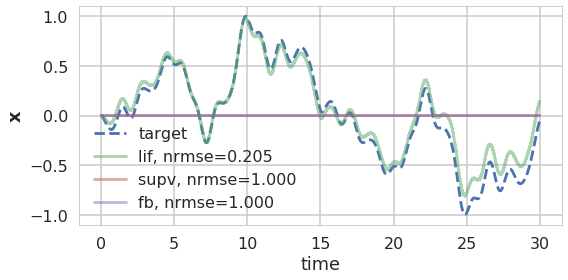

encoder learning for supv


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

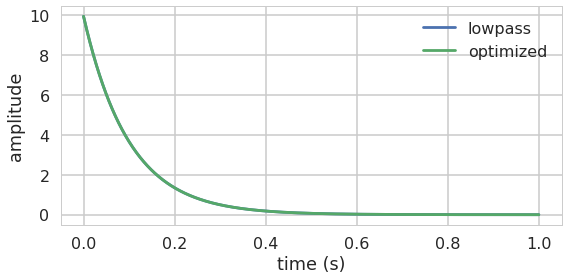

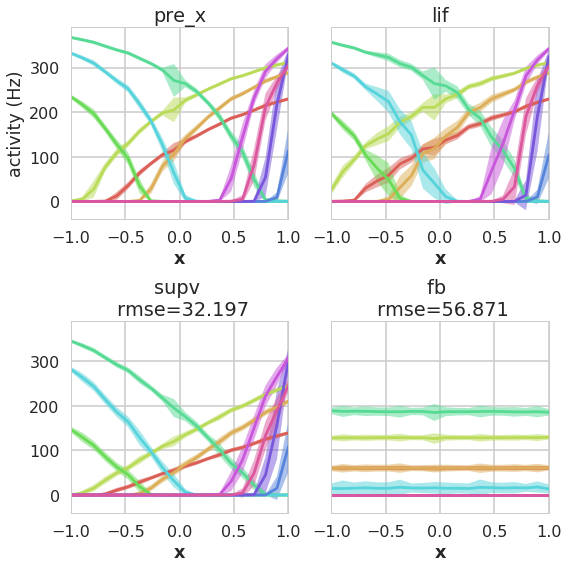

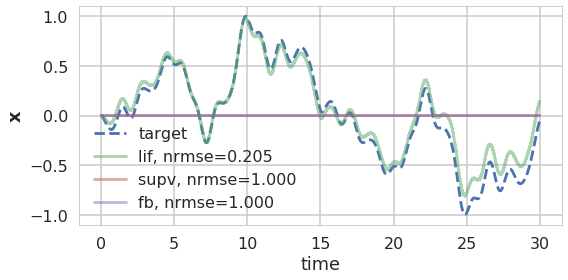

oracle method to compute readout decoders for supv (also d_fb)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

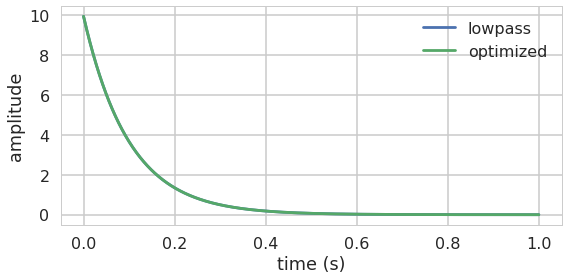

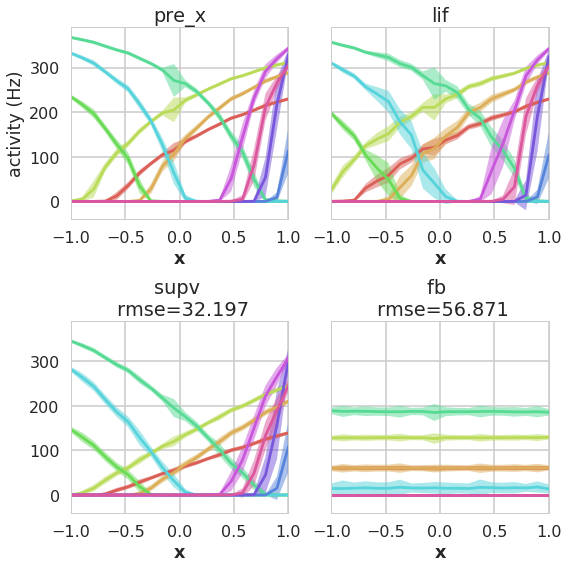

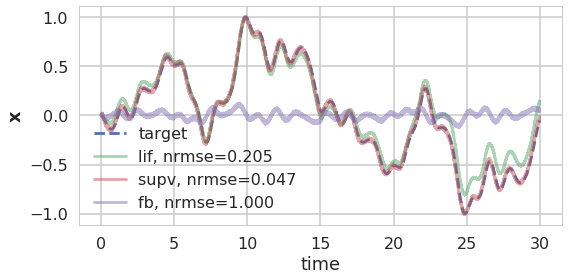

simultaneous encoder and decoder learning for weight matrix fb => fb
[[-2.54757345e-04]
 [-2.59210434e-04]
 [-1.74386343e-04]
 [ 1.76916135e-04]
 [-4.88722808e-04]
 [ 1.02633523e-04]
 [ 5.17470921e-05]
 [-9.61025160e-06]
 [ 3.28985267e-05]
 [-9.15566614e-05]
 [ 2.11697239e-04]
 [ 8.86311742e-05]
 [ 2.09398868e-04]
 [ 1.78088882e-04]
 [-9.00985153e-05]
 [ 2.45295619e-04]
 [ 9.41006109e-05]
 [-6.88563857e-05]
 [-5.43440738e-04]
 [ 1.52694047e-04]
 [ 1.77474788e-04]
 [ 3.04125177e-05]
 [ 2.33299523e-04]
 [-5.57626236e-04]
 [-3.39289540e-06]
 [ 2.52941734e-04]
 [-1.43113862e-04]
 [-1.04048088e-03]
 [ 6.91677591e-04]
 [ 1.55365801e-04]
 [ 2.28811779e-04]
 [-1.69642433e-04]
 [ 1.22410861e-05]
 [-1.02203777e-04]
 [-4.71149656e-04]
 [-3.42387575e-04]
 [ 2.76462537e-05]
 [-2.71666329e-04]
 [-1.05953242e-05]
 [ 5.29687528e-05]
 [-1.13269973e-04]
 [-2.40144481e-04]
 [ 7.99966347e-05]
 [ 2.46414096e-04]
 [ 1.95107028e-04]
 [ 3.22392819e-04]
 [-7.60607485e-05]
 [ 1.27572460e-04]
 [ 2.72755947e-04]


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

[[-2.58146516e-04]
 [-2.62599605e-04]
 [-1.77775514e-04]
 [ 1.80305306e-04]
 [-4.92111979e-04]
 [ 1.06022695e-04]
 [ 5.51362632e-05]
 [ 1.59540593e-05]
 [ 3.62876979e-05]
 [-9.49458326e-05]
 [ 2.15086411e-04]
 [ 9.20203453e-05]
 [ 2.12788039e-04]
 [ 1.81478053e-04]
 [-9.34876864e-05]
 [ 2.48684790e-04]
 [ 9.74897820e-05]
 [-7.22455568e-05]
 [-5.46829909e-04]
 [ 1.56083218e-04]
 [ 1.80863959e-04]
 [ 3.38016888e-05]
 [ 2.36688695e-04]
 [-5.61015407e-04]
 [ 1.59535039e-05]
 [ 2.56330906e-04]
 [-1.46503033e-04]
 [-1.04387006e-03]
 [ 6.95066762e-04]
 [ 1.58754972e-04]
 [ 2.32200950e-04]
 [-1.73031604e-04]
 [-1.59536157e-05]
 [-1.05592948e-04]
 [-4.74538827e-04]
 [-3.45776746e-04]
 [ 3.10354248e-05]
 [-2.75055500e-04]
 [ 1.59543286e-05]
 [ 5.63579239e-05]
 [-1.16659145e-04]
 [-2.43533652e-04]
 [ 8.33858058e-05]
 [ 2.49803267e-04]
 [ 1.98496199e-04]
 [ 3.25781990e-04]
 [-7.94499196e-05]
 [ 1.30961631e-04]
 [ 2.76145118e-04]
 [-2.16128441e-04]
 [-2.33560930e-04]
 [-3.34825962e-04]
 [-3.8531316

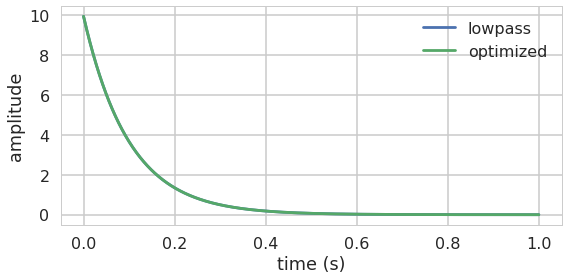

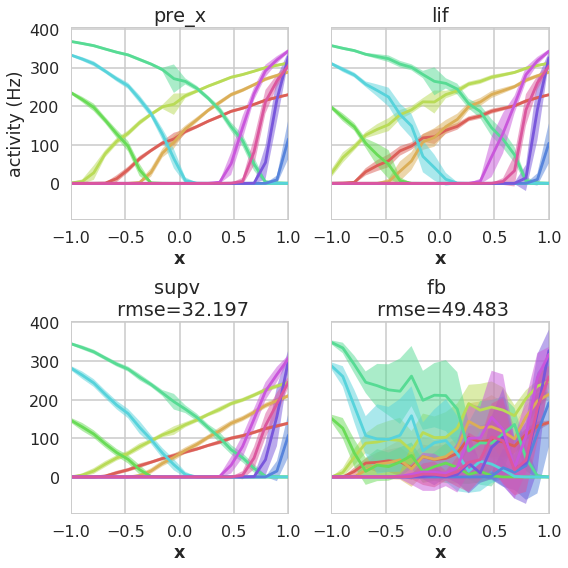

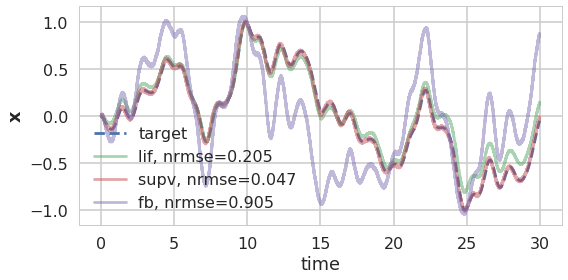

testing (no supervision)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

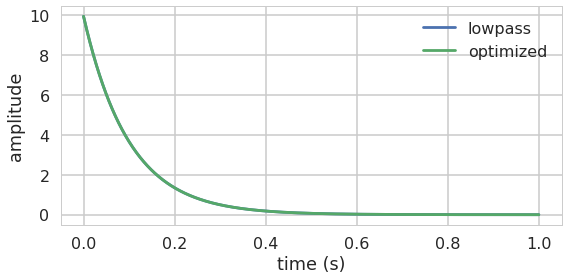

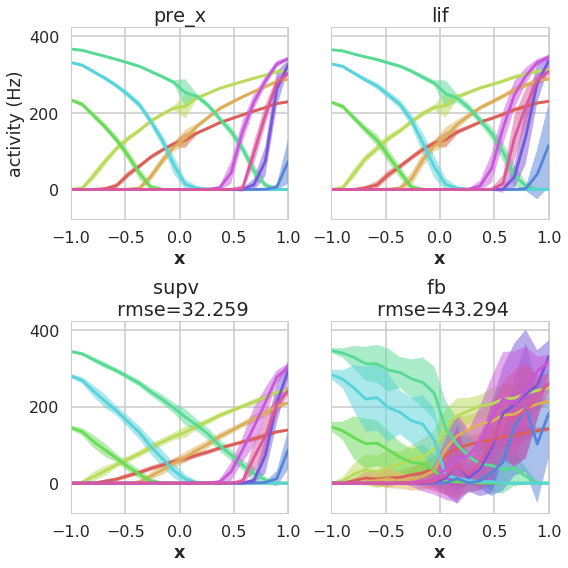

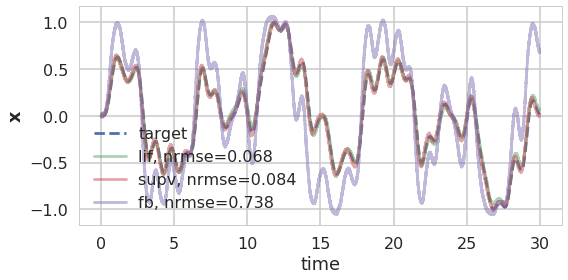

In [23]:
kwargs = dict(
    t=30,
    dt=0.001,
    dt_sample=0.001,
    dt_e=0.01,
    dt_d=0.01,
    n_neurons=100,
    freq=1,
    amp=1,
    alpha=2,
    beta=2,
    max_rates=Default,
    neuron_type=nengo.AdaptiveLIF(tau_n=0.1, inc_n=0.1),
    taus={'network': 0.1, 'readout': 0.1},
    seeds={'ns': 1, 'ss':2, 'es': 3, 'cs': 4, 'ls': 5},
    reg=1e-2,
    eta_e=0e-6,
    eta_d=1e-7,
    n_num=1, 
    n_den=3,
    num_min=0,
    num_max=1,
    den_min=0,
    den_max=1,
    max_evals=1000,
    signal='white_noise')

run(**kwargs)

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

oracle method to compute decoders for weight matrix pre_x => supv


/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:197: UserWarning: y0 (None!=0) does not properly initialize the system; see Nengo issue #1124.
  "Nengo issue #1124." % y0, UserWarning)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

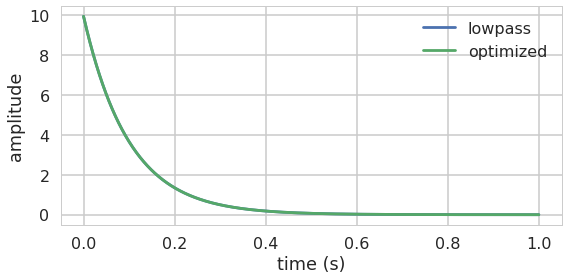

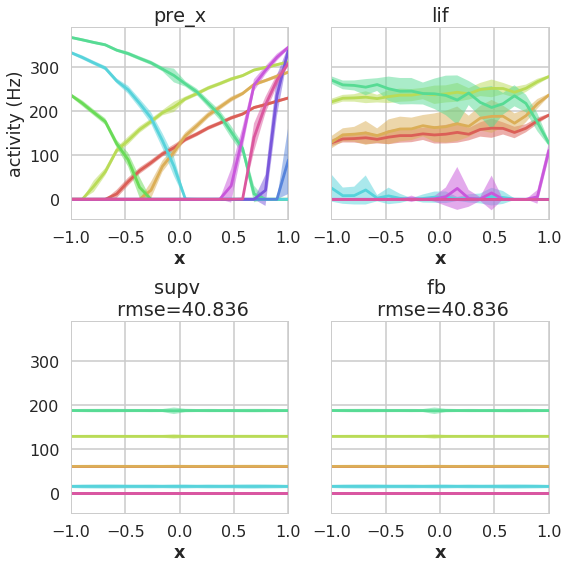

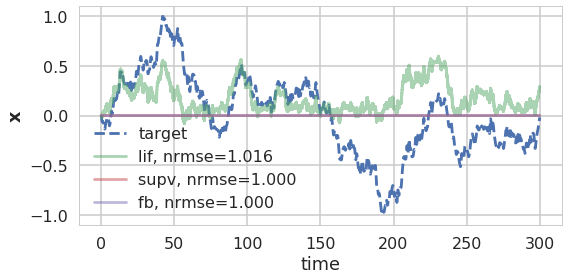

encoder learning for supv


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

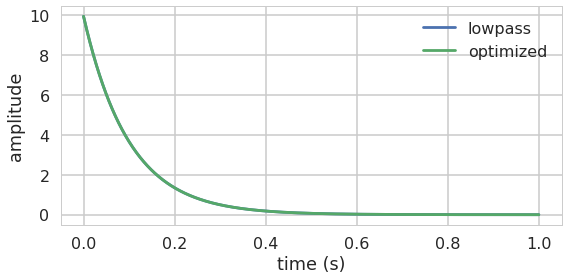

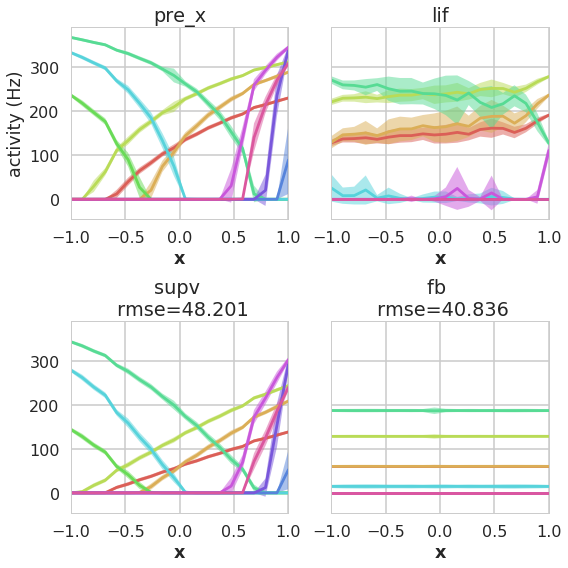

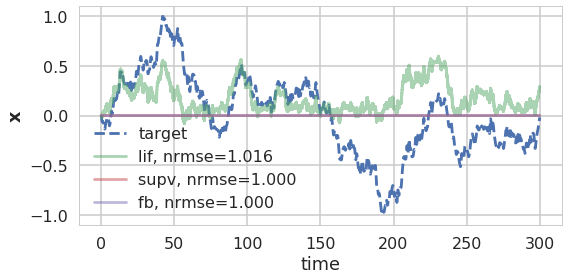

oracle method to compute readout decoders for supv (also d_fb)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

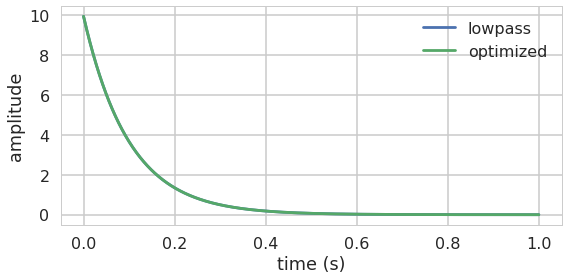

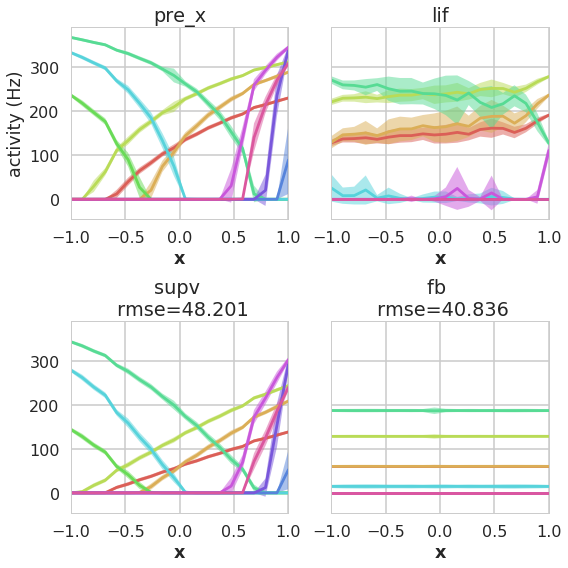

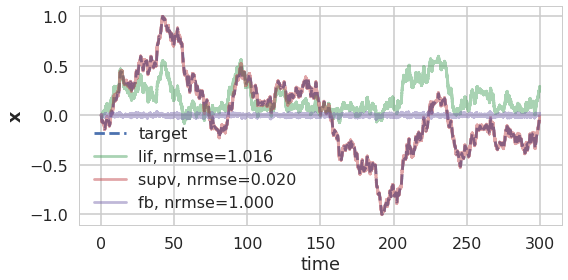

simultaneous encoder and decoder learning for weight matrix fb => fb


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

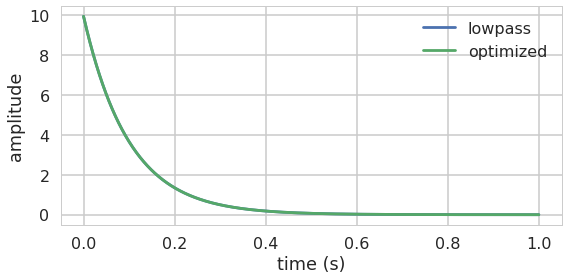

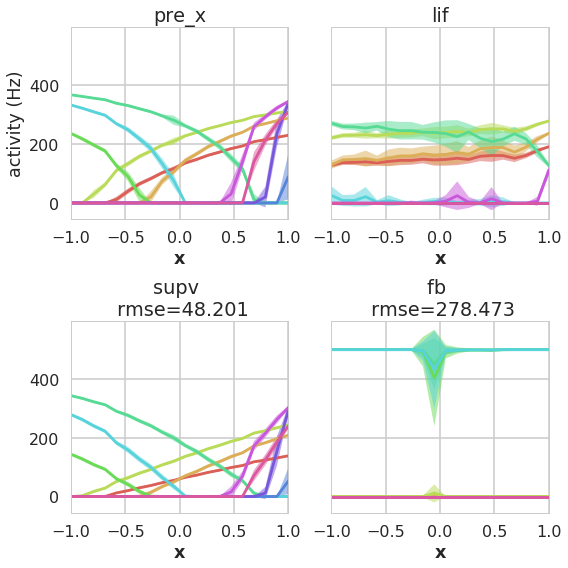

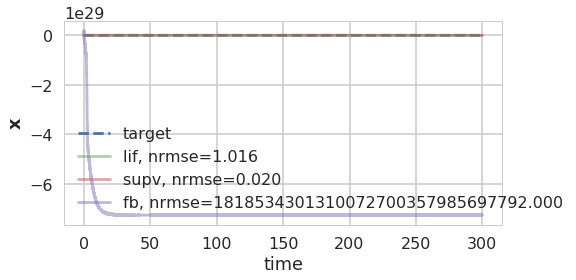

testing (no supervision)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

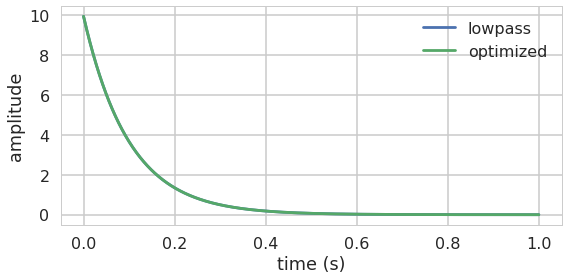

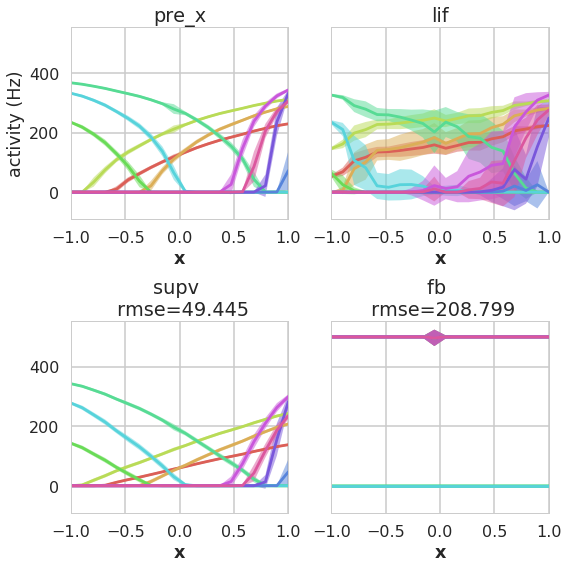

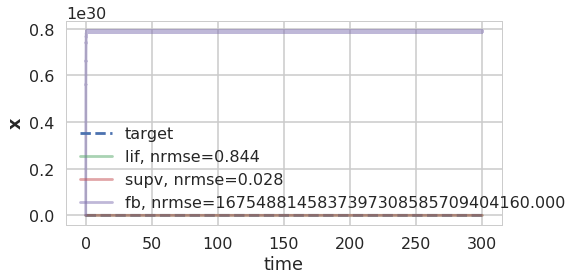

In [20]:
kwargs = dict(
    t=300,
    dt=0.001,
    dt_sample=0.001,
    dt_e=0.01,
    dt_d=0.01,
    n_neurons=100,
    freq=1,
    amp=1,
    alpha=2,
    beta=2,
    max_rates=Default,
    neuron_type=nengo.AdaptiveLIF(tau_n=0.1, inc_n=0.1),
    taus={'network': 0.1, 'readout': 0.1},
    seeds={'ns': 1, 'ss':2, 'es': 3, 'cs': 4, 'ls': 5},
    reg=1e-2,
    eta_e=0e-6,
    eta_d=1e-7,
    n_num=1, 
    n_den=3,
    num_min=0,
    num_max=1,
    den_min=0,
    den_max=1,
    max_evals=1000,
    signal='white_noise')

run(**kwargs)

### encoder and decoder learning

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

oracle method to compute decoders for weight matrix pre_x => supv


/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:197: UserWarning: y0 (None!=0) does not properly initialize the system; see Nengo issue #1124.
  "Nengo issue #1124." % y0, UserWarning)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

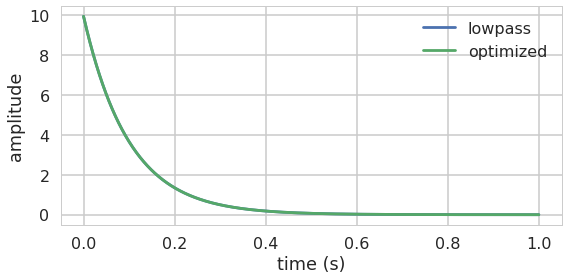

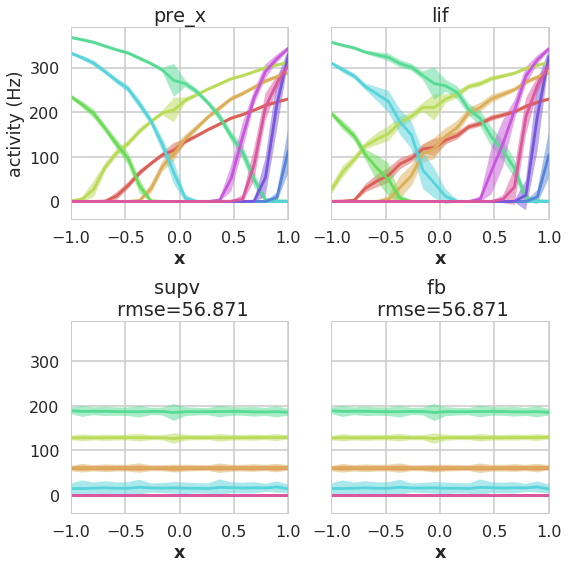

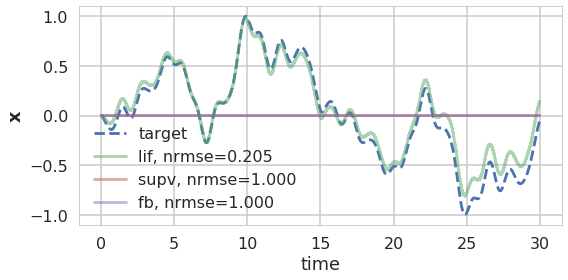

encoder learning for supv


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

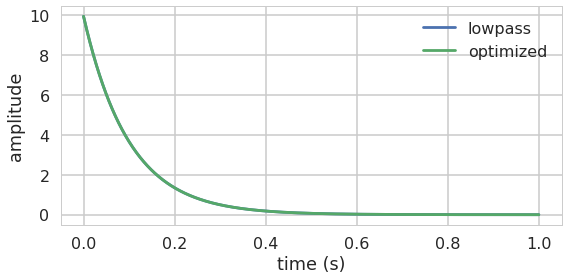

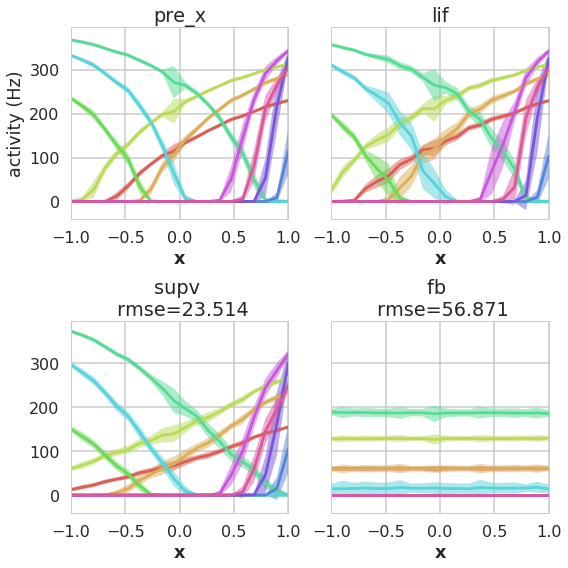

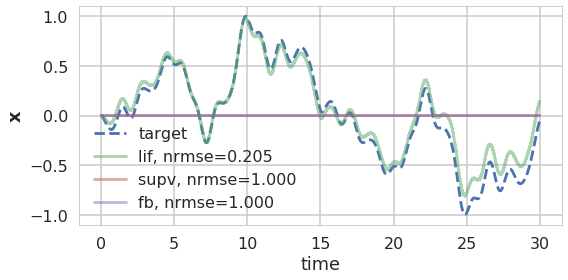

oracle method to compute readout decoders for supv (also d_fb)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

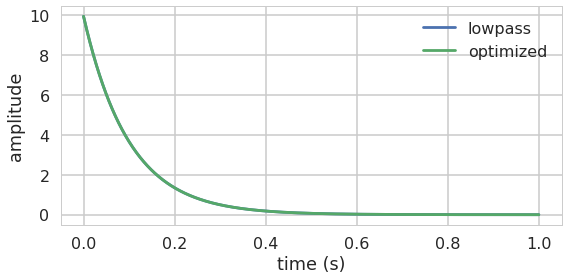

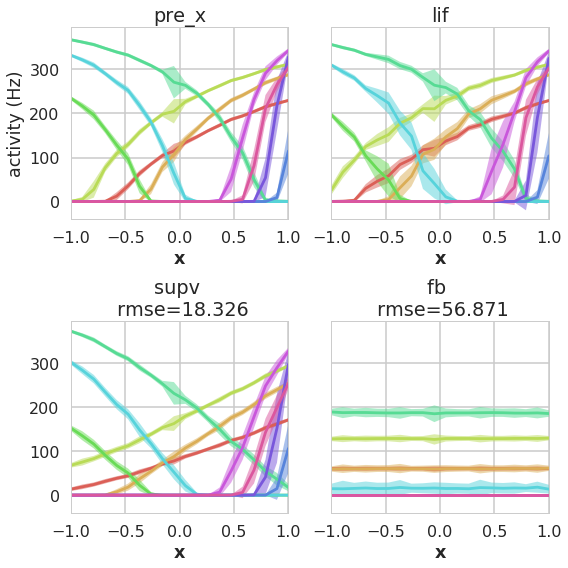

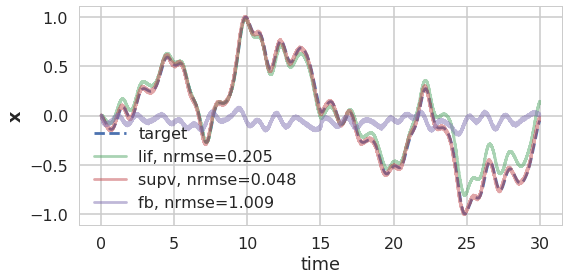

simultaneous encoder and decoder learning for weight matrix fb => fb


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

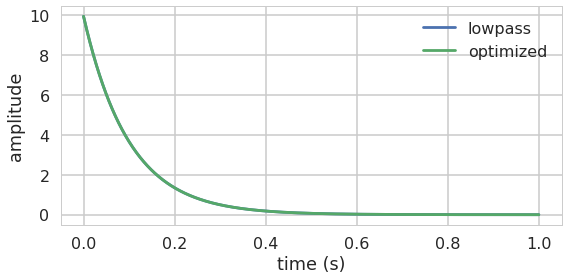

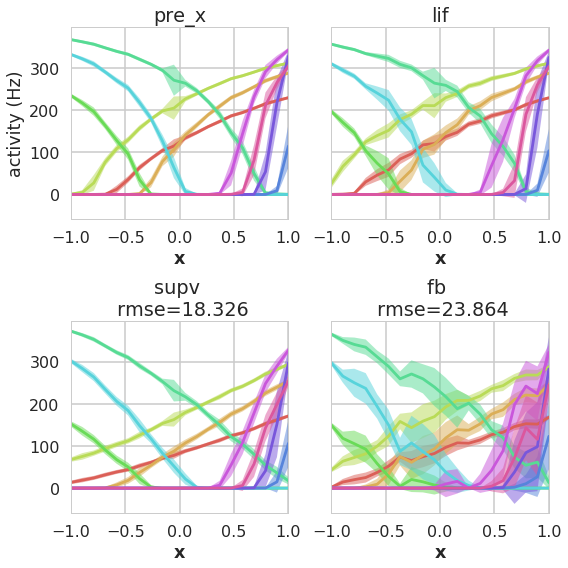

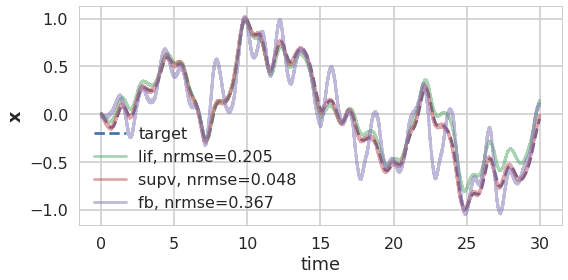

testing (no supervision)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

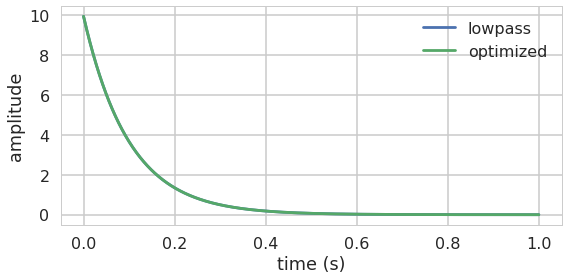

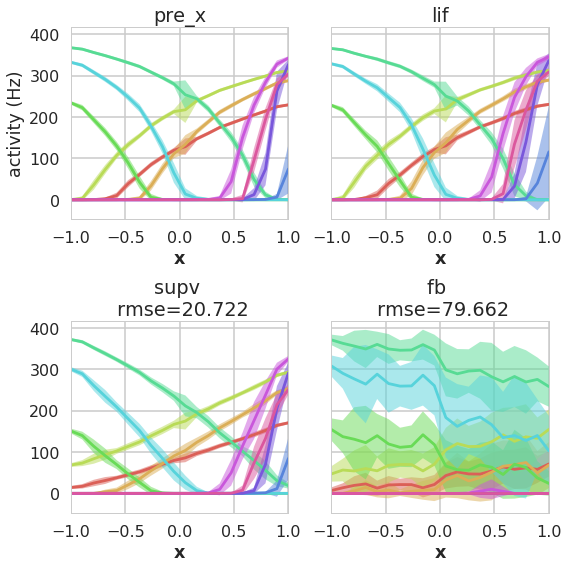

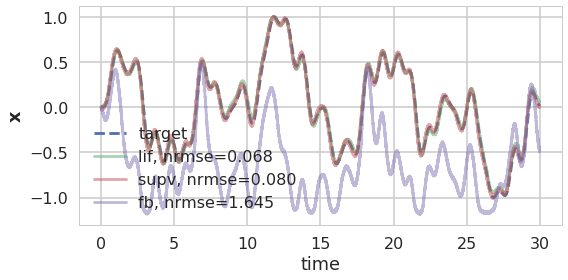

In [30]:
kwargs = dict(
    t=30,
    dt=0.001,
    dt_sample=0.001,
    dt_e=0.01,
    dt_d=0.01,
    n_neurons=100,
    freq=1,
    amp=1,
    alpha=2,
    beta=2,
    max_rates=Default,
    neuron_type=nengo.AdaptiveLIF(tau_n=0.1, inc_n=0.1),
    taus={'network': 0.1, 'readout': 0.1},
    seeds={'ns': 1, 'ss':2, 'es': 3, 'cs': 4, 'ls': 5},
    reg=1e-2,
    eta_e=3e-6,
    eta_d=3e-7,
    n_num=1, 
    n_den=3,
    num_min=0,
    num_max=1,
    den_min=0,
    den_max=1,
    max_evals=1000,
    signal='white_noise')

run(**kwargs)

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

oracle method to compute decoders for weight matrix pre_x => supv


/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:197: UserWarning: y0 (None!=0) does not properly initialize the system; see Nengo issue #1124.
  "Nengo issue #1124." % y0, UserWarning)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

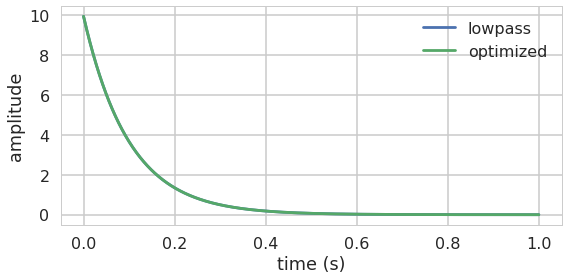

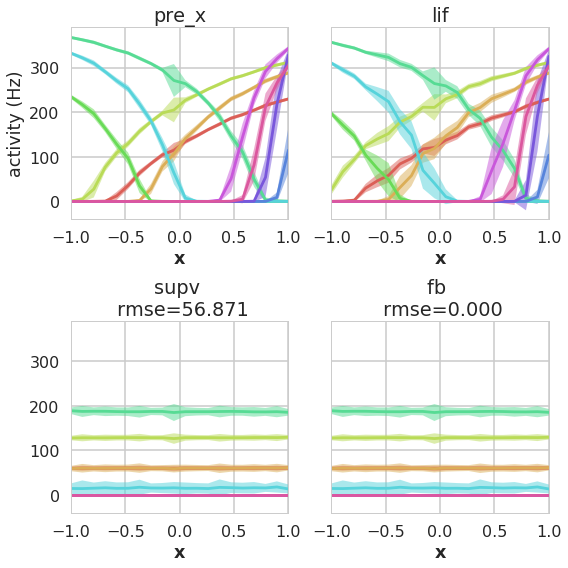

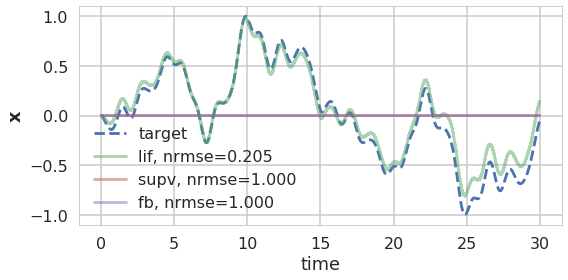

encoder learning for supv


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

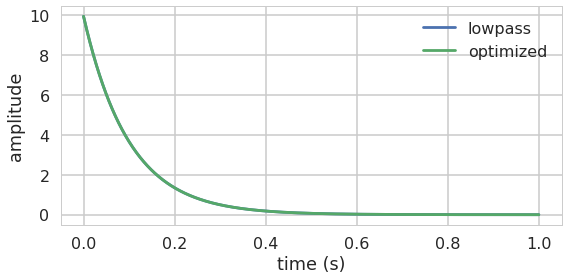

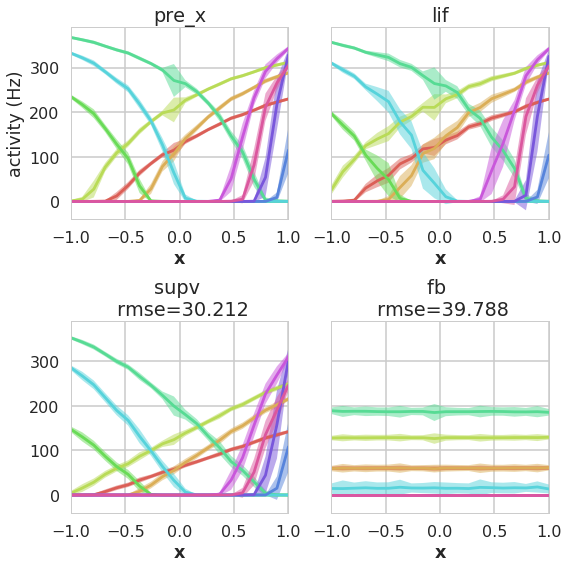

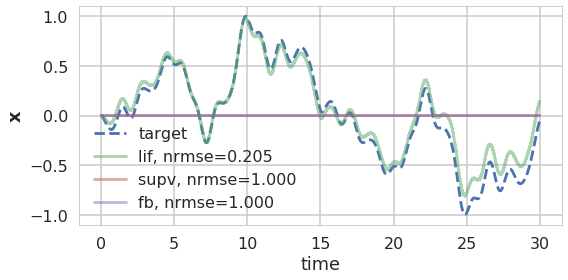

oracle method to compute readout decoders for supv (also d_fb)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

filter optimization for computing x_supv from spk_supv and d_supv


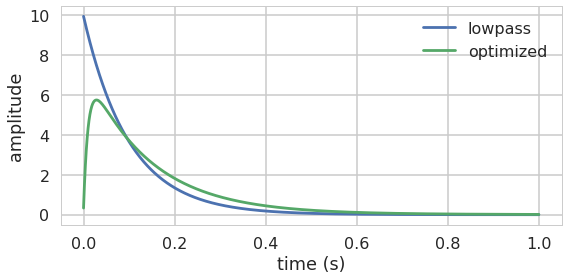

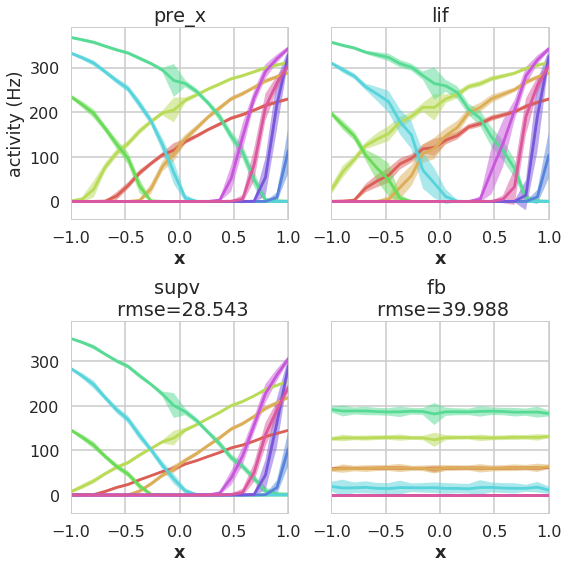

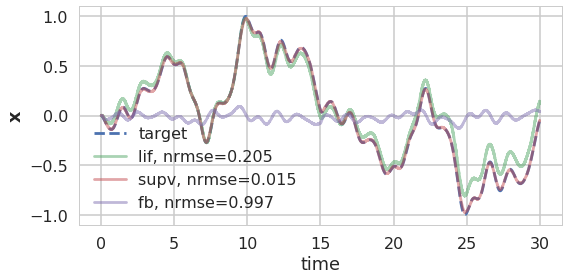

testing (no supervision)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

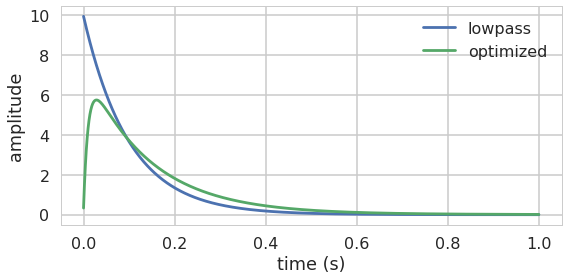

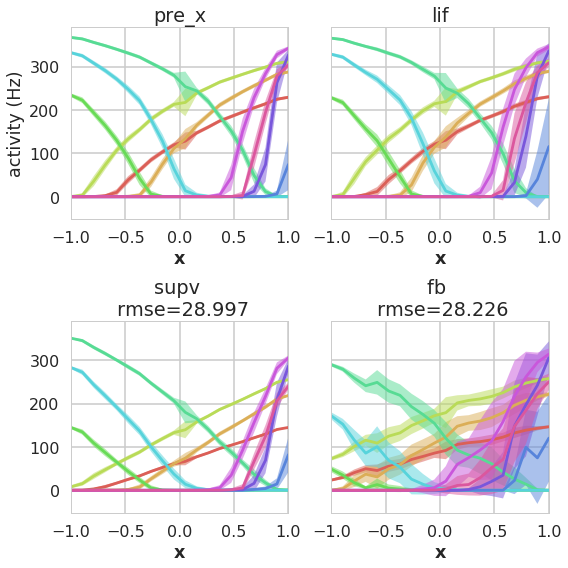

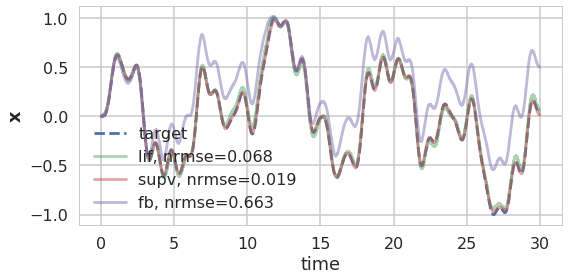

In [50]:
kwargs = dict(
    t=30,
    dt=0.001,
    dt_sample=0.001,
    dt_e=0.01,
    dt_d=0.01,
    n_neurons=100,
    freq=1,
    amp=1,
    alpha=2,
    beta=2,
    max_rates=Default,
    neuron_type=nengo.AdaptiveLIF(tau_n=0.1, inc_n=0.1),
    taus={'network': 0.1, 'readout': 0.1, 'learn': 0.1},
    seeds={'ns': 1, 'ss':2, 'es': 3, 'cs': 4, 'ls': 5},
    reg=1e-2,
    eta_e=1e-6,
    eta_d=1e-7,
    n_num=1, 
    n_den=3,
    num_min=0,
    num_max=1,
    den_min=0,
    den_max=1,
    max_evals=1000,
    signal='white_noise')

run(recurrent_learning=False, **kwargs)

## Wilson Neuron

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

oracle method to compute decoders for weight matrix pre_x => supv


/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:197: UserWarning: y0 (None!=0) does not properly initialize the system; see Nengo issue #1124.
  "Nengo issue #1124." % y0, UserWarning)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

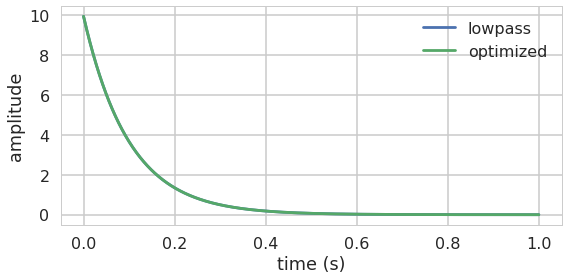

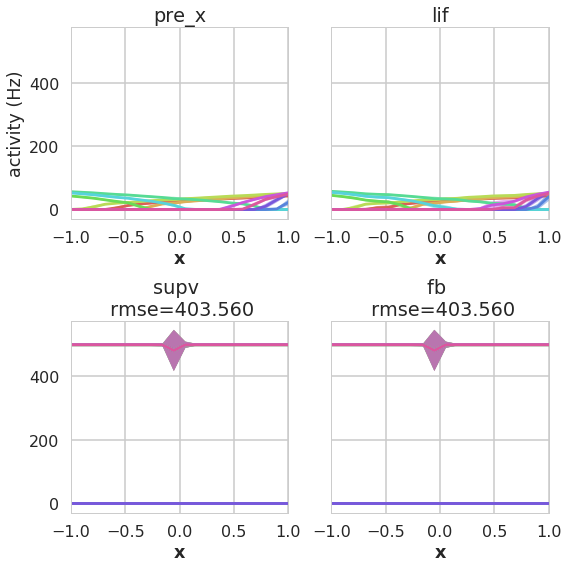

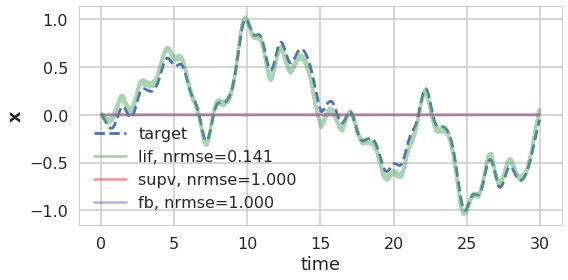

encoder learning for supv


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

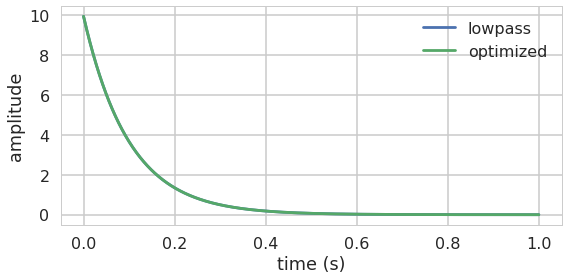

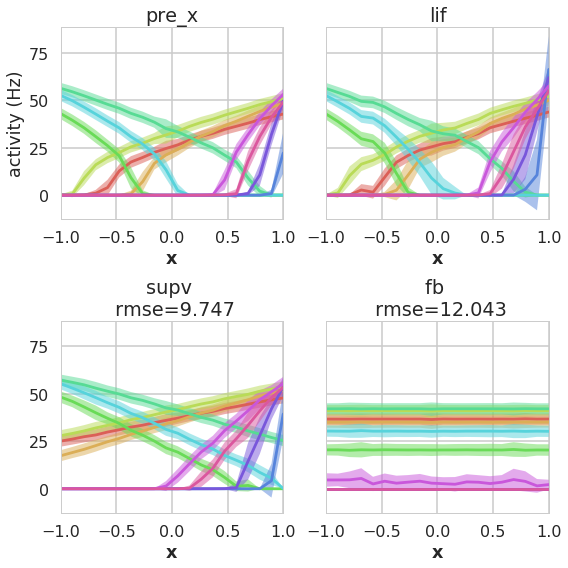

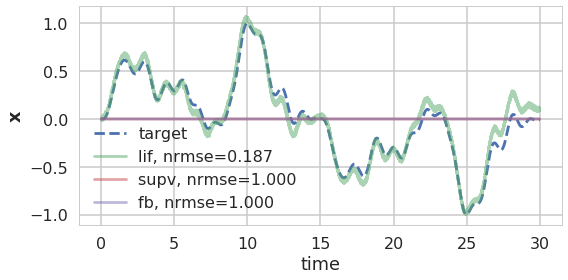

oracle method to compute readout decoders for supv (also d_fb)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

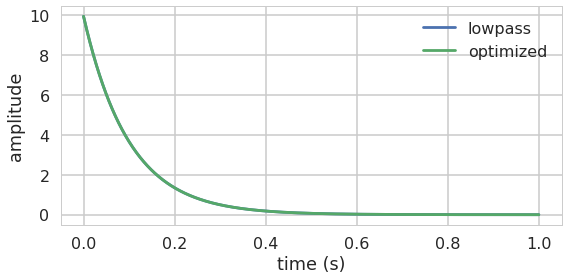

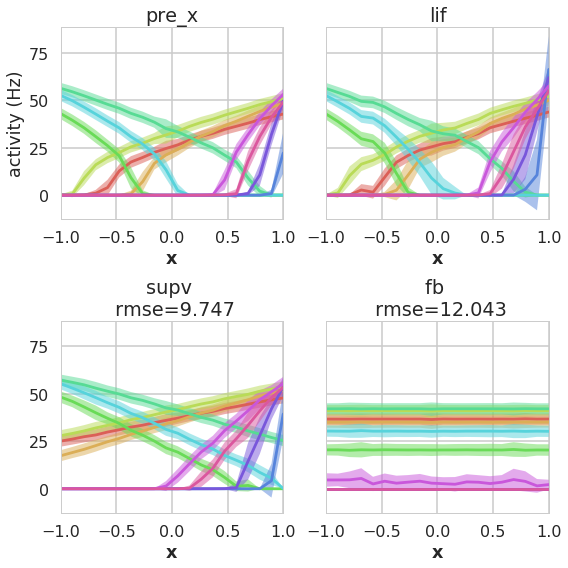

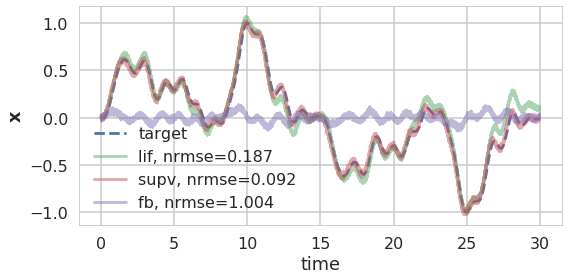

simultaneous encoder and decoder learning for weight matrix fb => fb


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

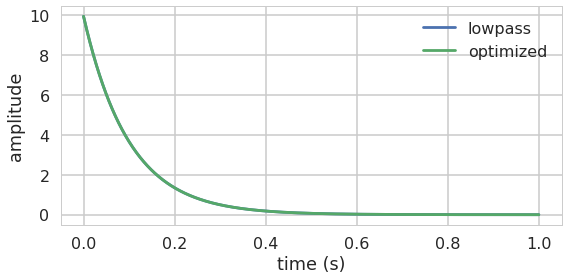

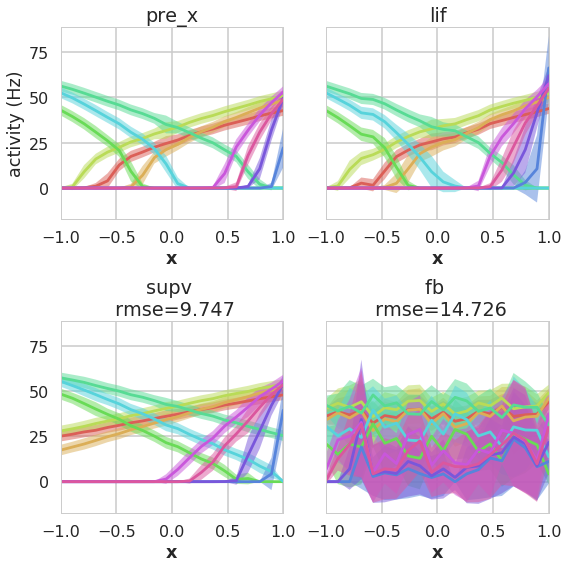

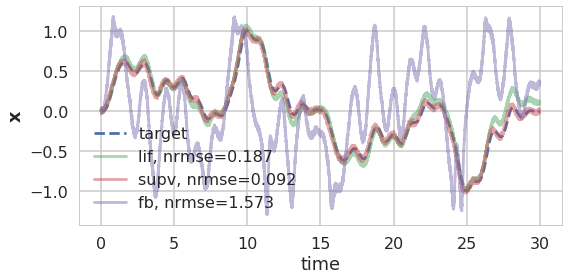

testing (no supervision)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

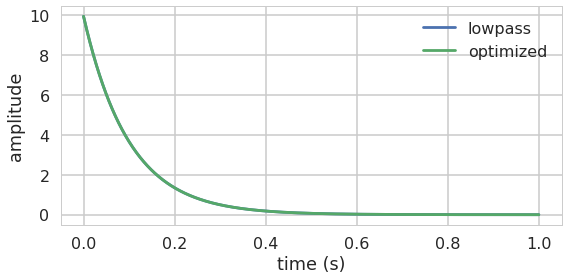

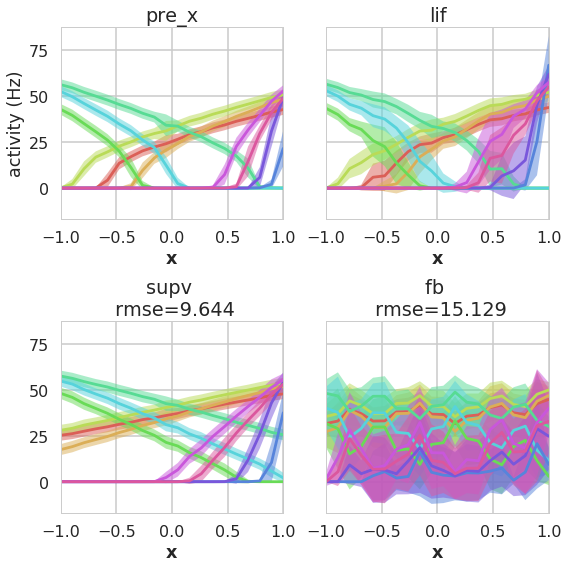

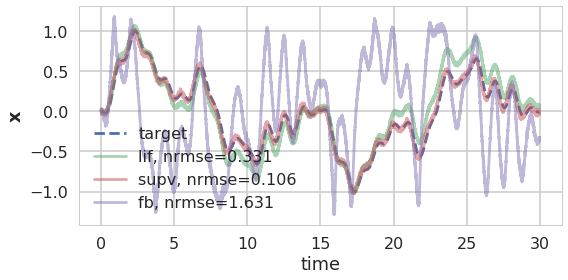

In [17]:
kwargs = dict(
    t=30,
    dt=0.00005,
    dt_sample=0.001,
    n_neurons=100,
    dt_e=0.01,
    dt_d=0.01,
    freq=1,
    amp=1,
    alpha=1,
    beta=1,
    max_rates=Uniform(40, 60),
    neuron_type=WilsonNeuron(),
    taus={'network': 0.1, 'readout': 0.1},
    seeds={'ns': 1, 'ss':2, 'es': 3, 'cs': 4, 'ls': 5},
    reg=1e-2,
    eta_e=0e-6,
    eta_d=0e-7,
    n_num=1, 
    n_den=3,
    num_min=0,
    num_max=1,
    den_min=0,
    den_max=1,
    max_evals=1000,
    signal='white_noise')

run(**kwargs)

### encoder learning

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

oracle method to compute decoders for weight matrix pre_x => supv


/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:197: UserWarning: y0 (None!=0) does not properly initialize the system; see Nengo issue #1124.
  "Nengo issue #1124." % y0, UserWarning)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

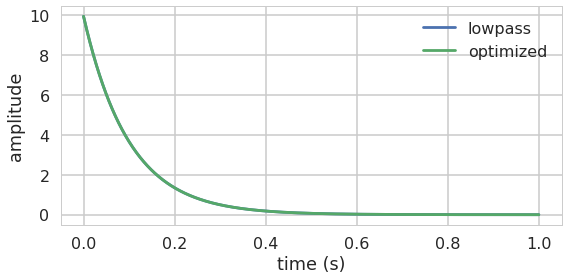

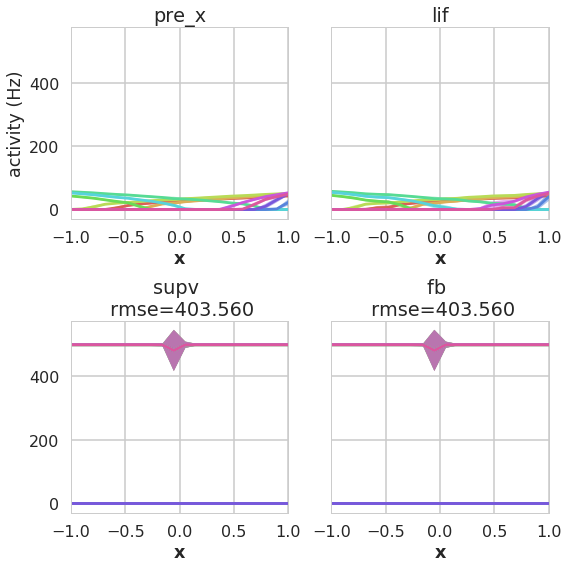

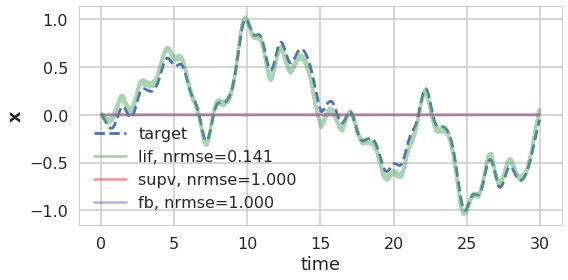

encoder learning for supv


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

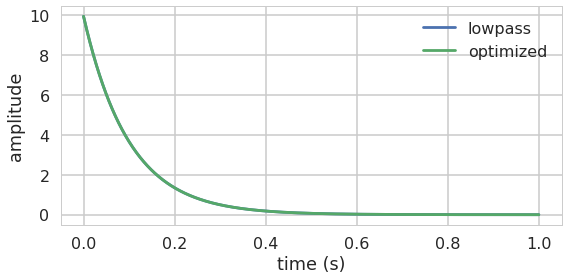

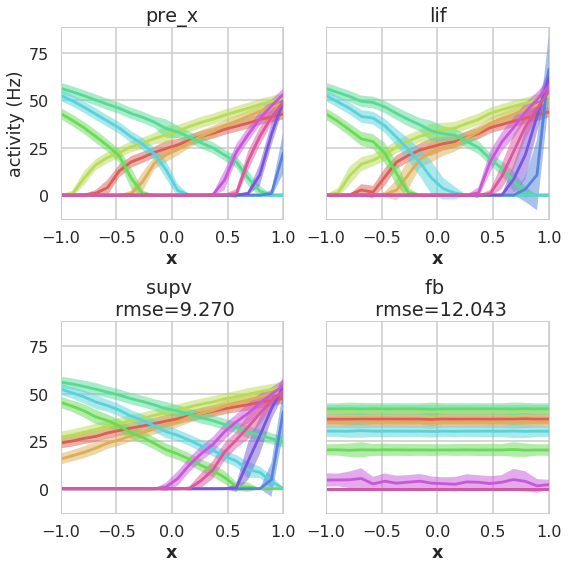

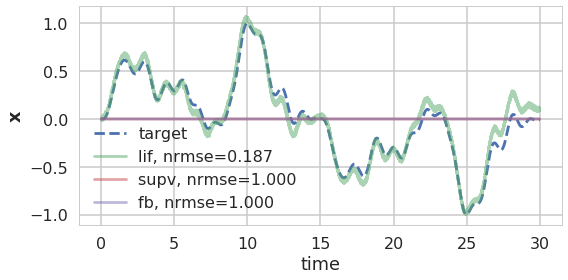

oracle method to compute readout decoders for supv (also d_fb)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

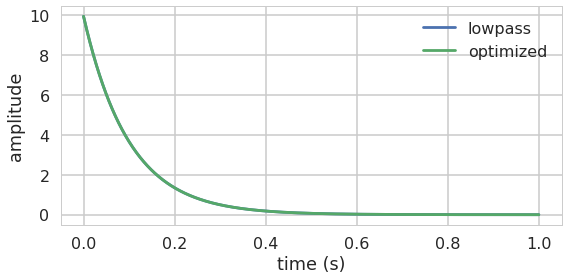

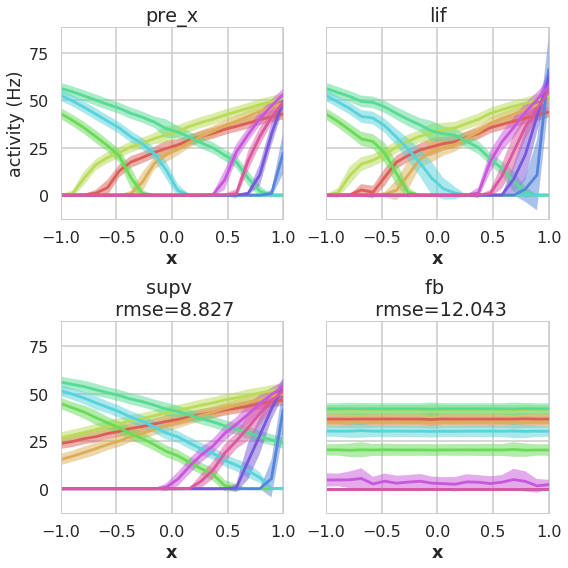

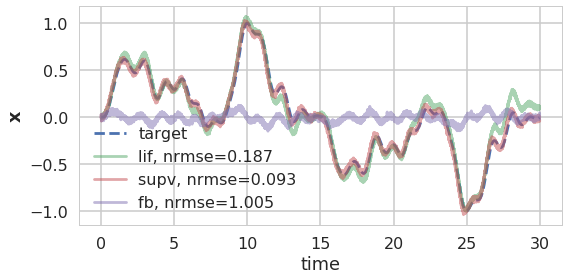

simultaneous encoder and decoder learning for weight matrix fb => fb


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

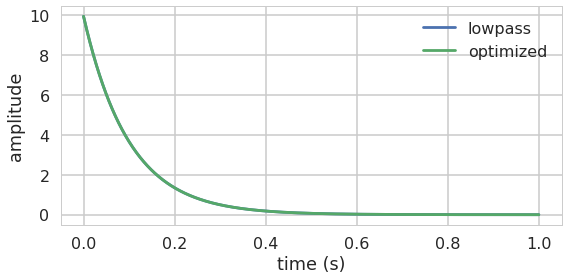

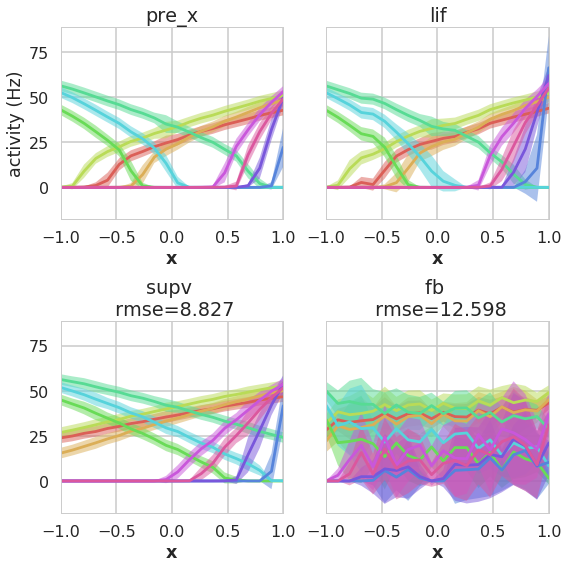

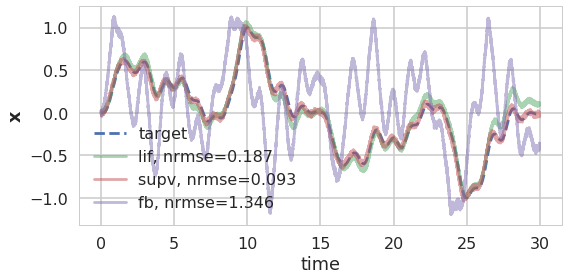

testing (no supervision)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

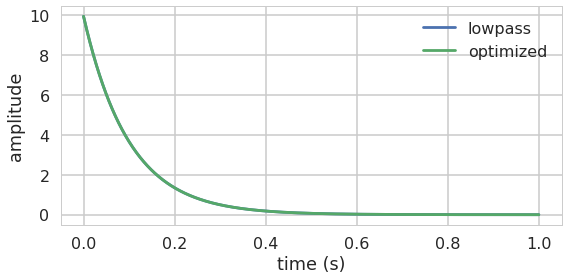

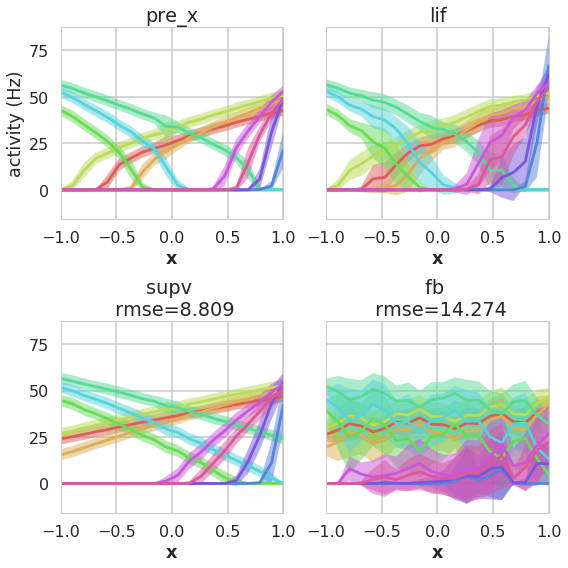

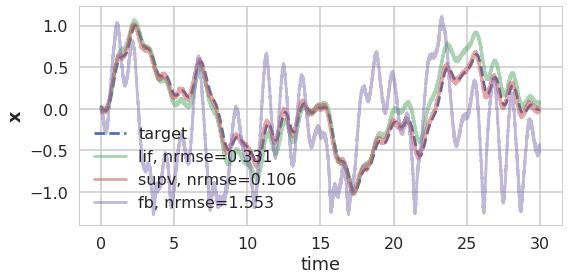

In [18]:
kwargs = dict(
    t=30,
    dt=0.00005,
    dt_sample=0.001,
    n_neurons=100,
    dt_e=0.01,
    dt_d=0.01,
    freq=1,
    amp=1,
    alpha=1,
    beta=1,
    max_rates=Uniform(40, 60),
    neuron_type=WilsonNeuron(),
    taus={'network': 0.1, 'readout': 0.1},
    seeds={'ns': 1, 'ss':2, 'es': 3, 'cs': 4, 'ls': 5},
    reg=1e-2,
    eta_e=3e-6,
    eta_d=0e-7,
    n_num=1, 
    n_den=3,
    num_min=0,
    num_max=1,
    den_min=0,
    den_max=1,
    max_evals=1000,
    signal='white_noise')

run(**kwargs)

### decoder learning

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

oracle method to compute decoders for weight matrix pre_x => supv


/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:197: UserWarning: y0 (None!=0) does not properly initialize the system; see Nengo issue #1124.
  "Nengo issue #1124." % y0, UserWarning)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

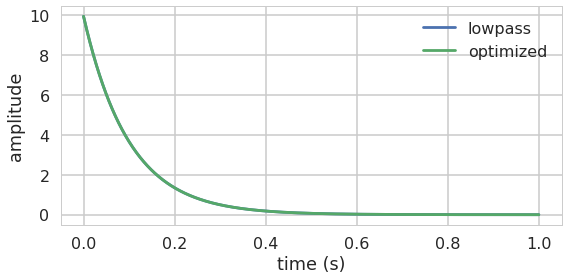

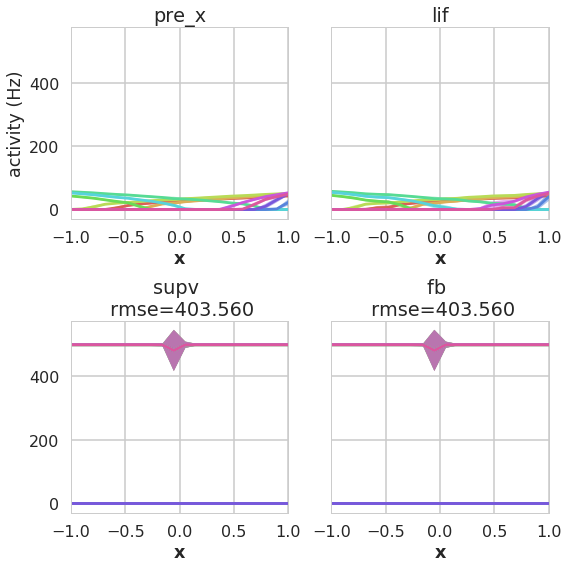

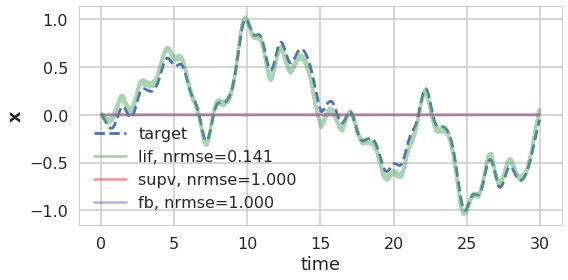

encoder learning for supv


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

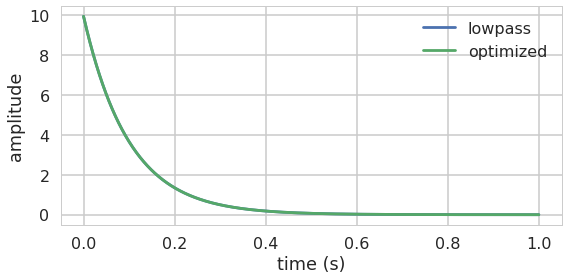

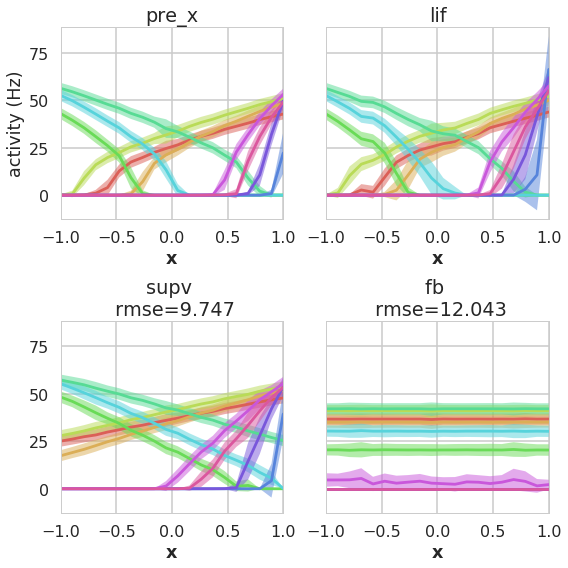

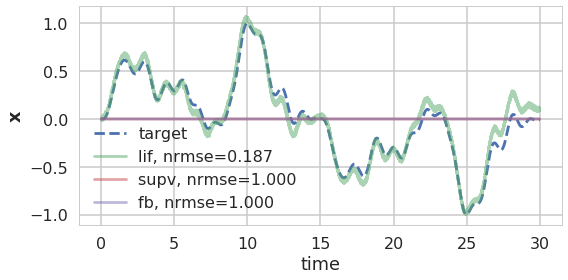

oracle method to compute readout decoders for supv (also d_fb)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

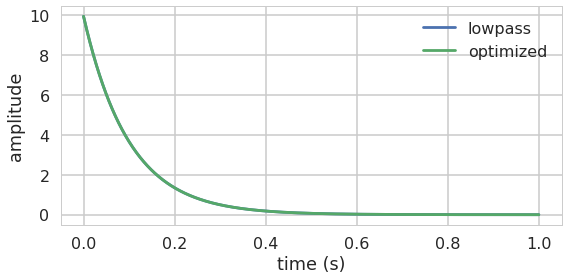

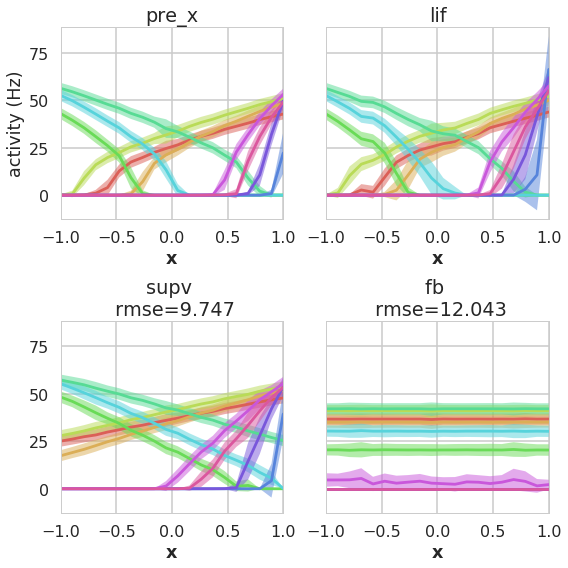

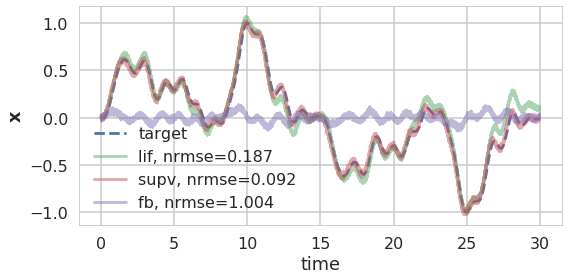

simultaneous encoder and decoder learning for weight matrix fb => fb


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

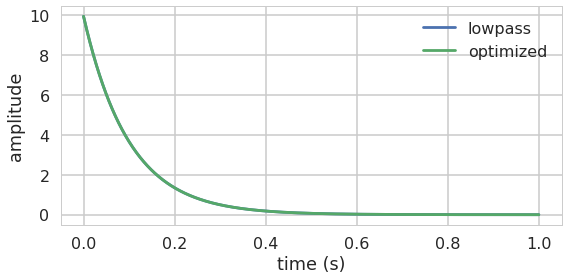

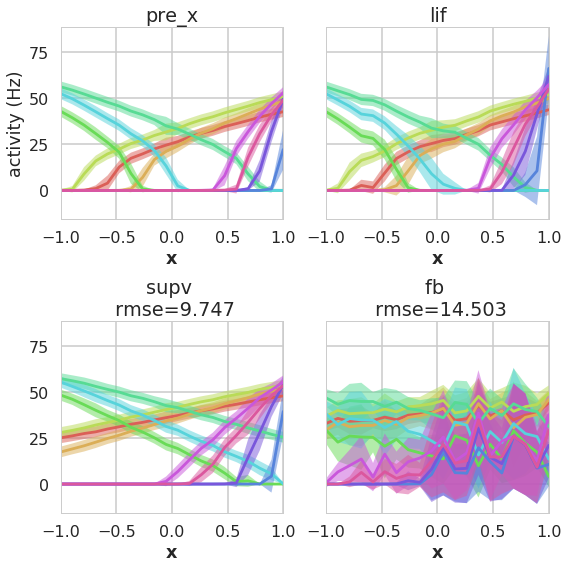

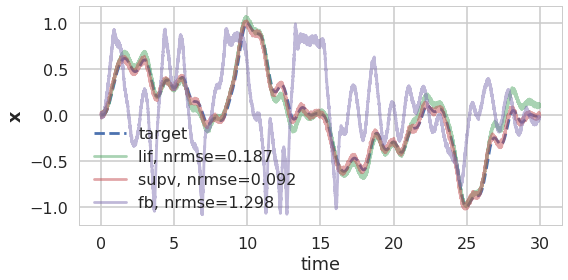

testing (no supervision)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

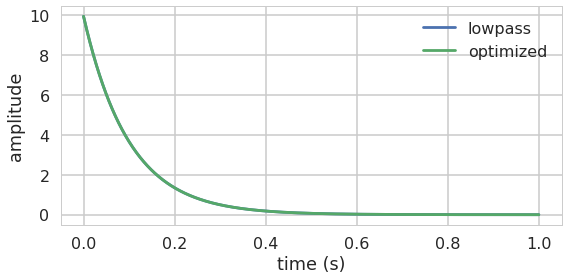

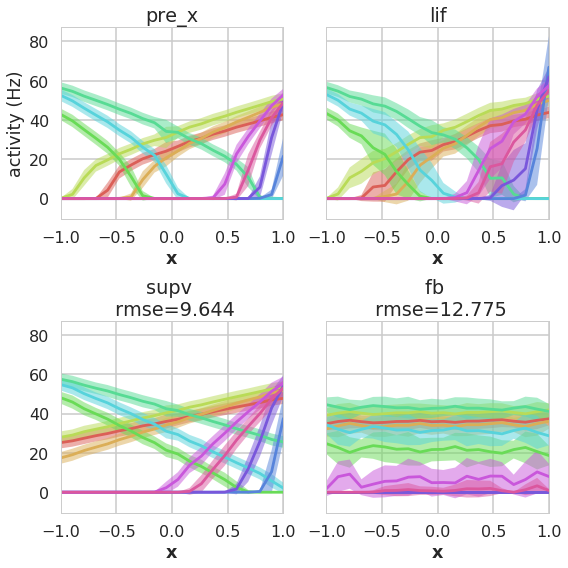

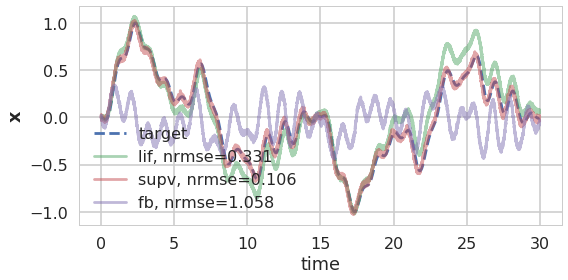

In [19]:
kwargs = dict(
    t=30,
    dt=0.00005,
    dt_sample=0.001,
    n_neurons=100,
    dt_e=0.01,
    dt_d=0.01,
    freq=1,
    amp=1,
    alpha=1,
    beta=1,
    max_rates=Uniform(40, 60),
    neuron_type=WilsonNeuron(),
    taus={'network': 0.1, 'readout': 0.1},
    seeds={'ns': 1, 'ss':2, 'es': 3, 'cs': 4, 'ls': 5},
    reg=1e-2,
    eta_e=0e-6,
    eta_d=3e-7,
    n_num=1, 
    n_den=3,
    num_min=0,
    num_max=1,
    den_min=0,
    den_max=1,
    max_evals=1000,
    signal='white_noise')

run(**kwargs)

### filter

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

oracle method to compute decoders for weight matrix pre_x => supv


/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:197: UserWarning: y0 (None!=0) does not properly initialize the system; see Nengo issue #1124.
  "Nengo issue #1124." % y0, UserWarning)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

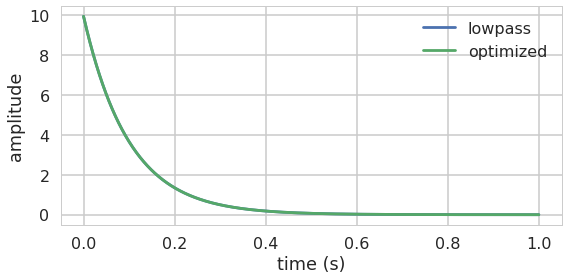

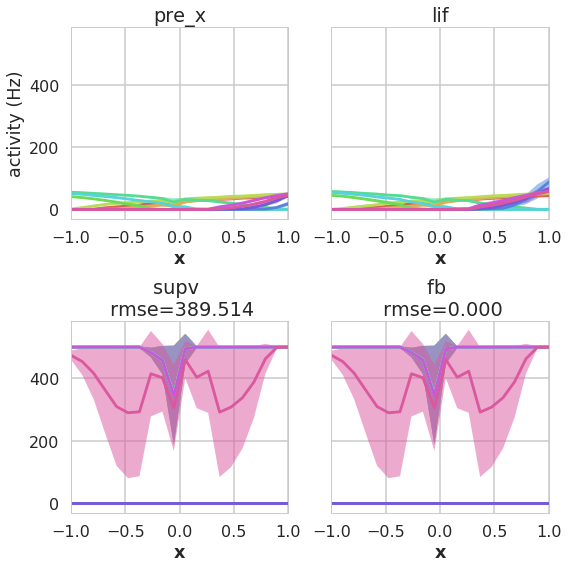

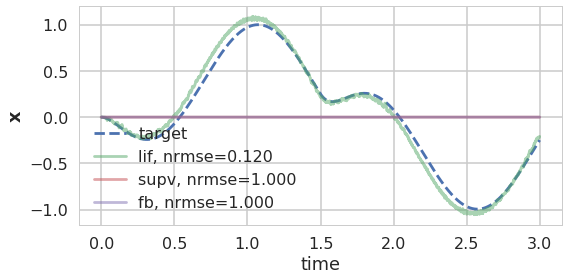

encoder learning for supv


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

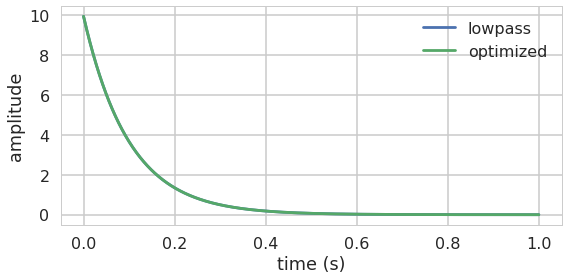

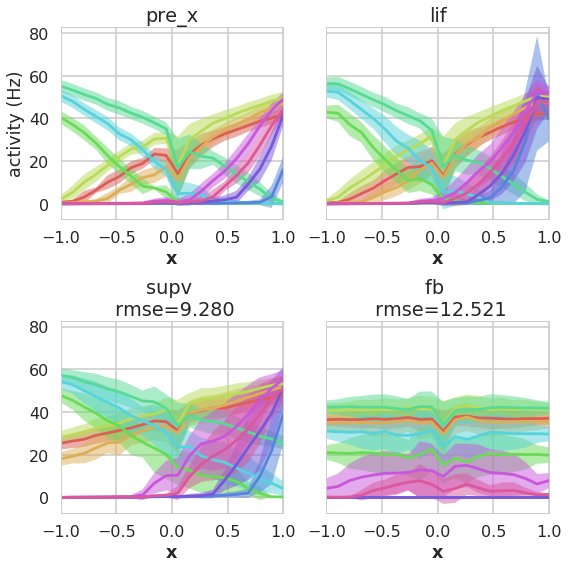

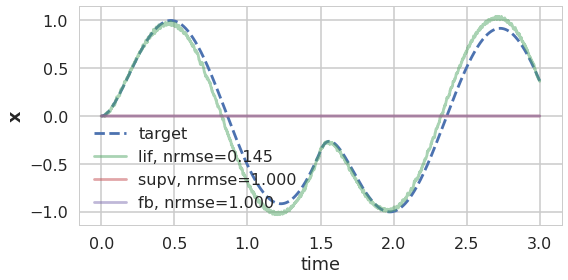

oracle method to compute readout decoders for supv (also d_fb)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

filter optimization for computing x_supv from spk_supv and d_supv


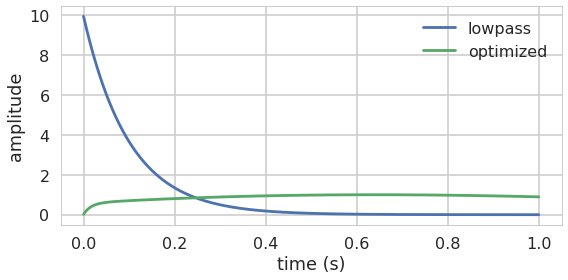

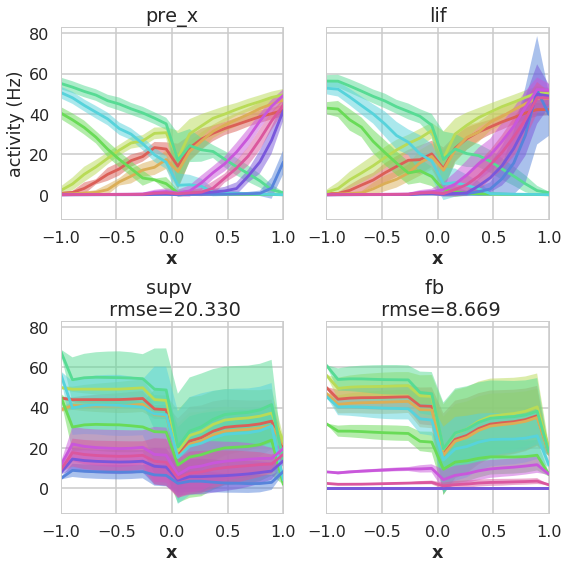

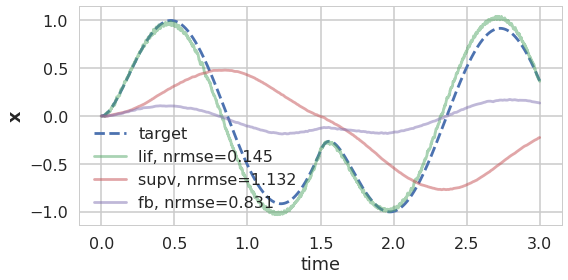

simultaneous encoder and decoder learning for weight matrix fb => fb
iteration 0
beginning encoders
[[ 1.  1.  1. ...  1.  1.  1.]
 [ 1.  1.  1. ...  1.  1.  1.]
 [ 1.  1.  1. ...  1.  1.  1.]
 ...
 [-1. -1. -1. ... -1. -1. -1.]
 [-1. -1. -1. ... -1. -1. -1.]
 [ 1.  1.  1. ...  1.  1.  1.]]


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

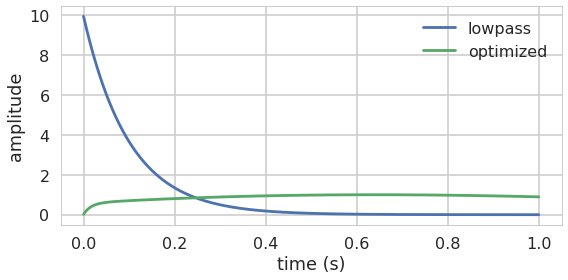

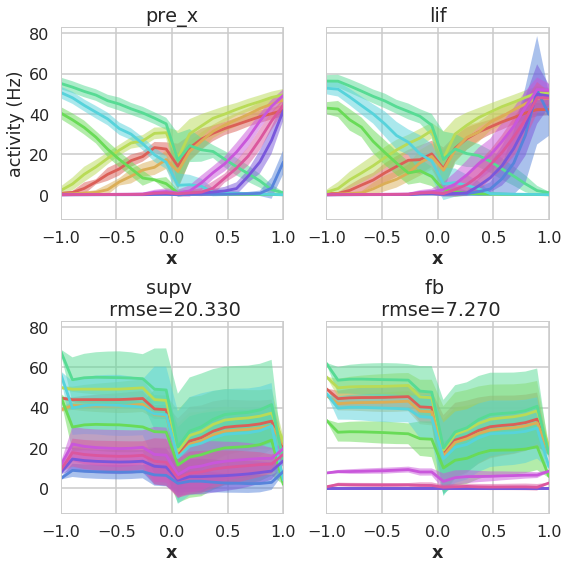

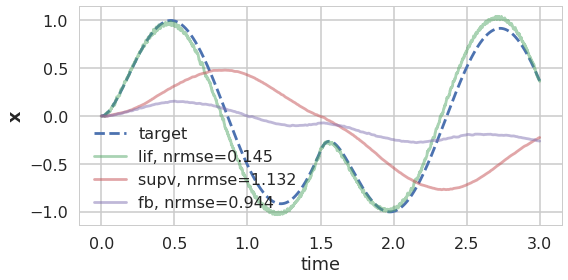

returned encoders
[[ 1.  1.  1. ...  1.  1.  1.]
 [ 1.  1.  1. ...  1.  1.  1.]
 [ 1.  1.  1. ...  1.  1.  1.]
 ...
 [-1. -1. -1. ... -1. -1. -1.]
 [-1. -1. -1. ... -1. -1. -1.]
 [ 1.  1.  1. ...  1.  1.  1.]]
testing (no supervision)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

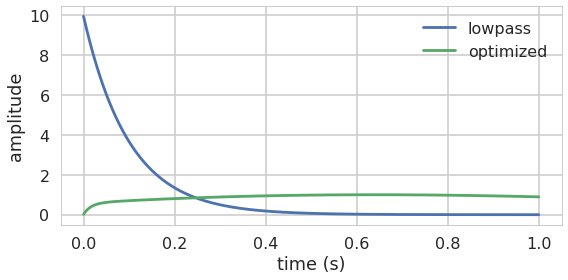

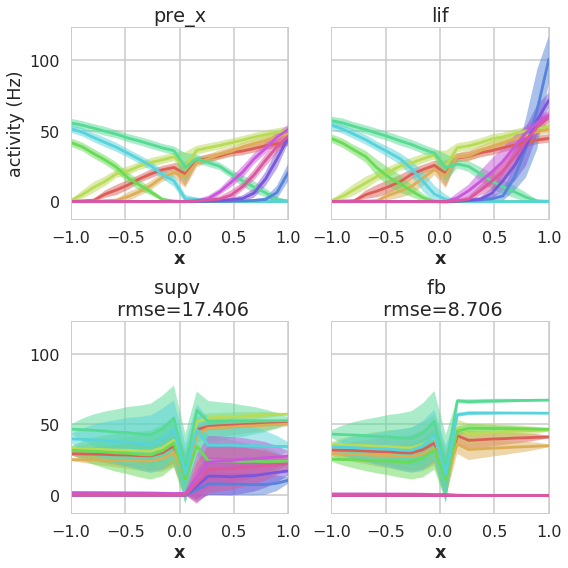

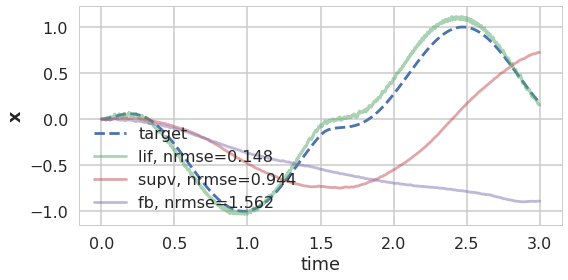

In [46]:
kwargs = dict(
    t=3,
    dt=0.00005,
    dt_sample=0.001,
    n_neurons=100,
    dt_e=0.01,
    dt_d=0.01,
    freq=1,
    amp=1,
    alpha=1,
    beta=1,
    max_rates=Uniform(40, 60),
    neuron_type=WilsonNeuron(),
    taus={'network': 0.1, 'readout': 0.1, 'learn': 0.1},
    seeds={'ns': 1, 'ss':2, 'es': 3, 'cs': 4, 'ls': 5},
    reg=1e-2,
    eta_e=0e-6,
    eta_d=0e-7,
    n_num=1, 
    n_den=3,
    num_min=0,
    num_max=1,
    den_min=0,
    den_max=1,
    max_evals=100,
    signal='white_noise')

run(**kwargs)

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

oracle method to compute decoders for weight matrix pre_x => supv


/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:197: UserWarning: y0 (None!=0) does not properly initialize the system; see Nengo issue #1124.
  "Nengo issue #1124." % y0, UserWarning)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

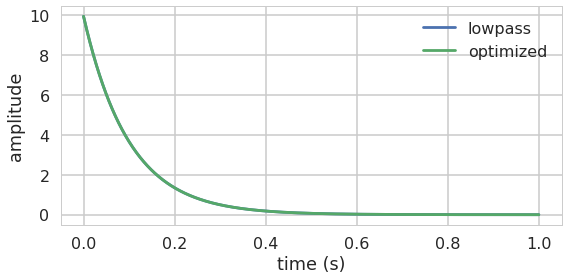

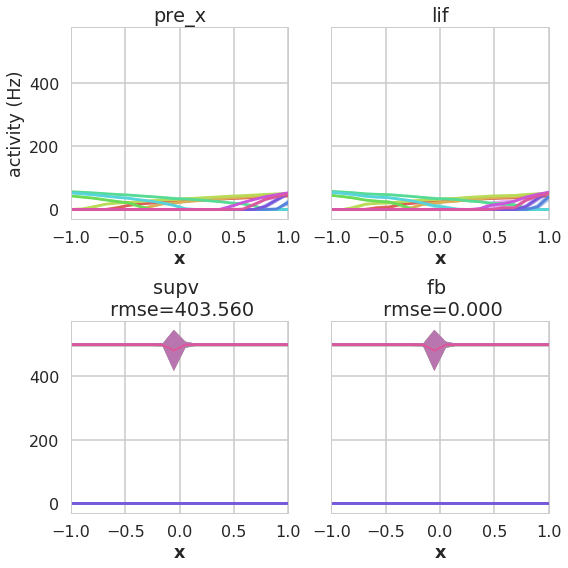

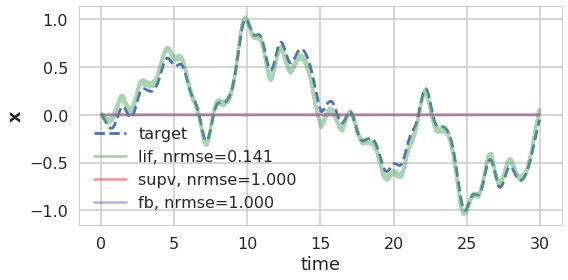

encoder learning for supv


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

KeyboardInterrupt: 

In [47]:
kwargs = dict(
    t=30,
    dt=0.00005,
    dt_sample=0.001,
    n_neurons=100,
    dt_e=0.01,
    dt_d=0.01,
    freq=1,
    amp=1,
    alpha=1,
    beta=1,
    max_rates=Uniform(40, 60),
    neuron_type=WilsonNeuron(),
    taus={'network': 0.1, 'readout': 0.1, 'learn': 0.1},
    seeds={'ns': 1, 'ss':2, 'es': 3, 'cs': 4, 'ls': 5},
    reg=1e-2,
    eta_e=0e-6,
    eta_d=0e-7,
    n_num=1, 
    n_den=3,
    num_min=0,
    num_max=1,
    den_min=0,
    den_max=1,
    max_evals=10000,
    signal='white_noise')

run(**kwargs)